<a href="https://colab.research.google.com/github/hmachefe/Python-Data-Analysis-Visualization-Masterclass/blob/main/Python_Data_Analysis_%26_Visualization_Masterclass_Part_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# 164. Splitting Text Values With Split()
import pandas as pd
titanic = pd.read_csv('/content/drive/MyDrive/DataAnalysis/data/titanic.csv')
titanic

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest
0,1,1,"Allen, Miss. Elisabeth Walton",female,29,0,0,24160,211.3375,B5,S,2,?,"St Louis, MO"
1,1,1,"Allison, Master. Hudson Trevor",male,0.9167,1,2,113781,151.55,C22 C26,S,11,?,"Montreal, PQ / Chesterville, ON"
2,1,0,"Allison, Miss. Helen Loraine",female,2,1,2,113781,151.55,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON"
3,1,0,"Allison, Mr. Hudson Joshua Creighton",male,30,1,2,113781,151.55,C22 C26,S,?,135,"Montreal, PQ / Chesterville, ON"
4,1,0,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25,1,2,113781,151.55,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1304,3,0,"Zabour, Miss. Hileni",female,14.5,1,0,2665,14.4542,?,C,?,328,?
1305,3,0,"Zabour, Miss. Thamine",female,?,1,0,2665,14.4542,?,C,?,?,?
1306,3,0,"Zakarian, Mr. Mapriededer",male,26.5,0,0,2656,7.225,?,C,?,304,?
1307,3,0,"Zakarian, Mr. Ortin",male,27,0,0,2670,7.225,?,C,?,?,?


In [ ]:
titanic["home.dest"]

0                          St Louis, MO
1       Montreal, PQ / Chesterville, ON
2       Montreal, PQ / Chesterville, ON
3       Montreal, PQ / Chesterville, ON
4       Montreal, PQ / Chesterville, ON
                     ...               
1304                                  ?
1305                                  ?
1306                                  ?
1307                                  ?
1308                                  ?
Name: home.dest, Length: 1309, dtype: object

In [ ]:
titanic["home.dest"].str.split("/")

0                           [St Louis, MO]
1       [Montreal, PQ ,  Chesterville, ON]
2       [Montreal, PQ ,  Chesterville, ON]
3       [Montreal, PQ ,  Chesterville, ON]
4       [Montreal, PQ ,  Chesterville, ON]
                       ...                
1304                                   [?]
1305                                   [?]
1306                                   [?]
1307                                   [?]
1308                                   [?]
Name: home.dest, Length: 1309, dtype: object

In [ ]:
titanic["home.dest"].str.split("/")[1]

['Montreal, PQ ', ' Chesterville, ON']

In [ ]:
titanic["home.dest"].str.split("/", expand=True)

,0,1,2
0,"St Louis, MO",None,None
1,"Montreal, PQ","Chesterville, ON",None
2,"Montreal, PQ","Chesterville, ON",None
3,"Montreal, PQ","Chesterville, ON",None
4,"Montreal, PQ","Chesterville, ON",None
...,...,...,...
1304,?,None,None
1305,?,None,None
1306,?,None,None
1307,?,None,None


In [ ]:
titanic["home.dest"].str.split("/", expand=True)[2]

0       None
1       None
2       None
3       None
4       None
        ... 
1304    None
1305    None
1306    None
1307    None
1308    None
Name: 2, Length: 1309, dtype: object

In [ ]:
titanic["home.dest"].str.split("/", expand=True)[2].notnull()

0       False
1       False
2       False
3       False
4       False
        ...  
1304    False
1305    False
1306    False
1307    False
1308    False
Name: 2, Length: 1309, dtype: bool

In [ ]:
titanic2 = titanic[titanic["home.dest"].str.split("/", expand=True)[2].notnull()]
titanic2

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest
283,1,0,"Stewart, Mr. Albert A",male,?,0,0,PC 17605,27.7208,?,C,?,?,"Gallipolis, Ohio / ? Paris / New York"
506,2,0,"Mitchell, Mr. Henry Michael",male,70,0,0,C.A. 24580,10.5,?,S,?,?,"Guernsey / Montclair, NJ and/or Toledo, Ohio"


In [ ]:
filtered_rows = titanic[titanic["home.dest"].str.split("/", expand=True)[2].notnull()]
filtered_rows

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest
283,1,0,"Stewart, Mr. Albert A",male,?,0,0,PC 17605,27.7208,?,C,?,?,"Gallipolis, Ohio / ? Paris / New York"
506,2,0,"Mitchell, Mr. Henry Michael",male,70,0,0,C.A. 24580,10.5,?,S,?,?,"Guernsey / Montclair, NJ and/or Toledo, Ohio"


In [ ]:
titanic.iloc[283]

pclass                                           1
survived                                         0
name                         Stewart, Mr. Albert A
sex                                           male
age                                              ?
sibsp                                            0
parch                                            0
ticket                                    PC 17605
fare                                       27.7208
cabin                                            ?
embarked                                         C
boat                                             ?
body                                             ?
home.dest    Gallipolis, Ohio / ? Paris / New York
Name: 283, dtype: object

In [ ]:
rows = titanic.iloc[[283, 506]]
rows

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest,home
283,1,0,"Stewart, Mr. Albert A",male,?,0,0,PC 17605,27.7208,?,C,?,?,"Gallipolis, Ohio / ? Paris / New York","Gallipolis, Ohio"
506,2,0,"Mitchell, Mr. Henry Michael",male,70,0,0,C.A. 24580,10.5,?,S,?,?,"Guernsey / Montclair, NJ and/or Toledo, Ohio",Guernsey


In [ ]:
titanic["home"] = titanic["home.dest"].str.split("/", expand=True)[0]
titanic

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest,home
0,1,1,"Allen, Miss. Elisabeth Walton",female,29,0,0,24160,211.3375,B5,S,2,?,"St Louis, MO","St Louis, MO"
1,1,1,"Allison, Master. Hudson Trevor",male,0.9167,1,2,113781,151.55,C22 C26,S,11,?,"Montreal, PQ / Chesterville, ON","Montreal, PQ"
2,1,0,"Allison, Miss. Helen Loraine",female,2,1,2,113781,151.55,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON","Montreal, PQ"
3,1,0,"Allison, Mr. Hudson Joshua Creighton",male,30,1,2,113781,151.55,C22 C26,S,?,135,"Montreal, PQ / Chesterville, ON","Montreal, PQ"
4,1,0,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25,1,2,113781,151.55,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON","Montreal, PQ"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1304,3,0,"Zabour, Miss. Hileni",female,14.5,1,0,2665,14.4542,?,C,?,328,?,?
1305,3,0,"Zabour, Miss. Thamine",female,?,1,0,2665,14.4542,?,C,?,?,?,?
1306,3,0,"Zakarian, Mr. Mapriededer",male,26.5,0,0,2656,7.225,?,C,?,304,?,?
1307,3,0,"Zakarian, Mr. Ortin",male,27,0,0,2670,7.225,?,C,?,?,?,?


In [ ]:
titanic["destination"] = titanic["home.dest"].str.split("/", expand=True)[1]
titanic

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest,home,destination
0,1,1,"Allen, Miss. Elisabeth Walton",female,29,0,0,24160,211.3375,B5,S,2,?,"St Louis, MO","St Louis, MO",None
1,1,1,"Allison, Master. Hudson Trevor",male,0.9167,1,2,113781,151.55,C22 C26,S,11,?,"Montreal, PQ / Chesterville, ON","Montreal, PQ","Chesterville, ON"
2,1,0,"Allison, Miss. Helen Loraine",female,2,1,2,113781,151.55,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON","Montreal, PQ","Chesterville, ON"
3,1,0,"Allison, Mr. Hudson Joshua Creighton",male,30,1,2,113781,151.55,C22 C26,S,?,135,"Montreal, PQ / Chesterville, ON","Montreal, PQ","Chesterville, ON"
4,1,0,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25,1,2,113781,151.55,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON","Montreal, PQ","Chesterville, ON"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1304,3,0,"Zabour, Miss. Hileni",female,14.5,1,0,2665,14.4542,?,C,?,328,?,?,None
1305,3,0,"Zabour, Miss. Thamine",female,?,1,0,2665,14.4542,?,C,?,?,?,?,None
1306,3,0,"Zakarian, Mr. Mapriededer",male,26.5,0,0,2656,7.225,?,C,?,304,?,?,None
1307,3,0,"Zakarian, Mr. Ortin",male,27,0,0,2670,7.225,?,C,?,?,?,?,None


In [ ]:
titanic["home"].value_counts()

?                                564
New York, NY                      64
Cornwall                          19
London                            14
London                            13
                                ... 
Chelsea, London                    1
Harrow-on-the-Hill, Middlesex      1
Copenhagen, Denmark                1
Frankfort, KY                      1
Antwerp, Belgium                   1
Name: home, Length: 339, dtype: int64

In [ ]:
titanic["destination"].value_counts()

 Akron, OH          11
 Montreal, PQ        9
 New York, NY        9
 Detroit, MI         6
 Cooperstown, NY     5
                    ..
 Rochester, NY       1
  New York, NY       1
 Pennsylvania        1
 Toledo, OH          1
 Stanton, OH         1
Name: destination, Length: 77, dtype: int64

In [ ]:
titanic["home.dest"].str.split("/", expand=True, n=1)

,0,1
0,"St Louis, MO",None
1,"Montreal, PQ","Chesterville, ON"
2,"Montreal, PQ","Chesterville, ON"
3,"Montreal, PQ","Chesterville, ON"
4,"Montreal, PQ","Chesterville, ON"
...,...,...
1304,?,None
1305,?,None
1306,?,None
1307,?,None


In [ ]:
# 165. Replacing Portions of Strings With Replace()

In [ ]:
titanic["cabin"]

0            B5
1       C22 C26
2       C22 C26
3       C22 C26
4       C22 C26
         ...   
1304          ?
1305          ?
1306          ?
1307          ?
1308          ?
Name: cabin, Length: 1309, dtype: object

In [ ]:
titanic["cabin"].replace("?", "???")

0            B5
1       C22 C26
2       C22 C26
3       C22 C26
4       C22 C26
         ...   
1304        ???
1305        ???
1306        ???
1307        ???
1308        ???
Name: cabin, Length: 1309, dtype: object

In [ ]:
import pandas as pd
ufos = pd.read_csv('/content/drive/MyDrive/DataAnalysis/data/nuforc_reports.csv')
ufos

,summary,city,state,date_time,shape,duration,stats,report_link,text,posted,city_latitude,city_longitude
0,My wife was driving southeast on a fairly popu...,Chester,VA,2019-12-12T18:43:00,light,5 seconds,Occurred : 12/12/2019 18:43 (Entered as : 12/...,http://www.nuforc.org/webreports/151/S151739.html,My wife was driving southeast on a fairly popu...,2019-12-22T00:00:00,37.343152,-77.408582
1,I think that I may caught a UFO on the NBC Nig...,Rocky Hill,CT,2019-03-22T18:30:00,circle,3-5 seconds,Occurred : 3/22/2019 18:30 (Entered as : 03/2...,http://www.nuforc.org/webreports/145/S145297.html,I think that I may caught a UFO on the NBC Nig...,2019-03-29T00:00:00,41.664800,-72.639300
2,I woke up late in the afternoon 3:30-4pm. I we...,NaN,NaN,NaN,NaN,NaN,Occurred : 4/1/2019 15:45 (Entered as : April...,http://www.nuforc.org/webreports/145/S145556.html,I woke up late in the afternoon 3:30-4pm. I w...,NaN,NaN,NaN
3,I was driving towards the intersection of fall...,Ottawa,ON,2019-04-17T02:00:00,teardrop,10 seconds,Occurred : 4/17/2019 02:00 (Entered as : 04-1...,http://www.nuforc.org/webreports/145/S145697.html,I was driving towards the intersection of fall...,2019-04-18T00:00:00,45.381383,-75.708501
4,"In Peoria Arizona, I saw a cigar shaped craft ...",Peoria,NY,2009-03-15T18:00:00,cigar,2 minutes,Occurred : 3/15/2009 18:00 (Entered as : 03/1...,http://www.nuforc.org/webreports/145/S145723.html,"In Peoria, Arizona, I saw a cigar shaped craft...",2019-04-18T00:00:00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
88120,4 lights in formation over Tempe appear while ...,Tempe,AZ,2019-10-02T20:00:00,formation,3 minutes,Occurred : 10/2/2019 20:00 (Entered as : 10/2...,http://www.nuforc.org/webreports/149/S149463.html,4 lights in formation over Tempe appear while ...,2019-10-04T00:00:00,33.414036,-111.920920
88121,"2 bright star like lights in the NNW skys, ((...",Bolivar,MO,2019-10-02T20:00:00,light,20 seconds,Occurred : 10/2/2019 20:00 (Entered as : 10/0...,http://www.nuforc.org/webreports/149/S149405.html,2 bright star like lights in the NNW sky two b...,2019-10-04T00:00:00,37.642200,-93.399600
88122,I just witnessed a ‘Phoenix Lights’ type of fo...,North Port,FL,2019-10-02T20:03:00,formation,20 seconds,Occurred : 10/2/2019 20:03 (Entered as : 10/0...,http://www.nuforc.org/webreports/149/S149424.html,10/2/19 @ 8:03PM EST UFO SIGHTING in the 3428...,2019-10-04T00:00:00,27.076210,-82.223280
88123,"Witnessed an orange, slow moving light. Was lo...",Black Mountain,NC,2019-10-02T22:00:00,fireball,2 minutes,Occurred : 10/2/2019 22:00 (Entered as : 10/0...,http://www.nuforc.org/webreports/149/S149447.html,"Witnessed an orange, slow moving light. Was lo...",2019-10-04T00:00:00,35.605000,-82.313200


In [ ]:
ufos['duration']

0          5 seconds
1        3-5 seconds
2                NaN
3         10 seconds
4          2 minutes
            ...     
88120      3 minutes
88121     20 seconds
88122     20 seconds
88123      2 minutes
88124      3 minutes
Name: duration, Length: 88125, dtype: object

In [ ]:
ufos['duration'].str.replace('seconds', 's')

0              5 s
1            3-5 s
2              NaN
3             10 s
4        2 minutes
           ...    
88120    3 minutes
88121         20 s
88122         20 s
88123    2 minutes
88124    3 minutes
Name: duration, Length: 88125, dtype: object

In [ ]:
ufos['duration'].str.replace('seconds|minutes', '')

<ipython-input-29-4aa8f0ef7bac>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  ufos['duration'].str.replace('seconds|minutes', '')


0          5 
1        3-5 
2         NaN
3         10 
4          2 
         ... 
88120      3 
88121     20 
88122     20 
88123      2 
88124      3 
Name: duration, Length: 88125, dtype: object

In [ ]:
ufos['duration'].str.replace('seconds|minutes', '', regex=True)

0          5 
1        3-5 
2         NaN
3         10 
4          2 
         ... 
88120      3 
88121     20 
88122     20 
88123      2 
88124      3 
Name: duration, Length: 88125, dtype: object

In [ ]:
def abbrev(ent):
  print(ent)
  return 'HI'

In [ ]:
ufos['duration2'] = ufos['duration'].str.replace('seconds|minutes', abbrev, regex=True)
ufos['duration2']

Streaming output truncated to the last 5000 lines.
<re.Match object; span=(2, 9), match='seconds'>
<re.Match object; span=(2, 9), match='minutes'>
<re.Match object; span=(2, 9), match='minutes'>
<re.Match object; span=(3, 10), match='seconds'>
<re.Match object; span=(2, 9), match='minutes'>
<re.Match object; span=(3, 10), match='seconds'>
<re.Match object; span=(3, 10), match='seconds'>
<re.Match object; span=(3, 10), match='seconds'>
<re.Match object; span=(3, 10), match='minutes'>
<re.Match object; span=(6, 13), match='minutes'>
<re.Match object; span=(4, 11), match='minutes'>
<re.Match object; span=(4, 11), match='minutes'>
<re.Match object; span=(6, 13), match='seconds'>
<re.Match object; span=(2, 9), match='seconds'>
<re.Match object; span=(2, 9), match='minutes'>
<re.Match object; span=(2, 9), match='seconds'>
<re.Match object; span=(3, 10), match='seconds'>
<re.Match object; span=(2, 9), match='minutes'>
<re.Match object; span=(6, 13), match='minutes'>
<re.Match object; span=(4,

0          5 HI
1        3-5 HI
2           NaN
3         10 HI
4          2 HI
          ...  
88120      3 HI
88121     20 HI
88122     20 HI
88123      2 HI
88124      3 HI
Name: duration2, Length: 88125, dtype: object

In [ ]:
def abbrev(ent):
  return (ent.group()[0])
ufos['duration'].str.replace('seconds|minutes', abbrev, regex=True)

0          5 s
1        3-5 s
2          NaN
3         10 s
4          2 m
         ...  
88120      3 m
88121     20 s
88122     20 s
88123      2 m
88124      3 m
Name: duration, Length: 88125, dtype: object

In [ ]:
# 166. Testing Strings With Contains()

In [ ]:
ufos['duration']

0          5 seconds
1        3-5 seconds
2                NaN
3         10 seconds
4          2 minutes
            ...     
88120      3 minutes
88121     20 seconds
88122     20 seconds
88123      2 minutes
88124      3 minutes
Name: duration, Length: 88125, dtype: object

In [ ]:
ufos['duration'].str.contains('5')

0         True
1         True
2          NaN
3        False
4        False
         ...  
88120    False
88121    False
88122    False
88123    False
88124    False
Name: duration, Length: 88125, dtype: object

In [ ]:
ufos['duration'].str.contains('hour')

0        False
1        False
2          NaN
3        False
4        False
         ...  
88120    False
88121    False
88122    False
88123    False
88124    False
Name: duration, Length: 88125, dtype: object

In [ ]:
ufos[ufos['duration'].str.contains('hour')]

ValueError: ignored

In [ ]:
ufos[ufos['duration'].str.contains('hour', na=False)]

,summary,city,state,date_time,shape,duration,stats,report_link,text,posted,city_latitude,city_longitude
10,Metal orb of wires that was seen through a tel...,Brookville,IN,2019-06-18T21:00:00,sphere,1 hour,Occurred : 6/18/2019 21:00 (Entered as : 6/18...,http://www.nuforc.org/webreports/146/S146900.html,Metal orb of wires that was seen through a tel...,2019-06-20T00:00:00,39.404700,-84.973600
14,Bright Circle of Light followed me from Oskalo...,Centerville,IA,1999-08-15T02:30:00,circle,1 hour,Occurred : 8/15/1999 02:30 (Entered as : 08/1...,http://www.nuforc.org/webreports/146/S146702.html,Bright Circle of Light followed me from Oskalo...,2019-06-20T00:00:00,40.707400,-92.921300
36,"Looked like airplanes without windows, wings,...",Morehouse,MO,NaN,cylinder,hours,Occurred : 7/15/1947 21:00 (Entered as : 07/?...,http://www.nuforc.org/webreports/049/S49557.html,"Looked like airplanes without windows, wings, ...",NaN,36.849900,-89.677200
37,01/20/51 Palm Springs CA light hou...,Palm Springs,CA,NaN,cigar,one and a half hours,Occurred : 1/20/1951 04:30 (Entered as : 01/2...,http://www.nuforc.org/webreports/050/S50060.html,01/20/51 Palm Springs CA light hou...,NaN,33.800165,-116.535373
40,"5/16/1958/ 1500 hours/ just getting dark,mount...",Cincinnati,OH,NaN,diamond,24 hours,Occurred : 5/16/1958 (Entered as : 05/16/58)...,http://www.nuforc.org/webreports/049/S49850.html,"5/16/1958/ 1500 hours/ just getting dark,mount...",NaN,39.174503,-84.481363
...,...,...,...,...,...,...,...,...,...,...,...,...
88013,Unidentified flying object seen multiple night...,New port richey,FL,2019-09-27T21:00:00,unknown,1 hour,Occurred : 9/27/2019 21:00 (Entered as : 09/2...,http://www.nuforc.org/webreports/149/S149318.html,Unidentified flying object seen multiple night...,2019-10-04T00:00:00,28.242700,-82.677239
88018,On balcony enjoying a beautiful night by the b...,New York,NY,2019-09-27T22:00:00,light,1 hour,Occurred : 9/27/2019 22:00 (Entered as : 09/2...,http://www.nuforc.org/webreports/149/S149283.html,On balcony enjoying a beautiful night by the b...,2019-10-04T00:00:00,40.744307,-73.987724
88064,Unidentified object moving very slowly across ...,Pt. St. Lucie,FL,2019-09-29T17:00:00,circle,1.5 hours,Occurred : 9/29/2019 17:00 (Entered as : 09/2...,http://www.nuforc.org/webreports/149/S149338.html,Unidentified object moving very slowly across ...,2019-10-04T00:00:00,NaN,NaN
88065,White circular object above Ft Pierce,Fort Pierce,FL,2019-09-29T17:20:00,circle,1:30 hours,Occurred : 9/29/2019 17:20 (Entered as : 9/29...,http://www.nuforc.org/webreports/149/S149345.html,White circular object above Ft Pierce Very lar...,2019-10-04T00:00:00,NaN,NaN


In [ ]:
ufos[ufos['duration'].str.contains('day|week|month', na=False)]

,summary,city,state,date_time,shape,duration,stats,report_link,text,posted,city_latitude,city_longitude
107,7 large yellow lights with red center estimat...,Griffin,GA,1984-03-15T20:00:00,circle,3 months,Occurred : 3/15/1984 20:00 (Entered as : marc...,http://www.nuforc.org/webreports/050/S50375.html,7 large yellow lights with red center estimat...,2006-05-15T00:00:00,33.248869,-84.249217
116,Saw one large ship during the day around noon ...,Knoxville,TN,1986-04-04T23:00:00,rectangle,week,Occurred : 4/4/1986 23:00 (Entered as : 03150...,http://www.nuforc.org/webreports/049/S49786.html,Saw one large ship during the day around noon ...,2006-05-15T00:00:00,35.961561,-83.980115
286,film makers in hollywood where talking of film...,Arizona,AZ,1997-07-07T00:00:00,triangle,all months,Occurred : 7/7/1997 (Entered as : 7 7 1997) ...,http://www.nuforc.org/webreports/049/S49553.html,film makers in hollywood where talking of film...,2006-05-15T00:00:00,NaN,NaN
290,End of the Century UFO,Cebu City (Philippines),NaN,1998-03-01T20:00:00,other,1 to 2 months,Occurred : 3/1/1998 20:00 (Entered as : 03/01...,http://www.nuforc.org/webreports/050/S50203.html,End of the Century UFO First of all I'd like t...,2006-05-15T00:00:00,NaN,NaN
1355,A white ball of light made several appearances...,Genoa,IL,2007-01-25T22:00:00,sphere,5 months,Occurred : 1/25/2007 22:00 (Entered as : 01/2...,http://www.nuforc.org/webreports/146/S146567.html,A white ball of light made several appearances...,2019-06-07T00:00:00,42.108600,-88.686000
...,...,...,...,...,...,...,...,...,...,...,...,...
84021,The Beings and Craft of Taos County. ((NUFORC...,Taos,NM,2019-09-01T10:00:00,other,2 days,Occurred : 9/1/2019 10:00 (Entered as : 09/01...,http://www.nuforc.org/webreports/148/S148913.html,The Beings and Craft of Taos County. ((NUFORC ...,2019-09-19T00:00:00,36.414600,-105.522200
84983,In 1967 I am a little kid now. I am sleeping I...,Saugas,CA,NaN,NaN,3 days,Occurred : 6/30/1967 04:00 Reported: 12/19/201...,http://www.nuforc.org/webreports/144/S144137.html,In 1967 I am a little kid now. I am sleeping ...,NaN,NaN,NaN
85717,There was a big bright colored triangle object...,Houston,BC,2019-11-25T03:30:00,triangle,Till daylight,Occurred : 11/25/2019 03:30 (Entered as : 11/...,http://www.nuforc.org/webreports/151/S151095.html,There was a big bright colored triangle object...,2019-12-01T00:00:00,54.400000,-126.650000
86210,2 flying diamonds; red and gold lights; creaki...,Dallas,TX,2019-10-11T01:44:00,diamond,2 days,Occurred : 10/11/2019 01:44 (Entered as : 10/...,http://www.nuforc.org/webreports/150/S150378.html,2 flying diamonds; red and gold lights; creaki...,2019-12-01T00:00:00,32.835168,-96.808118


In [ ]:
# 167. Applying Functions To Series

In [ ]:
import pandas as pd
titanic = pd.read_csv('/content/drive/MyDrive/DataAnalysis/data/titanic.csv')
titanic

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest
0,1,1,"Allen, Miss. Elisabeth Walton",female,29,0,0,24160,211.3375,B5,S,2,?,"St Louis, MO"
1,1,1,"Allison, Master. Hudson Trevor",male,0.9167,1,2,113781,151.55,C22 C26,S,11,?,"Montreal, PQ / Chesterville, ON"
2,1,0,"Allison, Miss. Helen Loraine",female,2,1,2,113781,151.55,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON"
3,1,0,"Allison, Mr. Hudson Joshua Creighton",male,30,1,2,113781,151.55,C22 C26,S,?,135,"Montreal, PQ / Chesterville, ON"
4,1,0,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25,1,2,113781,151.55,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1304,3,0,"Zabour, Miss. Hileni",female,14.5,1,0,2665,14.4542,?,C,?,328,?
1305,3,0,"Zabour, Miss. Thamine",female,?,1,0,2665,14.4542,?,C,?,?,?
1306,3,0,"Zakarian, Mr. Mapriededer",male,26.5,0,0,2656,7.225,?,C,?,304,?
1307,3,0,"Zakarian, Mr. Ortin",male,27,0,0,2670,7.225,?,C,?,?,?


In [ ]:
titanic["age"] = titanic["age"].replace(["?"], [None]).astype("float")
titanic

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest
0,1,1,"Allen, Miss. Elisabeth Walton",female,29.0000,0,0,24160,211.3375,B5,S,2,?,"St Louis, MO"
1,1,1,"Allison, Master. Hudson Trevor",male,0.9167,1,2,113781,151.55,C22 C26,S,11,?,"Montreal, PQ / Chesterville, ON"
2,1,0,"Allison, Miss. Helen Loraine",female,2.0000,1,2,113781,151.55,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON"
3,1,0,"Allison, Mr. Hudson Joshua Creighton",male,30.0000,1,2,113781,151.55,C22 C26,S,?,135,"Montreal, PQ / Chesterville, ON"
4,1,0,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25.0000,1,2,113781,151.55,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1304,3,0,"Zabour, Miss. Hileni",female,14.5000,1,0,2665,14.4542,?,C,?,328,?
1305,3,0,"Zabour, Miss. Thamine",female,NaN,1,0,2665,14.4542,?,C,?,?,?
1306,3,0,"Zakarian, Mr. Mapriededer",male,26.5000,0,0,2656,7.225,?,C,?,304,?
1307,3,0,"Zakarian, Mr. Ortin",male,27.0000,0,0,2670,7.225,?,C,?,?,?


In [ ]:
def years_to_days(years):
  return 365 * years

In [ ]:
titanic["age"].apply(years_to_days)

0       10585.0000
1         334.5955
2         730.0000
3       10950.0000
4        9125.0000
           ...    
1304     5292.5000
1305           NaN
1306     9672.5000
1307     9855.0000
1308    10585.0000
Name: age, Length: 1309, dtype: float64

In [ ]:
import pandas as pd
titanic = pd.read_csv('/content/drive/MyDrive/DataAnalysis/data/titanic.csv')
titanic["age"] = titanic["age"].replace(["?"], [None]).astype("float")
titanic["age"] * 365

0       10585.0000
1         334.5955
2         730.0000
3       10950.0000
4        9125.0000
           ...    
1304     5292.5000
1305           NaN
1306     9672.5000
1307     9855.0000
1308    10585.0000
Name: age, Length: 1309, dtype: float64

In [ ]:
def get_age_group(years):
  if years < 2:
    return 'infant'
  elif years < 12:
    return 'child'
  elif years < 18:
    return 'teen'
  elif years < 50:
    return 'adult'
  else:
    return 'senior'

titanic["age"].apply(get_age_group)

0        adult
1       infant
2        child
3        adult
4        adult
         ...  
1304      teen
1305    senior
1306     adult
1307     adult
1308     adult
Name: age, Length: 1309, dtype: object

In [ ]:
titanic["age_group"] = titanic["age"].apply(get_age_group)

In [ ]:
titanic

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest,age_group
0,1,1,"Allen, Miss. Elisabeth Walton",female,29.0000,0,0,24160,211.3375,B5,S,2,?,"St Louis, MO",adult
1,1,1,"Allison, Master. Hudson Trevor",male,0.9167,1,2,113781,151.55,C22 C26,S,11,?,"Montreal, PQ / Chesterville, ON",infant
2,1,0,"Allison, Miss. Helen Loraine",female,2.0000,1,2,113781,151.55,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON",child
3,1,0,"Allison, Mr. Hudson Joshua Creighton",male,30.0000,1,2,113781,151.55,C22 C26,S,?,135,"Montreal, PQ / Chesterville, ON",adult
4,1,0,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25.0000,1,2,113781,151.55,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON",adult
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1304,3,0,"Zabour, Miss. Hileni",female,14.5000,1,0,2665,14.4542,?,C,?,328,?,teen
1305,3,0,"Zabour, Miss. Thamine",female,NaN,1,0,2665,14.4542,?,C,?,?,?,senior
1306,3,0,"Zakarian, Mr. Mapriededer",male,26.5000,0,0,2656,7.225,?,C,?,304,?,adult
1307,3,0,"Zakarian, Mr. Ortin",male,27.0000,0,0,2670,7.225,?,C,?,?,?,adult


In [ ]:
titanic.age_group.value_counts()

adult     782
senior    373
child      69
teen       63
infant     22
Name: age_group, dtype: int64

In [ ]:
titanic.groupby("age_group")

In [ ]:
titanic.groupby("age_group")["survived"]

In [ ]:
titanic.groupby("age_group")["survived"].mean()

age_group
adult     0.386189
child     0.492754
infant    0.772727
senior    0.313673
teen      0.476190
Name: survived, dtype: float64

In [ ]:
titanic.groupby(["sex", "age_group"])["survived"].mean()

sex     age_group
female  adult        0.748201
        child        0.515152
        infant       0.888889
        senior       0.698276
        teen         0.833333
male    adult        0.186508
        child        0.472222
        infant       0.692308
        senior       0.140078
        teen         0.151515
Name: survived, dtype: float64

In [ ]:
titanic.groupby(["age_group", "sex"])["survived"].mean()

age_group  sex   
adult      female    0.748201
           male      0.186508
child      female    0.515152
           male      0.472222
infant     female    0.888889
           male      0.692308
senior     female    0.698276
           male      0.140078
teen       female    0.833333
           male      0.151515
Name: survived, dtype: float64

In [ ]:
# 168. Apply() With Lambdas & Arguments
titanic["fare"]

0       211.3375
1         151.55
2         151.55
3         151.55
4         151.55
          ...   
1304     14.4542
1305     14.4542
1306       7.225
1307       7.225
1308       7.875
Name: fare, Length: 1309, dtype: object

In [ ]:
titanic["fare"] = titanic["fare"].replace(["?"], [None]).astype("float")

In [ ]:
titanic["fare"] * 24

0       5072.1000
1       3637.2000
2       3637.2000
3       3637.2000
4       3637.2000
          ...    
1304     346.9008
1305     346.9008
1306     173.4000
1307     173.4000
1308     189.0000
Name: fare, Length: 1309, dtype: float64

In [ ]:
titanic["fare"].apply(lambda x: f"${x*24}")

0                   $5072.1
1       $3637.2000000000003
2       $3637.2000000000003
3       $3637.2000000000003
4       $3637.2000000000003
               ...         
1304              $346.9008
1305              $346.9008
1306    $173.39999999999998
1307    $173.39999999999998
1308                 $189.0
Name: fare, Length: 1309, dtype: object

In [ ]:
def convert_currency(num, multiplier):
  return f"${num * multiplier}"

convert_currency(2, 24)

'$48'

In [ ]:
titanic["fare"].apply(convert_currency)

TypeError: ignored

In [ ]:
titanic["fare"].apply(convert_currency, args=(24, ))

0                   $5072.1
1       $3637.2000000000003
2       $3637.2000000000003
3       $3637.2000000000003
4       $3637.2000000000003
               ...         
1304              $346.9008
1305              $346.9008
1306    $173.39999999999998
1307    $173.39999999999998
1308                 $189.0
Name: fare, Length: 1309, dtype: object

In [ ]:
# 169. Apply() w/ DataFrames: Columns
def get_range(s):
  print(s)
  return 'HI!'

df = titanic[["pclass", "survived", "age", "fare"]]
df

,pclass,survived,age,fare
0,1,1,29.0000,211.3375
1,1,1,0.9167,151.5500
2,1,0,2.0000,151.5500
3,1,0,30.0000,151.5500
4,1,0,25.0000,151.5500
...,...,...,...,...
1304,3,0,14.5000,14.4542
1305,3,0,NaN,14.4542
1306,3,0,26.5000,7.2250
1307,3,0,27.0000,7.2250


In [ ]:
# toto = df.apply(get_range)
toto = df.apply(get_range, axis=1)
toto

Streaming output truncated to the last 5000 lines.
pclass        1.0000
survived      1.0000
age          31.0000
fare        164.8667
Name: 309, dtype: float64
pclass        1.0000
survived      0.0000
age          57.0000
fare        164.8667
Name: 310, dtype: float64
pclass        1.0000
survived      1.0000
age          45.0000
fare        164.8667
Name: 311, dtype: float64
pclass        1.0
survived      0.0
age          50.0
fare        211.5
Name: 312, dtype: float64
pclass        1.0
survived      0.0
age          27.0
fare        211.5
Name: 313, dtype: float64
pclass        1.0
survived      1.0
age          50.0
fare        211.5
Name: 314, dtype: float64
pclass       1.00
survived     1.00
age         21.00
fare        26.55
Name: 315, dtype: float64
pclass       1.0000
survived     0.0000
age         51.0000
fare        61.3792
Name: 316, dtype: float64
pclass       1.0000
survived     1.0000
age         21.0000
fare        61.3792
Name: 317, dtype: float64
pclass       1.

0       HI!
1       HI!
2       HI!
3       HI!
4       HI!
       ... 
1304    HI!
1305    HI!
1306    HI!
1307    HI!
1308    HI!
Length: 1309, dtype: object

In [ ]:
toto

0       HI!
1       HI!
2       HI!
3       HI!
4       HI!
       ... 
1304    HI!
1305    HI!
1306    HI!
1307    HI!
1308    HI!
Length: 1309, dtype: object

In [ ]:
def get_range(s):
  return s.max() - s.min()

df.apply(get_range)

pclass        2.0000
survived      1.0000
age          79.8333
fare        512.3292
dtype: float64

In [ ]:
df.apply(get_range, axis=0)

pclass        2.0000
survived      1.0000
age          79.8333
fare        512.3292
dtype: float64

In [ ]:
# 170. Apply() w/ DataFrames: Rows

In [ ]:
df

,pclass,survived,age,fare
0,1,1,29.0000,211.3375
1,1,1,0.9167,151.5500
2,1,0,2.0000,151.5500
3,1,0,30.0000,151.5500
4,1,0,25.0000,151.5500
...,...,...,...,...
1304,3,0,14.5000,14.4542
1305,3,0,NaN,14.4542
1306,3,0,26.5000,7.2250
1307,3,0,27.0000,7.2250


In [ ]:
df.loc[0]

pclass        1.0000
survived      1.0000
age          29.0000
fare        211.3375
Name: 0, dtype: float64

In [ ]:
df.apply(get_range, 1)

0       210.3375
1       150.6333
2       151.5500
3       151.5500
4       151.5500
          ...   
1304     14.5000
1305     14.4542
1306     26.5000
1307     27.0000
1308     29.0000
Length: 1309, dtype: float64

In [ ]:
titanic

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest
0,1,1,"Allen, Miss. Elisabeth Walton",female,29.0000,0,0,24160,211.3375,B5,S,2,?,"St Louis, MO"
1,1,1,"Allison, Master. Hudson Trevor",male,0.9167,1,2,113781,151.5500,C22 C26,S,11,?,"Montreal, PQ / Chesterville, ON"
2,1,0,"Allison, Miss. Helen Loraine",female,2.0000,1,2,113781,151.5500,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON"
3,1,0,"Allison, Mr. Hudson Joshua Creighton",male,30.0000,1,2,113781,151.5500,C22 C26,S,?,135,"Montreal, PQ / Chesterville, ON"
4,1,0,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25.0000,1,2,113781,151.5500,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1304,3,0,"Zabour, Miss. Hileni",female,14.5000,1,0,2665,14.4542,?,C,?,328,?
1305,3,0,"Zabour, Miss. Thamine",female,NaN,1,0,2665,14.4542,?,C,?,?,?
1306,3,0,"Zakarian, Mr. Mapriededer",male,26.5000,0,0,2656,7.2250,?,C,?,304,?
1307,3,0,"Zakarian, Mr. Ortin",male,27.0000,0,0,2670,7.2250,?,C,?,?,?


In [ ]:
def get_family_range(row):
  family_size = row["sibsp"] + row["parch"]
  if (family_size == 0):
    return "solo"
  elif (family_size < 5):
    return "average"
  else:
    return "large"

titanic.apply(get_family_range, axis=1)


0          solo
1       average
2       average
3       average
4       average
         ...   
1304    average
1305    average
1306       solo
1307       solo
1308       solo
Length: 1309, dtype: object

In [ ]:
titanic.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1309 entries, 0 to 1308
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   pclass     1309 non-null   int64  
 1   survived   1309 non-null   int64  
 2   name       1309 non-null   object 
 3   sex        1309 non-null   object 
 4   age        1046 non-null   float64
 5   sibsp      1309 non-null   int64  
 6   parch      1309 non-null   int64  
 7   ticket     1309 non-null   object 
 8   fare       1308 non-null   float64
 9   cabin      1309 non-null   object 
 10  embarked   1309 non-null   object 
 11  boat       1309 non-null   object 
 12  body       1309 non-null   object 
 13  home.dest  1309 non-null   object 
dtypes: float64(2), int64(4), object(8)
memory usage: 143.3+ KB


In [ ]:
titanic["fam_size"] = titanic.apply(get_family_range, axis=1)

In [ ]:
titanic

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest,fam_size
0,1,1,"Allen, Miss. Elisabeth Walton",female,29.0000,0,0,24160,211.3375,B5,S,2,?,"St Louis, MO",solo
1,1,1,"Allison, Master. Hudson Trevor",male,0.9167,1,2,113781,151.5500,C22 C26,S,11,?,"Montreal, PQ / Chesterville, ON",average
2,1,0,"Allison, Miss. Helen Loraine",female,2.0000,1,2,113781,151.5500,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON",average
3,1,0,"Allison, Mr. Hudson Joshua Creighton",male,30.0000,1,2,113781,151.5500,C22 C26,S,?,135,"Montreal, PQ / Chesterville, ON",average
4,1,0,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25.0000,1,2,113781,151.5500,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON",average
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1304,3,0,"Zabour, Miss. Hileni",female,14.5000,1,0,2665,14.4542,?,C,?,328,?,average
1305,3,0,"Zabour, Miss. Thamine",female,NaN,1,0,2665,14.4542,?,C,?,?,?,average
1306,3,0,"Zakarian, Mr. Mapriededer",male,26.5000,0,0,2656,7.2250,?,C,?,304,?,solo
1307,3,0,"Zakarian, Mr. Ortin",male,27.0000,0,0,2670,7.2250,?,C,?,?,?,solo


In [ ]:
titanic["fam_size"].value_counts()

solo       790
average    459
large       60
Name: fam_size, dtype: int64

In [ ]:
titanic.groupby("fam_size")["survived"].mean()

fam_size
average    0.549020
large      0.150000
solo       0.302532
Name: survived, dtype: float64

In [ ]:
titanic.groupby(["sex", "fam_size"])["survived"].mean()

sex     fam_size
female  average     0.771429
        large       0.296296
        solo        0.731959
male    average     0.294393
        large       0.030303
        solo        0.162752
Name: survived, dtype: float64

In [ ]:
# 171. The Series Map() Method
titanic

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest,fam_size
0,1,1,"Allen, Miss. Elisabeth Walton",female,29.0000,0,0,24160,211.3375,B5,S,2,?,"St Louis, MO",solo
1,1,1,"Allison, Master. Hudson Trevor",male,0.9167,1,2,113781,151.5500,C22 C26,S,11,?,"Montreal, PQ / Chesterville, ON",average
2,1,0,"Allison, Miss. Helen Loraine",female,2.0000,1,2,113781,151.5500,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON",average
3,1,0,"Allison, Mr. Hudson Joshua Creighton",male,30.0000,1,2,113781,151.5500,C22 C26,S,?,135,"Montreal, PQ / Chesterville, ON",average
4,1,0,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25.0000,1,2,113781,151.5500,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON",average
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1304,3,0,"Zabour, Miss. Hileni",female,14.5000,1,0,2665,14.4542,?,C,?,328,?,average
1305,3,0,"Zabour, Miss. Thamine",female,NaN,1,0,2665,14.4542,?,C,?,?,?,average
1306,3,0,"Zakarian, Mr. Mapriededer",male,26.5000,0,0,2656,7.2250,?,C,?,304,?,solo
1307,3,0,"Zakarian, Mr. Ortin",male,27.0000,0,0,2670,7.2250,?,C,?,?,?,solo


In [ ]:
titanic["pclass"]

0       1
1       1
2       1
3       1
4       1
       ..
1304    3
1305    3
1306    3
1307    3
1308    3
Name: pclass, Length: 1309, dtype: int64

In [ ]:
titanic["pclass"].map({1: "first", 2: "second", 3: "third"})



0       first
1       first
2       first
3       first
4       first
        ...  
1304    third
1305    third
1306    third
1307    third
1308    third
Name: pclass, Length: 1309, dtype: object

In [ ]:
titanic["age"]

0       29.0000
1        0.9167
2        2.0000
3       30.0000
4       25.0000
         ...   
1304    14.5000
1305        NaN
1306    26.5000
1307    27.0000
1308    29.0000
Name: age, Length: 1309, dtype: float64

In [ ]:
titanic["age"].map(lambda a: a <  18)

0       False
1        True
2        True
3       False
4       False
        ...  
1304     True
1305    False
1306    False
1307    False
1308    False
Name: age, Length: 1309, dtype: bool

In [ ]:
# 172. The ApplyMap() Method
titanic[["name", "sex", "age_group"]].applymap(str.upper)


,name,sex,age_group
0,"ALLEN, MISS. ELISABETH WALTON",FEMALE,ADULT
1,"ALLISON, MASTER. HUDSON TREVOR",MALE,INFANT
2,"ALLISON, MISS. HELEN LORAINE",FEMALE,CHILD
3,"ALLISON, MR. HUDSON JOSHUA CREIGHTON",MALE,ADULT
4,"ALLISON, MRS. HUDSON J C (BESSIE WALDO DANIELS)",FEMALE,ADULT
...,...,...,...
1304,"ZABOUR, MISS. HILENI",FEMALE,TEEN
1305,"ZABOUR, MISS. THAMINE",FEMALE,SENIOR
1306,"ZAKARIAN, MR. MAPRIEDEDER",MALE,ADULT
1307,"ZAKARIAN, MR. ORTIN",MALE,ADULT


In [ ]:
df = titanic[["pclass", "survived", "age", "fare"]]
df.applymap(lambda el: el*7)


,pclass,survived,age,fare
0,7,7,203.0000,211.3375211.3375211.3375211.3375211.3375211.33...
1,7,7,6.4169,151.55151.55151.55151.55151.55151.55151.55
2,7,0,14.0000,151.55151.55151.55151.55151.55151.55151.55
3,7,0,210.0000,151.55151.55151.55151.55151.55151.55151.55
4,7,0,175.0000,151.55151.55151.55151.55151.55151.55151.55
...,...,...,...,...
1304,21,0,101.5000,14.454214.454214.454214.454214.454214.454214.4542
1305,21,0,NaN,14.454214.454214.454214.454214.454214.454214.4542
1306,21,0,185.5000,7.2257.2257.2257.2257.2257.2257.225
1307,21,0,189.0000,7.2257.2257.2257.2257.2257.2257.225


In [ ]:
df * 7

,pclass,survived,age,fare
0,7,7,203.0000,211.3375211.3375211.3375211.3375211.3375211.33...
1,7,7,6.4169,151.55151.55151.55151.55151.55151.55151.55
2,7,0,14.0000,151.55151.55151.55151.55151.55151.55151.55
3,7,0,210.0000,151.55151.55151.55151.55151.55151.55151.55
4,7,0,175.0000,151.55151.55151.55151.55151.55151.55151.55
...,...,...,...,...
1304,21,0,101.5000,14.454214.454214.454214.454214.454214.454214.4542
1305,21,0,NaN,14.454214.454214.454214.454214.454214.454214.4542
1306,21,0,185.5000,7.2257.2257.2257.2257.2257.2257.225
1307,21,0,189.0000,7.2257.2257.2257.2257.2257.2257.225


In [ ]:
df

,pclass,survived,age,fare
0,1,1,29.0000,211.3375
1,1,1,0.9167,151.55
2,1,0,2.0000,151.55
3,1,0,30.0000,151.55
4,1,0,25.0000,151.55
...,...,...,...,...
1304,3,0,14.5000,14.4542
1305,3,0,NaN,14.4542
1306,3,0,26.5000,7.225
1307,3,0,27.0000,7.225


In [ ]:
titanic[["name", "age", "sex", "age_group"]]


,name,age,sex,age_group
0,"Allen, Miss. Elisabeth Walton",29.0000,female,adult
1,"Allison, Master. Hudson Trevor",0.9167,male,infant
2,"Allison, Miss. Helen Loraine",2.0000,female,child
3,"Allison, Mr. Hudson Joshua Creighton",30.0000,male,adult
4,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",25.0000,female,adult
...,...,...,...,...
1304,"Zabour, Miss. Hileni",14.5000,female,teen
1305,"Zabour, Miss. Thamine",NaN,female,senior
1306,"Zakarian, Mr. Mapriededer",26.5000,male,adult
1307,"Zakarian, Mr. Ortin",27.0000,male,adult


In [ ]:
titanic[["name", "sex", "age_group"]]

,name,sex,age_group
0,"Allen, Miss. Elisabeth Walton",female,adult
1,"Allison, Master. Hudson Trevor",male,infant
2,"Allison, Miss. Helen Loraine",female,child
3,"Allison, Mr. Hudson Joshua Creighton",male,adult
4,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,adult
...,...,...,...
1304,"Zabour, Miss. Hileni",female,teen
1305,"Zabour, Miss. Thamine",female,senior
1306,"Zakarian, Mr. Mapriededer",male,adult
1307,"Zakarian, Mr. Ortin",male,adult


In [ ]:
titanic[["name", "sex", "age_group"]].applymap(len)

,name,sex,age_group
0,29,6,5
1,30,4,6
2,28,6,5
3,36,4,5
4,47,6,5
...,...,...,...
1304,20,6,4
1305,21,6,6
1306,25,4,5
1307,19,4,5


In [ ]:
# 173. Concatenating Series


In [ ]:
import pandas as pd
s1 = pd.Series(["a", "b", "c"])
s2 = pd.Series(["d", "e", "f", "z"])


In [ ]:
pd.concat([s1, s2])

0    a
1    b
2    c
0    d
1    e
2    f
3    z
dtype: object

In [ ]:
pd.concat([s2, s1])

0    d
1    e
2    f
3    z
0    a
1    b
2    c
dtype: object

In [ ]:
pd.concat([s2, s1], ignore_index=True)

0    d
1    e
2    f
3    z
4    a
5    b
6    c
dtype: object

In [ ]:
s1

0    a
1    b
2    c
dtype: object

In [ ]:
s2

0    d
1    e
2    f
3    z
dtype: object

In [ ]:
nums = pd.Series([65, 69, 99, 23, 56, 54])

In [ ]:
nums

0    65
1    69
2    99
3    23
4    56
5    54
dtype: int64

In [ ]:
pd.concat([s2, s1, nums], ignore_index=True)

0      d
1      e
2      f
3      z
4      a
5      b
6      c
7     65
8     69
9     99
10    23
11    56
12    54
dtype: object

In [ ]:
nums1 = pd.Series([65, 69, 99, 23, 56, 54])
nums2 = pd.Series([11, 111, 1111])


In [ ]:
pd.concat([nums1, nums2])

0      65
1      69
2      99
3      23
4      56
5      54
0      11
1     111
2    1111
dtype: int64

In [ ]:
# 174. Concatenating Series By Index
c1 = pd.Series(["red", "orange", "yellow"])
c2 = pd.Series(["green", "blue", "purple"])

In [ ]:
pd.concat([c1, c2], axis=0)

0       red
1    orange
2    yellow
0     green
1      blue
2    purple
dtype: object

In [ ]:
pd.concat([c1, c2], axis=1)

,0,1
0,red,green
1,orange,blue
2,yellow,purple


In [ ]:
fruits = pd.Series(
    data = ["apple", "banana", "cherry"],
    index = ["a", "b", "c"]
)

animals = pd.Series(
    data = ["badger", "cougar", "anacaonda"],
    index = ["b", "c", "a"]
)

In [ ]:
fruits

a     apple
b    banana
c    cherry
dtype: object

In [ ]:
animals

b       badger
c       cougar
a    anacaonda
dtype: object

In [ ]:
pd.concat([fruits, animals], axis=1)

,0,1
a,apple,anacaonda
b,banana,badger
c,cherry,cougar


In [ ]:
pd.concat([fruits, animals], axis=1, keys=["fruit", "animal"])

,fruit,animal
a,apple,anacaonda
b,banana,badger
c,cherry,cougar


In [ ]:
pd.concat([fruits, animals], axis=0, keys=["fruit", "animal"])

fruit   a        apple
        b       banana
        c       cherry
animal  b       badger
        c       cougar
        a    anacaonda
dtype: object

In [ ]:
# 175. Inner vs. Outer Joins
fruits = pd.Series(
    data = ["apple", "banana", "cherry", "durrian"],
    index = ["a", "b", "c", "d"]
)

animals = pd.Series(
    data = ["badger", "cougar", "anaconda", "elk", "pika"],
    index = ["b", "c", "a", "e", "p"]
)

In [ ]:
pd.concat([animals, fruits])

b      badger
c      cougar
a    anaconda
e         elk
p        pika
a       apple
b      banana
c      cherry
d     durrian
dtype: object

In [ ]:
pd.concat([animals, fruits], ignore_index=True)

0      badger
1      cougar
2    anaconda
3         elk
4        pika
5       apple
6      banana
7      cherry
8     durrian
dtype: object

In [ ]:
pd.concat([animals, fruits], axis=1)

,0,1
b,badger,banana
c,cougar,cherry
a,anaconda,apple
e,elk,NaN
p,pika,NaN
d,NaN,durrian


In [ ]:
pd.concat([animals, fruits], axis=1, join="inner")

,0,1
b,badger,banana
c,cougar,cherry
a,anaconda,apple


In [ ]:
pd.concat([animals, fruits], axis=1, join="outer")

,0,1
b,badger,banana
c,cougar,cherry
a,anaconda,apple
e,elk,NaN
p,pika,NaN
d,NaN,durrian


In [ ]:
# 176. Concatenating DataFrames By Columns
harvest_21 = pd.DataFrame(
    [['potatoes', 900], ['garlic', 1350], ['onions', 875]],
    columns=['crop', 'qty']
)
harvest_22 = pd.DataFrame(
    [['garlic', 1600], ['spinach', 650], ['turnips', 999], ['onions', 1000]],
    columns=['crop', 'qty']
)

In [ ]:
harvest_21

,crop,qty
0,potatoes,900
1,garlic,1350
2,onions,875


In [ ]:
harvest_22

,crop,qty
0,garlic,1600
1,spinach,650
2,turnips,999
3,onions,1000


In [ ]:
pd.concat([harvest_21, harvest_22])

,crop,qty
0,potatoes,900
1,garlic,1350
2,onions,875
0,garlic,1600
1,spinach,650
2,turnips,999
3,onions,1000


In [ ]:
pd.concat([harvest_21, harvest_22], ignore_index=True)

,crop,qty
0,potatoes,900
1,garlic,1350
2,onions,875
3,garlic,1600
4,spinach,650
5,turnips,999
6,onions,1000


In [ ]:
pd.concat([harvest_21, harvest_22], keys = [2021, 2022])

crop   qty
2021 0  potatoes   900
     1    garlic  1350
     2    onions   875
2022 0    garlic  1600
     1   spinach   650
     2   turnips   999
     3    onions  1000

In [ ]:
# 176. Concatenating DataFrames By Columns
harvest_23 = pd.DataFrame(
    [['potatoes', 900, 500], ['garlic', 1350, 1200], ['onions', 875, 950]],
    columns=['crop', 'qty', 'profit']
)
harvest_22 = pd.DataFrame(
    [['garlic', 1600], ['spinach', 650], ['turnips', 999], ['onions', 1000]],
    columns=['crop', 'qty']
)


In [ ]:
harvest_23

,crop,qty,profit
0,potatoes,900,500
1,garlic,1350,1200
2,onions,875,950


In [ ]:
pd.concat([harvest_21, harvest_22, harvest_23])

,crop,qty,profit
0,potatoes,900,NaN
1,garlic,1350,NaN
2,onions,875,NaN
0,garlic,1600,NaN
1,spinach,650,NaN
2,turnips,999,NaN
3,onions,1000,NaN
0,potatoes,900,500.0
1,garlic,1350,1200.0
2,onions,875,950.0


In [ ]:
pd.concat([harvest_21, harvest_22, harvest_23], join="inner")

,crop,qty
0,potatoes,900
1,garlic,1350
2,onions,875
0,garlic,1600
1,spinach,650
2,turnips,999
3,onions,1000
0,potatoes,900
1,garlic,1350
2,onions,875


In [ ]:
# 177. Concatenating DataFrames By Index
livestock = pd.DataFrame(
    [["pasture", 9], ["stable", 3], ["coop", 34]],
    columns = ["location", "qty"],
    index = ["alapaca", "horse", "chicken"]
)

In [ ]:
livestock

,location,qty
alapaca,pasture,9
horse,stable,3
chicken,coop,34


In [ ]:
weights = pd.DataFrame(
    [[4, 10], [900, 2000], [1.2, 4], [110, 150]],
    columns = ["min_weight", "max_weight"],
    index = ["chicken", "horse", "duck", "alapaca"]
)
weights

,min_weight,max_weight
chicken,4.0,10
horse,900.0,2000
duck,1.2,4
alapaca,110.0,150


In [ ]:
pd.concat([livestock, weights])

,location,qty,min_weight,max_weight
alapaca,pasture,9.0,NaN,NaN
horse,stable,3.0,NaN,NaN
chicken,coop,34.0,NaN,NaN
chicken,NaN,NaN,4.0,10.0
horse,NaN,NaN,900.0,2000.0
duck,NaN,NaN,1.2,4.0
alapaca,NaN,NaN,110.0,150.0


In [ ]:
pd.concat([livestock, weights], axis=1)

,location,qty,min_weight,max_weight
alapaca,pasture,9.0,110.0,150
horse,stable,3.0,900.0,2000
chicken,coop,34.0,4.0,10
duck,NaN,NaN,1.2,4


In [ ]:
pd.concat([livestock, weights], axis=1, join="inner")


,location,qty,min_weight,max_weight
alapaca,pasture,9,110.0,150
horse,stable,3,900.0,2000
chicken,coop,34,4.0,10


In [ ]:
import pandas as pd
# 178. The DataFrame Merge() Method
teams = pd.DataFrame(
  [
    ["Suns", "Phoenix", 20, 4],
    ["Mavericks", "Dallas", 11, 12],
    ["Rockets", "Houston", 7, 16]
  ],
  columns = ["team", "cities", "wins", "losses"]
)

teams

,team,cities,wins,losses
0,Suns,Phoenix,20,4
1,Mavericks,Dallas,11,12
2,Rockets,Houston,7,16


In [ ]:
cities = pd.DataFrame(
  [
      ["Houston", "Texas", 2310000],
      ["Phoenix", "Arizona", 1630000],
      ["San Diego", "California", 1410000],
      ["Dallas", "Texas", 1310000]
  ],
  columns = ["cities", "states", "population"]
)

In [ ]:
cities

,cities,states,population
0,Houston,Texas,2310000
1,Phoenix,Arizona,1630000
2,San Diego,California,1410000
3,Dallas,Texas,1310000


In [ ]:
teams.merge(cities)

,team,cities,wins,losses,states,population
0,Suns,Phoenix,20,4,Arizona,1630000
1,Mavericks,Dallas,11,12,Texas,1310000
2,Rockets,Houston,7,16,Texas,2310000


In [ ]:
import pandas as pd
# 178. The DataFrame Merge() Method
teams = pd.DataFrame(
  [
    ["Suns", "Phoenix", 20, 4],
    ["Mavericks", "Dallas", 11, 12],
    ["Rockets", "Houston", 7, 16],
    ["Nuggets", "Denver", 11, 12]
  ],
  columns = ["team", "cities", "wins", "losses"]
)

teams

,team,cities,wins,losses
0,Suns,Phoenix,20,4
1,Mavericks,Dallas,11,12
2,Rockets,Houston,7,16
3,Nuggets,Denver,11,12


In [ ]:
# 179. Merge() w/ Left, Right, Inner, & Outer Joins
cities = pd.DataFrame(
  [
      ["Houston", "Texas", 2310000],
      ["Phoenix", "Arizona", 1630000],
      ["San Diego", "California", 1410000],
      ["Dallas", "Texas", 1310000]
  ],
  columns = ["cities", "states", "population"]
)

cities

,cities,states,population
0,Houston,Texas,2310000
1,Phoenix,Arizona,1630000
2,San Diego,California,1410000
3,Dallas,Texas,1310000


In [ ]:
teams.merge(cities)

,team,cities,wins,losses,states,population
0,Suns,Phoenix,20,4,Arizona,1630000
1,Mavericks,Dallas,11,12,Texas,1310000
2,Rockets,Houston,7,16,Texas,2310000


In [ ]:
teams

,team,cities,wins,losses
0,Suns,Phoenix,20,4
1,Mavericks,Dallas,11,12
2,Rockets,Houston,7,16
3,Nuggets,Denver,11,12


In [ ]:
cities

,cities,states,population
0,Houston,Texas,2310000
1,Phoenix,Arizona,1630000
2,San Diego,California,1410000
3,Dallas,Texas,1310000


In [ ]:
teams.merge(cities, how="outer")

,team,cities,wins,losses,states,population
0,Suns,Phoenix,20.0,4.0,Arizona,1630000.0
1,Mavericks,Dallas,11.0,12.0,Texas,1310000.0
2,Rockets,Houston,7.0,16.0,Texas,2310000.0
3,Nuggets,Denver,11.0,12.0,NaN,NaN
4,NaN,San Diego,NaN,NaN,California,1410000.0


In [ ]:
teams.merge(cities, how="inner")

,team,cities,wins,losses,states,population
0,Suns,Phoenix,20,4,Arizona,1630000
1,Mavericks,Dallas,11,12,Texas,1310000
2,Rockets,Houston,7,16,Texas,2310000


In [ ]:
teams

,team,cities,wins,losses
0,Suns,Phoenix,20,4
1,Mavericks,Dallas,11,12
2,Rockets,Houston,7,16
3,Nuggets,Denver,11,12


In [ ]:
cities

,cities,states,population
0,Houston,Texas,2310000
1,Phoenix,Arizona,1630000
2,San Diego,California,1410000
3,Dallas,Texas,1310000


In [ ]:
teams.merge(cities, how="left")

,team,cities,wins,losses,states,population
0,Suns,Phoenix,20,4,Arizona,1630000.0
1,Mavericks,Dallas,11,12,Texas,1310000.0
2,Rockets,Houston,7,16,Texas,2310000.0
3,Nuggets,Denver,11,12,NaN,NaN


In [ ]:
teams.merge(cities, how="right")

,team,cities,wins,losses,states,population
0,Rockets,Houston,7.0,16.0,Texas,2310000
1,Suns,Phoenix,20.0,4.0,Arizona,1630000
2,NaN,San Diego,NaN,NaN,California,1410000
3,Mavericks,Dallas,11.0,12.0,Texas,1310000


In [ ]:
teams.merge(cities, how="outer")

,team,cities,wins,losses,states,population
0,Suns,Phoenix,20.0,4.0,Arizona,1630000.0
1,Mavericks,Dallas,11.0,12.0,Texas,1310000.0
2,Rockets,Houston,7.0,16.0,Texas,2310000.0
3,Nuggets,Denver,11.0,12.0,NaN,NaN
4,NaN,San Diego,NaN,NaN,California,1410000.0


In [ ]:
import pandas as pd
# 180. Merge() On and Suffixes Arguments
midterms = pd.DataFrame([
  ['alex', 'padilla', 92],
  ['rayna', 'wilson', 83],
  ['juan', 'gomez', 78],
  ['angela', 'smith', 66],
  ['stephen', 'yu', 98]
  ],
  columns=['first', 'last', 'score']
)
midterms

,first,last,score
0,alex,padilla,92
1,rayna,wilson,83
2,juan,gomez,78
3,angela,smith,66
4,stephen,yu,98


In [ ]:
import pandas as pd
# 180. Merge() On and Suffixes Arguments
finals = pd.DataFrame([
  ['alex', 'padilla', 97, False],
  ['rayna', 'wilson', 88, False],
  ['alex', 'smith', 86, True],
  ['juan', 'gomez', 71, True],
  ['stephen', 'yu', 78, False],
  ['sakura', 'steel', 100, True]
  ],
  columns=['first', 'last', 'score', 'extra_credit']
)
finals

,first,last,score,extra_credit
0,alex,padilla,97,False
1,rayna,wilson,88,False
2,alex,smith,86,True
3,juan,gomez,71,True
4,stephen,yu,78,False
5,sakura,steel,100,True


In [ ]:
midterms.merge(finals, on="score")

,first_x,last_x,score,first_y,last_y,extra_credit
0,juan,gomez,78,stephen,yu,False


In [ ]:
midterms.merge(finals, on="first")

,first,last_x,score_x,last_y,score_y,extra_credit
0,alex,padilla,92,padilla,97,False
1,alex,padilla,92,smith,86,True
2,rayna,wilson,83,wilson,88,False
3,juan,gomez,78,gomez,71,True
4,stephen,yu,98,yu,78,False


In [ ]:
m

,first,last,score_x,score_y,extra_credit
0,alex,padilla,92,97,False
1,rayna,wilson,83,88,False
2,juan,gomez,78,71,True
3,stephen,yu,98,78,False


In [ ]:
midterms.merge(finals, on=["first", "last"], how="inner")

,first,last,score_x,score_y,extra_credit
0,alex,padilla,92,97,False
1,rayna,wilson,83,88,False
2,juan,gomez,78,71,True
3,stephen,yu,98,78,False


In [ ]:
midterms.merge(finals, on=["first", "last"], how="inner", suffixes=("_midterms", "_finals"))

,first,last,score_midterms,score_finals,extra_credit
0,alex,padilla,92,97,False
1,rayna,wilson,83,88,False
2,juan,gomez,78,71,True
3,stephen,yu,98,78,False


In [ ]:
combo = midterms.merge(finals, on=["first", "last"], how="inner", suffixes=("_m", "_f"))
combo

,first,last,score_m,score_f,extra_credit
0,alex,padilla,92,97,False
1,rayna,wilson,83,88,False
2,juan,gomez,78,71,True
3,stephen,yu,98,78,False


In [ ]:
combo["avg"] = (combo["score_m"] + combo["score_f"]) / 2
combo

,first,last,score_m,score_f,extra_credit,avg
0,alex,padilla,92,97,False,94.5
1,rayna,wilson,83,88,False,85.5
2,juan,gomez,78,71,True,74.5
3,stephen,yu,98,78,False,88.0


In [ ]:
combo["extra_credit"] == True

0    False
1    False
2     True
3    False
Name: extra_credit, dtype: bool

In [ ]:
combo[combo["extra_credit"] == True]

,first,last,score_m,score_f,extra_credit,avg
2,juan,gomez,78,71,True,74.5


In [ ]:
combo.loc[combo["extra_credit"] == True, 'avg'] += 5
combo

,first,last,score_m,score_f,extra_credit,avg
0,alex,padilla,92,97,False,94.5
1,rayna,wilson,83,88,False,85.5
2,juan,gomez,78,71,True,84.5
3,stephen,yu,98,78,False,88.0


   survived  pclass     sex   age  sibsp  parch     fare embarked  class  \
0         0       3    male  22.0      1      0   7.2500        S  Third   
1         1       1  female  38.0      1      0  71.2833        C  First   
2         1       3  female  26.0      0      0   7.9250        S  Third   
3         1       1  female  35.0      1      0  53.1000        S  First   
4         0       3    male  35.0      0      0   8.0500        S  Third   

     who  adult_male deck  embark_town alive  alone  
0    man        True  NaN  Southampton    no  False  
1  woman       False    C    Cherbourg   yes  False  
2  woman       False  NaN  Southampton   yes   True  
3  woman       False    C  Southampton   yes  False  
4    man        True  NaN  Southampton    no   True  


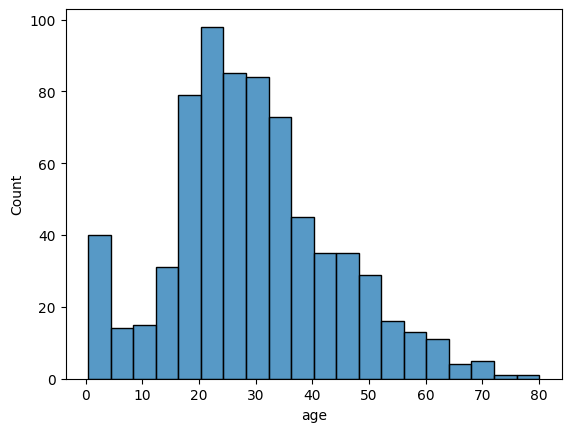

In [ ]:
# 181. Intro to Seaborn
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load a built-in seaborn dataset
data = sns.load_dataset('titanic')

# Create a pandas DataFrame from the dataset
df = pd.DataFrame(data)

# Display the first few rows of the dataframe
print(df.head())

# Create a seaborn histogram
sns.histplot(df['age'].dropna())

# Display the plot
plt.show()

In [ ]:
# 182. The Helpful load_dataset() method
tips = sns.load_dataset("tips")
tips

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


In [ ]:
penguins = sns.load_dataset("penguins")
penguins

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,Female
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,Male
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,Female


In [ ]:
# 183. Seaborn Scatterplots
tips

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


<Axes: xlabel='total_bill', ylabel='tip'>

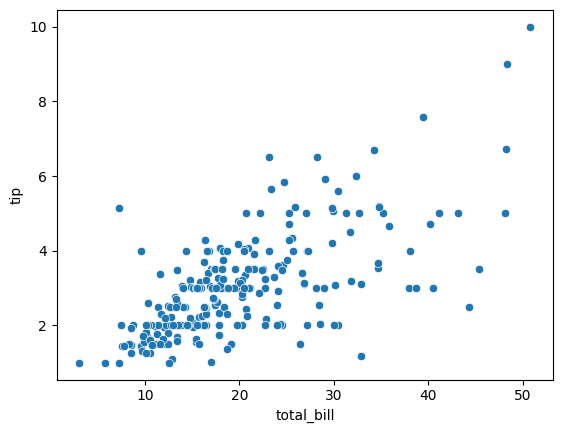

In [ ]:
sns.scatterplot(data=tips, x="total_bill", y="tip")

<Axes: xlabel='total_bill', ylabel='tip'>

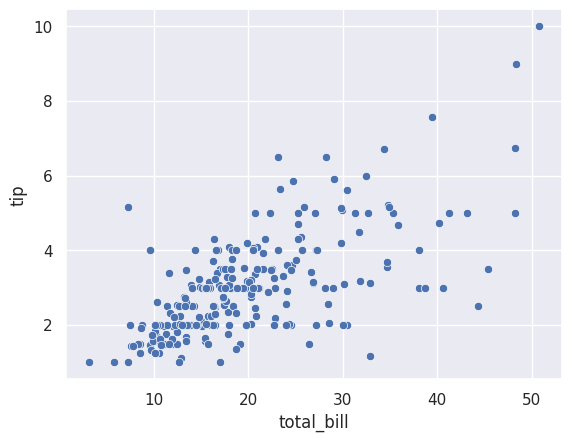

In [ ]:
sns.set_theme()
sns.scatterplot(data=tips, x="total_bill", y="tip")


<Axes: xlabel='total_bill', ylabel='tip'>

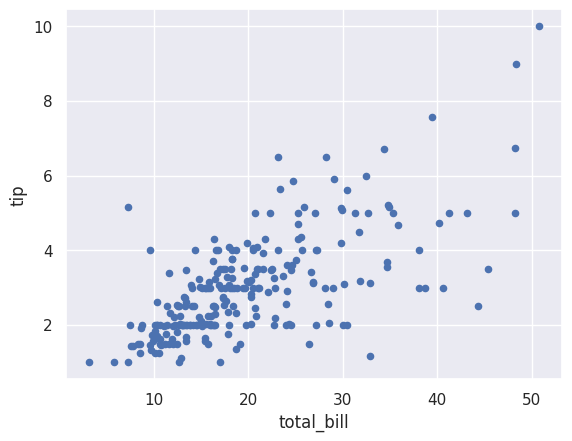

In [ ]:
tips.plot(kind="scatter", x="total_bill", y="tip")

<Axes: xlabel='total_bill', ylabel='tip'>

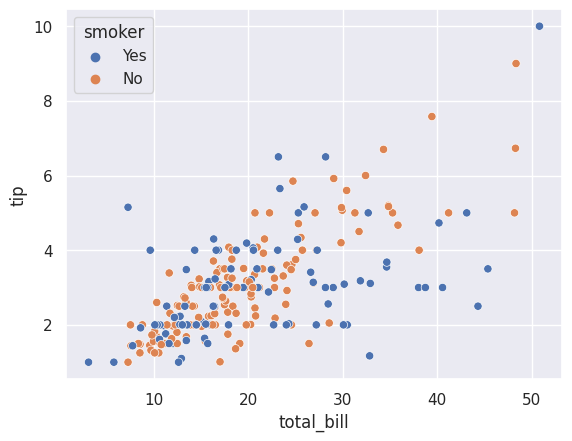

In [ ]:
data = sns.load_dataset("tips")
sns.scatterplot(data = tips, x="total_bill", y="tip", hue="smoker")

<Axes: xlabel='total_bill', ylabel='tip'>

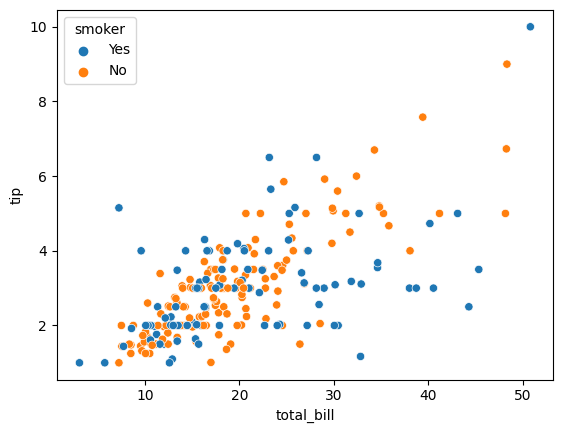

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
sns.scatterplot(data = tips, x="total_bill", y="tip", hue="smoker")

<Axes: xlabel='total_bill', ylabel='tip'>

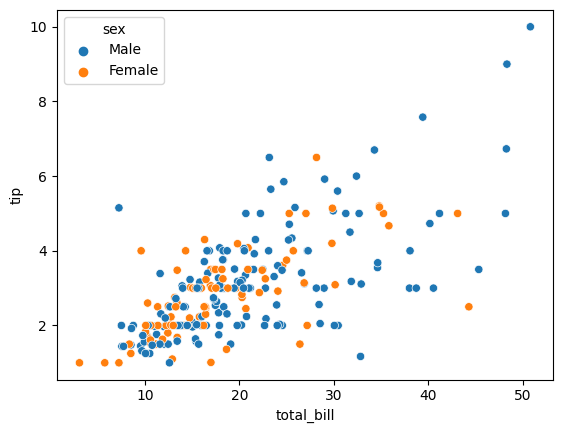

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
sns.scatterplot(data = tips, x="total_bill", y="tip", hue="sex")

<Axes: xlabel='total_bill', ylabel='tip'>

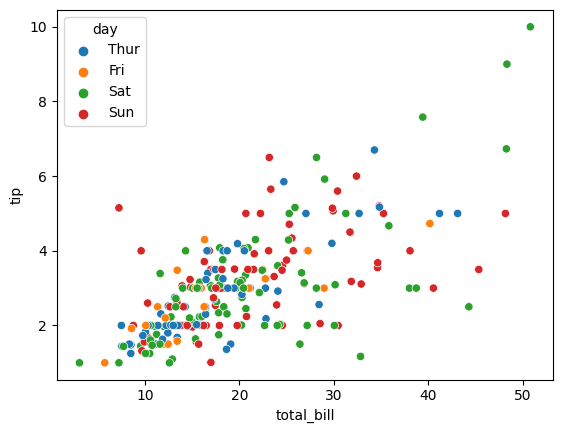

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
sns.scatterplot(data = tips, x="total_bill", y="tip", hue="day")

<Axes: xlabel='total_bill', ylabel='tip'>

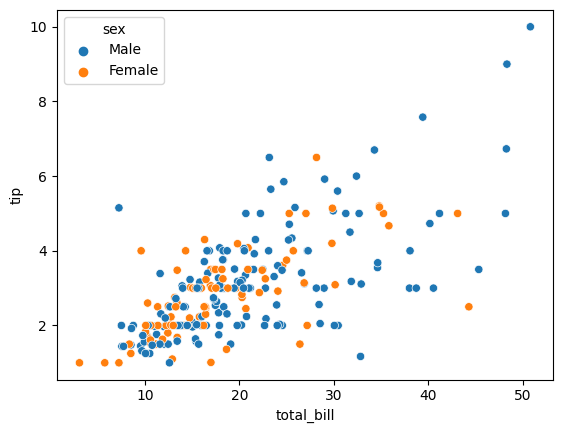

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
sns.scatterplot(data = tips, x="total_bill", y="tip", hue="sex")

<Axes: xlabel='total_bill', ylabel='tip'>

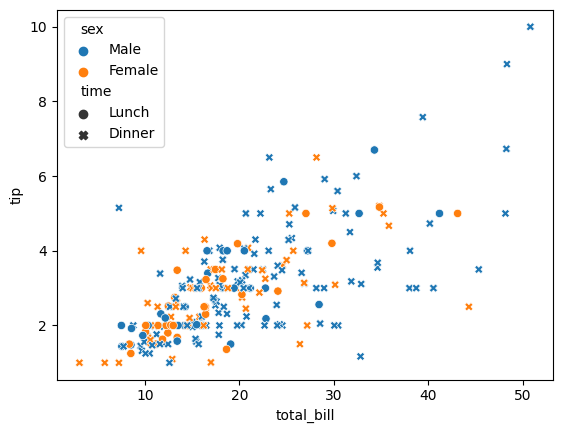

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
sns.scatterplot(data = tips, x="total_bill", y="tip", hue="sex", style="time")

<Axes: xlabel='total_bill', ylabel='tip'>

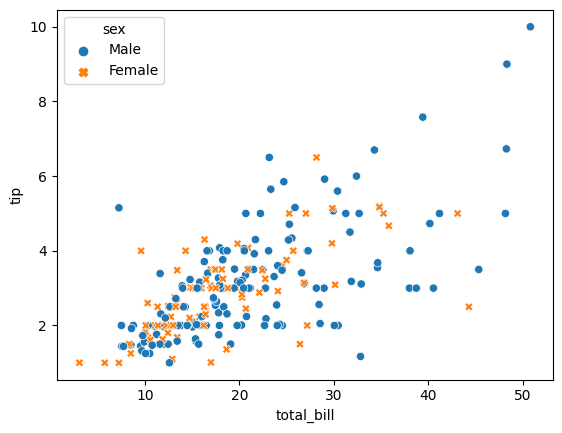

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
sns.scatterplot(data = tips, x="total_bill", y="tip", hue="sex", style="sex")

<Axes: xlabel='total_bill', ylabel='tip'>

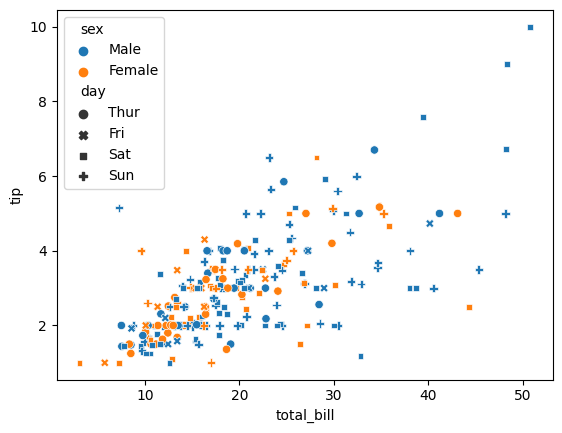

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
sns.scatterplot(data = tips, x="total_bill", y="tip", hue="sex", style="day")

<Axes: xlabel='total_bill', ylabel='tip'>

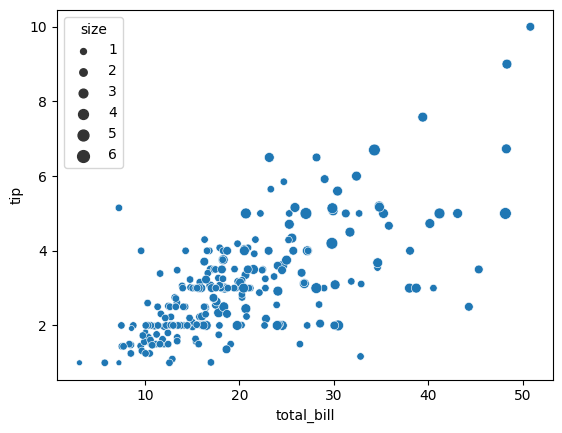

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
sns.scatterplot(data = tips, x="total_bill", y="tip", size="size")

<Axes: xlabel='total_bill', ylabel='tip'>

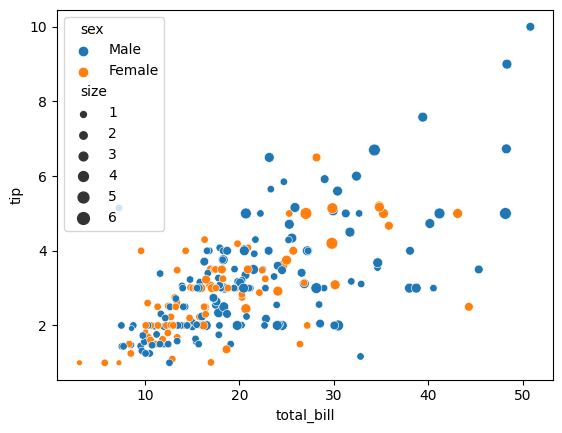

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
sns.scatterplot(data = tips, x="total_bill", y="tip", size="size", hue="sex")

In [ ]:
# 184. Seaborn Lineplots
flights = sns.load_dataset("flights")
flights

,year,month,passengers
0,1949,Jan,112
1,1949,Feb,118
2,1949,Mar,132
3,1949,Apr,129
4,1949,May,121
...,...,...,...
139,1960,Aug,606
140,1960,Sep,508
141,1960,Oct,461
142,1960,Nov,390


<Axes: xlabel='year', ylabel='passengers'>

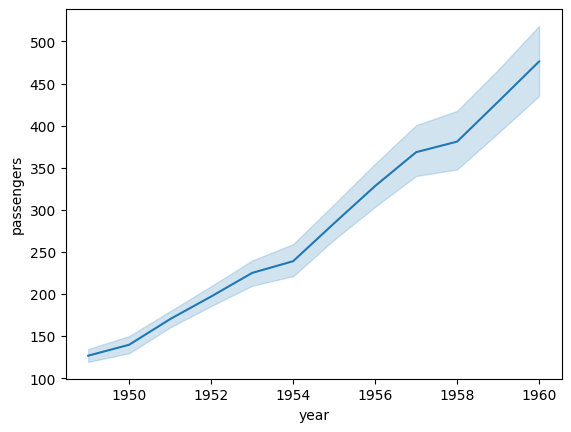

In [ ]:
sns.lineplot(flights, x="year", y="passengers")

In [ ]:
flights

,year,month,passengers
0,1949,Jan,112
1,1949,Feb,118
2,1949,Mar,132
3,1949,Apr,129
4,1949,May,121
...,...,...,...
139,1960,Aug,606
140,1960,Sep,508
141,1960,Oct,461
142,1960,Nov,390


In [ ]:
flights[flights['year'] == 1950]

,year,month,passengers
12,1950,Jan,115
13,1950,Feb,126
14,1950,Mar,141
15,1950,Apr,135
16,1950,May,125
17,1950,Jun,149
18,1950,Jul,170
19,1950,Aug,170
20,1950,Sep,158
21,1950,Oct,133


In [ ]:
flights[flights['year'] == 1950] ["passengers"].mean()

139.66666666666666

In [ ]:
flights[flights['year'] == 1951] ["passengers"].mean()

170.16666666666666

<Axes: xlabel='year', ylabel='passengers'>

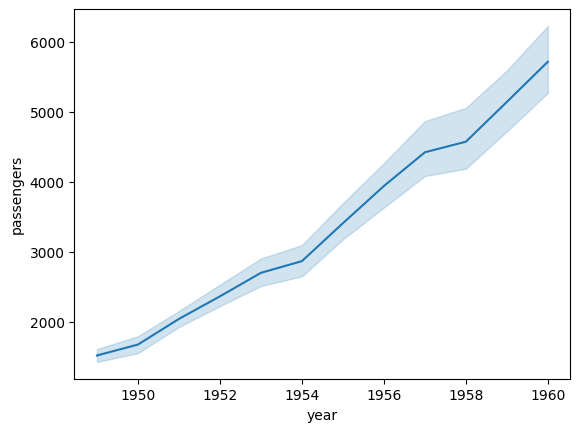

In [ ]:
sns.lineplot(flights, x="year", y="passengers", estimator="sum")

<Axes: xlabel='year', ylabel='passengers'>

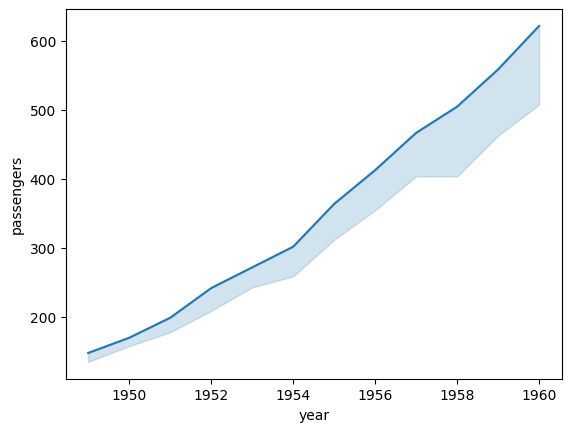

In [ ]:
sns.lineplot(flights, x="year", y="passengers", estimator="max")

In [ ]:
# Group by 'year' and convert it to a list
flights_grouped_by_year = list(flights.groupby("year"))

# Now, let's loop over the grouped data and display each group (year) as a separate DataFrame
for year, group in flights_grouped_by_year:
    display(group)

,year,month,passengers
0,1949,Jan,112
1,1949,Feb,118
2,1949,Mar,132
3,1949,Apr,129
4,1949,May,121
5,1949,Jun,135
6,1949,Jul,148
7,1949,Aug,148
8,1949,Sep,136
9,1949,Oct,119


,year,month,passengers
12,1950,Jan,115
13,1950,Feb,126
14,1950,Mar,141
15,1950,Apr,135
16,1950,May,125
17,1950,Jun,149
18,1950,Jul,170
19,1950,Aug,170
20,1950,Sep,158
21,1950,Oct,133


,year,month,passengers
24,1951,Jan,145
25,1951,Feb,150
26,1951,Mar,178
27,1951,Apr,163
28,1951,May,172
29,1951,Jun,178
30,1951,Jul,199
31,1951,Aug,199
32,1951,Sep,184
33,1951,Oct,162


,year,month,passengers
36,1952,Jan,171
37,1952,Feb,180
38,1952,Mar,193
39,1952,Apr,181
40,1952,May,183
41,1952,Jun,218
42,1952,Jul,230
43,1952,Aug,242
44,1952,Sep,209
45,1952,Oct,191


,year,month,passengers
48,1953,Jan,196
49,1953,Feb,196
50,1953,Mar,236
51,1953,Apr,235
52,1953,May,229
53,1953,Jun,243
54,1953,Jul,264
55,1953,Aug,272
56,1953,Sep,237
57,1953,Oct,211


,year,month,passengers
60,1954,Jan,204
61,1954,Feb,188
62,1954,Mar,235
63,1954,Apr,227
64,1954,May,234
65,1954,Jun,264
66,1954,Jul,302
67,1954,Aug,293
68,1954,Sep,259
69,1954,Oct,229


,year,month,passengers
72,1955,Jan,242
73,1955,Feb,233
74,1955,Mar,267
75,1955,Apr,269
76,1955,May,270
77,1955,Jun,315
78,1955,Jul,364
79,1955,Aug,347
80,1955,Sep,312
81,1955,Oct,274


,year,month,passengers
84,1956,Jan,284
85,1956,Feb,277
86,1956,Mar,317
87,1956,Apr,313
88,1956,May,318
89,1956,Jun,374
90,1956,Jul,413
91,1956,Aug,405
92,1956,Sep,355
93,1956,Oct,306


,year,month,passengers
96,1957,Jan,315
97,1957,Feb,301
98,1957,Mar,356
99,1957,Apr,348
100,1957,May,355
101,1957,Jun,422
102,1957,Jul,465
103,1957,Aug,467
104,1957,Sep,404
105,1957,Oct,347


,year,month,passengers
108,1958,Jan,340
109,1958,Feb,318
110,1958,Mar,362
111,1958,Apr,348
112,1958,May,363
113,1958,Jun,435
114,1958,Jul,491
115,1958,Aug,505
116,1958,Sep,404
117,1958,Oct,359


,year,month,passengers
120,1959,Jan,360
121,1959,Feb,342
122,1959,Mar,406
123,1959,Apr,396
124,1959,May,420
125,1959,Jun,472
126,1959,Jul,548
127,1959,Aug,559
128,1959,Sep,463
129,1959,Oct,407


,year,month,passengers
132,1960,Jan,417
133,1960,Feb,391
134,1960,Mar,419
135,1960,Apr,461
136,1960,May,472
137,1960,Jun,535
138,1960,Jul,622
139,1960,Aug,606
140,1960,Sep,508
141,1960,Oct,461


In [ ]:
# Group by 'year' and convert it to a list
flights.groupby("year")["passengers"].mean()

year
1949    126.666667
1950    139.666667
1951    170.166667
1952    197.000000
1953    225.000000
1954    238.916667
1955    284.000000
1956    328.250000
1957    368.416667
1958    381.000000
1959    428.333333
1960    476.166667
Name: passengers, dtype: float64

<Axes: xlabel='year'>

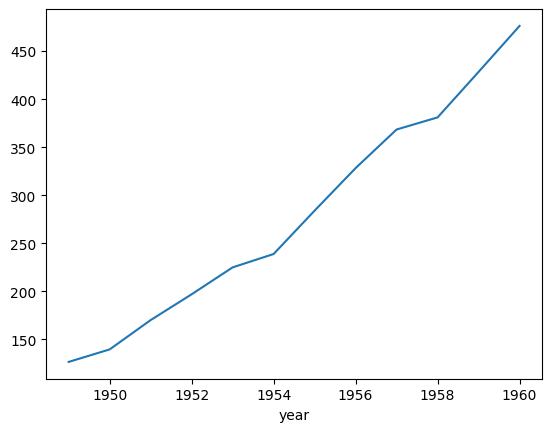

In [ ]:
flights.groupby("year")["passengers"].mean().plot()

<Axes: xlabel='year', ylabel='passengers'>

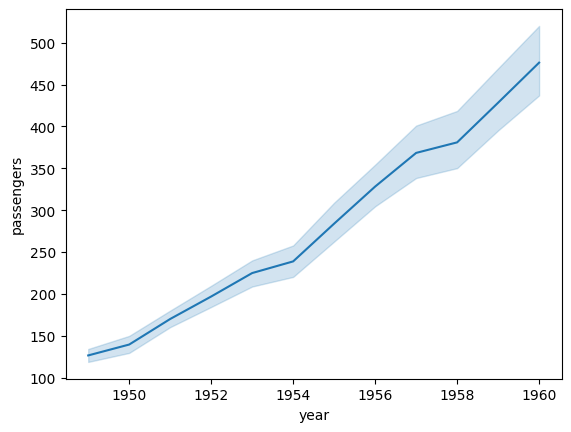

In [ ]:
sns.lineplot(data=flights, x="year", y="passengers")

In [ ]:
import seaborn as sns
flights = sns.load_dataset("flights")
flights

,year,month,passengers
0,1949,Jan,112
1,1949,Feb,118
2,1949,Mar,132
3,1949,Apr,129
4,1949,May,121
...,...,...,...
139,1960,Aug,606
140,1960,Sep,508
141,1960,Oct,461
142,1960,Nov,390


<Axes: xlabel='year', ylabel='passengers'>

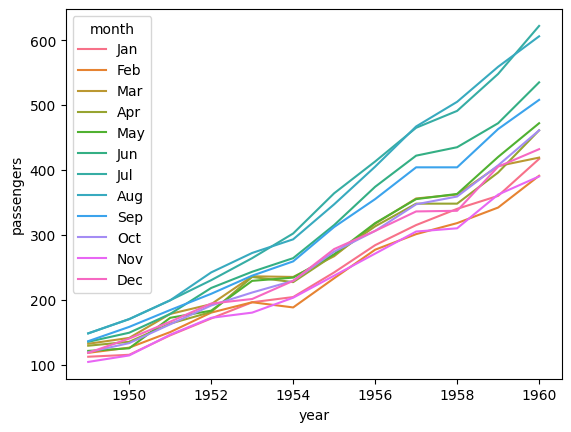

In [ ]:
sns.lineplot(data=flights, x="year", y="passengers", hue="month")

In [ ]:
trips = sns.load_dataset("taxis", parse_dates=["pickup", "dropoff"])
trips

,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,pickup_zone,dropoff_zone,pickup_borough,dropoff_borough
0,2019-03-23 20:21:09,2019-03-23 20:27:24,1,1.60,7.0,2.15,0.0,12.95,yellow,credit card,Lenox Hill West,UN/Turtle Bay South,Manhattan,Manhattan
1,2019-03-04 16:11:55,2019-03-04 16:19:00,1,0.79,5.0,0.00,0.0,9.30,yellow,cash,Upper West Side South,Upper West Side South,Manhattan,Manhattan
2,2019-03-27 17:53:01,2019-03-27 18:00:25,1,1.37,7.5,2.36,0.0,14.16,yellow,credit card,Alphabet City,West Village,Manhattan,Manhattan
3,2019-03-10 01:23:59,2019-03-10 01:49:51,1,7.70,27.0,6.15,0.0,36.95,yellow,credit card,Hudson Sq,Yorkville West,Manhattan,Manhattan
4,2019-03-30 13:27:42,2019-03-30 13:37:14,3,2.16,9.0,1.10,0.0,13.40,yellow,credit card,Midtown East,Yorkville West,Manhattan,Manhattan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6428,2019-03-31 09:51:53,2019-03-31 09:55:27,1,0.75,4.5,1.06,0.0,6.36,green,credit card,East Harlem North,Central Harlem North,Manhattan,Manhattan
6429,2019-03-31 17:38:00,2019-03-31 18:34:23,1,18.74,58.0,0.00,0.0,58.80,green,credit card,Jamaica,East Concourse/Concourse Village,Queens,Bronx
6430,2019-03-23 22:55:18,2019-03-23 23:14:25,1,4.14,16.0,0.00,0.0,17.30,green,cash,Crown Heights North,Bushwick North,Brooklyn,Brooklyn
6431,2019-03-04 10:09:25,2019-03-04 10:14:29,1,1.12,6.0,0.00,0.0,6.80,green,credit card,East New York,East Flatbush/Remsen Village,Brooklyn,Brooklyn


In [ ]:
trips["hour"] = trips['pickup'].dt.hour

In [ ]:
trips

,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,pickup_zone,dropoff_zone,pickup_borough,dropoff_borough,hour
0,2019-03-23 20:21:09,2019-03-23 20:27:24,1,1.60,7.0,2.15,0.0,12.95,yellow,credit card,Lenox Hill West,UN/Turtle Bay South,Manhattan,Manhattan,20
1,2019-03-04 16:11:55,2019-03-04 16:19:00,1,0.79,5.0,0.00,0.0,9.30,yellow,cash,Upper West Side South,Upper West Side South,Manhattan,Manhattan,16
2,2019-03-27 17:53:01,2019-03-27 18:00:25,1,1.37,7.5,2.36,0.0,14.16,yellow,credit card,Alphabet City,West Village,Manhattan,Manhattan,17
3,2019-03-10 01:23:59,2019-03-10 01:49:51,1,7.70,27.0,6.15,0.0,36.95,yellow,credit card,Hudson Sq,Yorkville West,Manhattan,Manhattan,1
4,2019-03-30 13:27:42,2019-03-30 13:37:14,3,2.16,9.0,1.10,0.0,13.40,yellow,credit card,Midtown East,Yorkville West,Manhattan,Manhattan,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6428,2019-03-31 09:51:53,2019-03-31 09:55:27,1,0.75,4.5,1.06,0.0,6.36,green,credit card,East Harlem North,Central Harlem North,Manhattan,Manhattan,9
6429,2019-03-31 17:38:00,2019-03-31 18:34:23,1,18.74,58.0,0.00,0.0,58.80,green,credit card,Jamaica,East Concourse/Concourse Village,Queens,Bronx,17
6430,2019-03-23 22:55:18,2019-03-23 23:14:25,1,4.14,16.0,0.00,0.0,17.30,green,cash,Crown Heights North,Bushwick North,Brooklyn,Brooklyn,22
6431,2019-03-04 10:09:25,2019-03-04 10:14:29,1,1.12,6.0,0.00,0.0,6.80,green,credit card,East New York,East Flatbush/Remsen Village,Brooklyn,Brooklyn,10


NameError: ignored

<Axes: xlabel='hour', ylabel='total'>

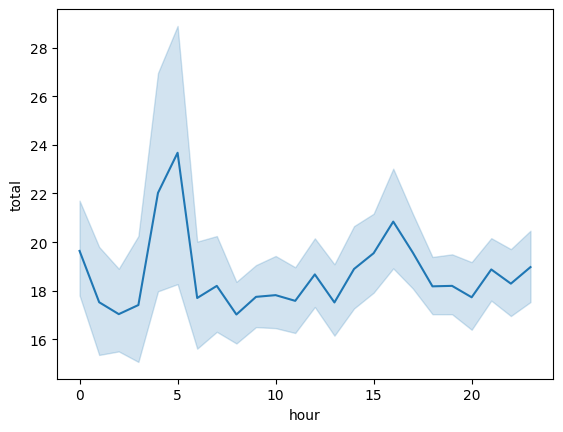

In [ ]:
sns.lineplot(data=trips, x="hour", y="total")

<Axes: xlabel='hour', ylabel='total'>

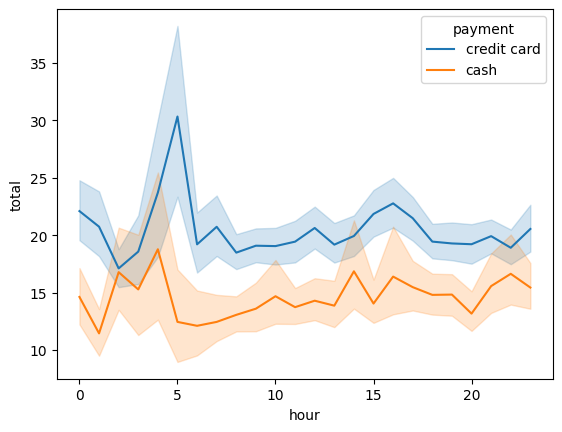

In [ ]:
sns.lineplot(data=trips, x="hour", y="total", hue="payment")

In [ ]:
import seaborn as sns
trips = sns.load_dataset("taxis", parse_dates=["pickup", "dropoff"])
trips

,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,pickup_zone,dropoff_zone,pickup_borough,dropoff_borough
0,2019-03-23 20:21:09,2019-03-23 20:27:24,1,1.60,7.0,2.15,0.0,12.95,yellow,credit card,Lenox Hill West,UN/Turtle Bay South,Manhattan,Manhattan
1,2019-03-04 16:11:55,2019-03-04 16:19:00,1,0.79,5.0,0.00,0.0,9.30,yellow,cash,Upper West Side South,Upper West Side South,Manhattan,Manhattan
2,2019-03-27 17:53:01,2019-03-27 18:00:25,1,1.37,7.5,2.36,0.0,14.16,yellow,credit card,Alphabet City,West Village,Manhattan,Manhattan
3,2019-03-10 01:23:59,2019-03-10 01:49:51,1,7.70,27.0,6.15,0.0,36.95,yellow,credit card,Hudson Sq,Yorkville West,Manhattan,Manhattan
4,2019-03-30 13:27:42,2019-03-30 13:37:14,3,2.16,9.0,1.10,0.0,13.40,yellow,credit card,Midtown East,Yorkville West,Manhattan,Manhattan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6428,2019-03-31 09:51:53,2019-03-31 09:55:27,1,0.75,4.5,1.06,0.0,6.36,green,credit card,East Harlem North,Central Harlem North,Manhattan,Manhattan
6429,2019-03-31 17:38:00,2019-03-31 18:34:23,1,18.74,58.0,0.00,0.0,58.80,green,credit card,Jamaica,East Concourse/Concourse Village,Queens,Bronx
6430,2019-03-23 22:55:18,2019-03-23 23:14:25,1,4.14,16.0,0.00,0.0,17.30,green,cash,Crown Heights North,Bushwick North,Brooklyn,Brooklyn
6431,2019-03-04 10:09:25,2019-03-04 10:14:29,1,1.12,6.0,0.00,0.0,6.80,green,credit card,East New York,East Flatbush/Remsen Village,Brooklyn,Brooklyn


In [ ]:
import seaborn as sns
trips = sns.load_dataset("taxis", parse_dates=["pickup", "dropoff"])
trips
trips["hour"] = trips["pickup"].dt.hour

In [ ]:
trips

,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,pickup_zone,dropoff_zone,pickup_borough,dropoff_borough,hour
0,2019-03-23 20:21:09,2019-03-23 20:27:24,1,1.60,7.0,2.15,0.0,12.95,yellow,credit card,Lenox Hill West,UN/Turtle Bay South,Manhattan,Manhattan,20
1,2019-03-04 16:11:55,2019-03-04 16:19:00,1,0.79,5.0,0.00,0.0,9.30,yellow,cash,Upper West Side South,Upper West Side South,Manhattan,Manhattan,16
2,2019-03-27 17:53:01,2019-03-27 18:00:25,1,1.37,7.5,2.36,0.0,14.16,yellow,credit card,Alphabet City,West Village,Manhattan,Manhattan,17
3,2019-03-10 01:23:59,2019-03-10 01:49:51,1,7.70,27.0,6.15,0.0,36.95,yellow,credit card,Hudson Sq,Yorkville West,Manhattan,Manhattan,1
4,2019-03-30 13:27:42,2019-03-30 13:37:14,3,2.16,9.0,1.10,0.0,13.40,yellow,credit card,Midtown East,Yorkville West,Manhattan,Manhattan,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6428,2019-03-31 09:51:53,2019-03-31 09:55:27,1,0.75,4.5,1.06,0.0,6.36,green,credit card,East Harlem North,Central Harlem North,Manhattan,Manhattan,9
6429,2019-03-31 17:38:00,2019-03-31 18:34:23,1,18.74,58.0,0.00,0.0,58.80,green,credit card,Jamaica,East Concourse/Concourse Village,Queens,Bronx,17
6430,2019-03-23 22:55:18,2019-03-23 23:14:25,1,4.14,16.0,0.00,0.0,17.30,green,cash,Crown Heights North,Bushwick North,Brooklyn,Brooklyn,22
6431,2019-03-04 10:09:25,2019-03-04 10:14:29,1,1.12,6.0,0.00,0.0,6.80,green,credit card,East New York,East Flatbush/Remsen Village,Brooklyn,Brooklyn,10


<Axes: xlabel='hour', ylabel='total'>

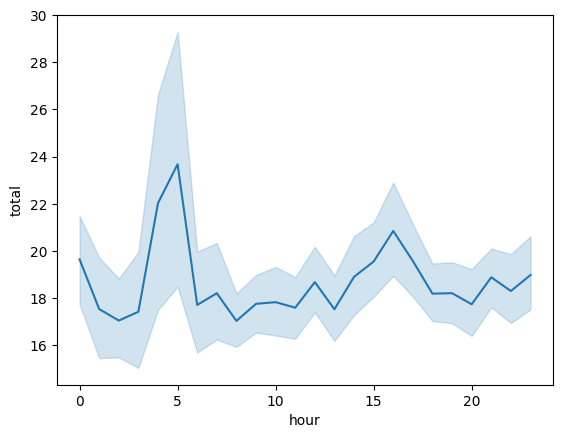

In [ ]:
sns.lineplot(data=trips, x="hour", y="total")

<Axes: xlabel='hour', ylabel='total'>

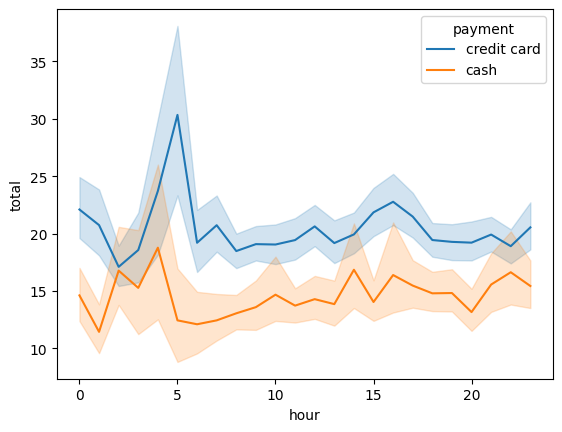

In [ ]:
sns.lineplot(data=trips, x="hour", y="total", hue="payment")

In [ ]:
trips

,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,pickup_zone,dropoff_zone,pickup_borough,dropoff_borough,hour
0,2019-03-23 20:21:09,2019-03-23 20:27:24,1,1.60,7.0,2.15,0.0,12.95,yellow,credit card,Lenox Hill West,UN/Turtle Bay South,Manhattan,Manhattan,20
1,2019-03-04 16:11:55,2019-03-04 16:19:00,1,0.79,5.0,0.00,0.0,9.30,yellow,cash,Upper West Side South,Upper West Side South,Manhattan,Manhattan,16
2,2019-03-27 17:53:01,2019-03-27 18:00:25,1,1.37,7.5,2.36,0.0,14.16,yellow,credit card,Alphabet City,West Village,Manhattan,Manhattan,17
3,2019-03-10 01:23:59,2019-03-10 01:49:51,1,7.70,27.0,6.15,0.0,36.95,yellow,credit card,Hudson Sq,Yorkville West,Manhattan,Manhattan,1
4,2019-03-30 13:27:42,2019-03-30 13:37:14,3,2.16,9.0,1.10,0.0,13.40,yellow,credit card,Midtown East,Yorkville West,Manhattan,Manhattan,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6428,2019-03-31 09:51:53,2019-03-31 09:55:27,1,0.75,4.5,1.06,0.0,6.36,green,credit card,East Harlem North,Central Harlem North,Manhattan,Manhattan,9
6429,2019-03-31 17:38:00,2019-03-31 18:34:23,1,18.74,58.0,0.00,0.0,58.80,green,credit card,Jamaica,East Concourse/Concourse Village,Queens,Bronx,17
6430,2019-03-23 22:55:18,2019-03-23 23:14:25,1,4.14,16.0,0.00,0.0,17.30,green,cash,Crown Heights North,Bushwick North,Brooklyn,Brooklyn,22
6431,2019-03-04 10:09:25,2019-03-04 10:14:29,1,1.12,6.0,0.00,0.0,6.80,green,credit card,East New York,East Flatbush/Remsen Village,Brooklyn,Brooklyn,10


<Axes: xlabel='hour', ylabel='total'>

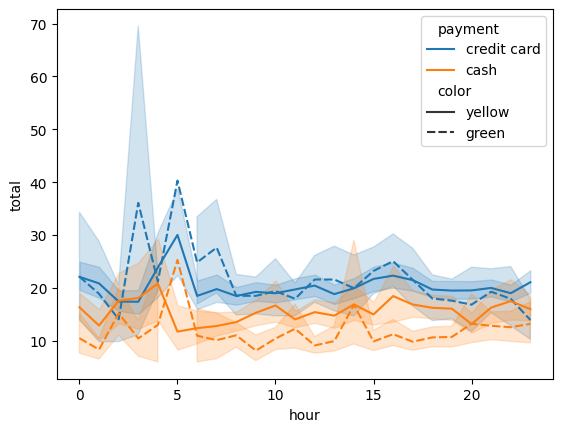

In [ ]:
sns.lineplot(data=trips, x="hour", y="total", hue="payment", style="color")

<ipython-input-9-ea9c558d8779>:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 12)` for the same effect.

  sns.lineplot(data=trips, x="hour", y="total", hue="payment", style="color", ci=12)


<Axes: xlabel='hour', ylabel='total'>

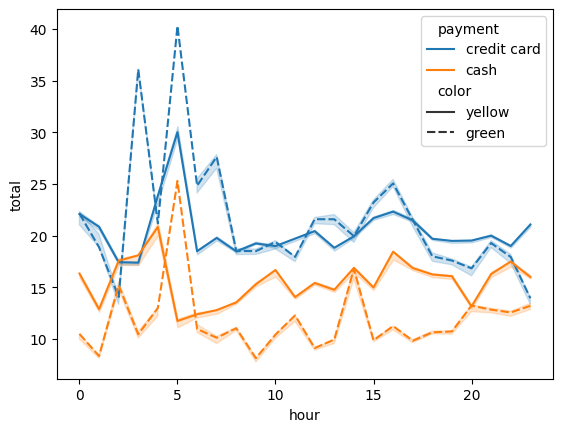

In [ ]:
sns.lineplot(data=trips, x="hour", y="total", hue="payment", style="color", ci=12)

<ipython-input-11-757e24d7c912>:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=trips, x="hour", y="total", hue="payment", style="color", ci=None, size="passengers")


<Axes: xlabel='hour', ylabel='total'>

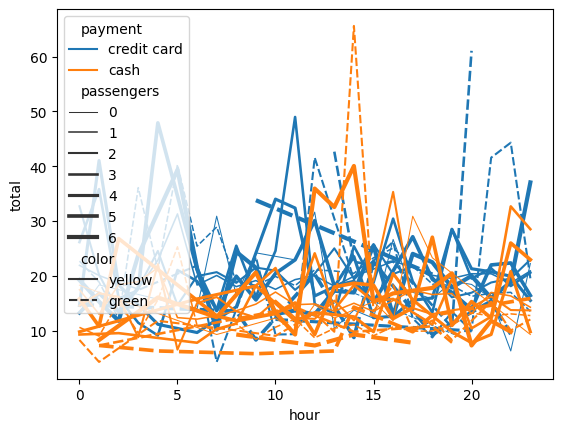

In [ ]:
sns.lineplot(data=trips, x="hour", y="total", hue="payment", style="color", ci=None, size="passengers")

<ipython-input-12-543a5dcaba98>:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=trips, x="hour", y="total", ci=None, size="passengers")


<Axes: xlabel='hour', ylabel='total'>

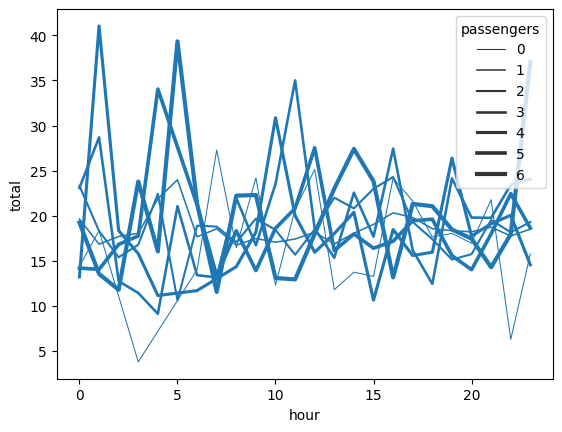

In [ ]:
sns.lineplot(data=trips, x="hour", y="total", ci=None, size="passengers")

<Axes: xlabel='hour', ylabel='total'>

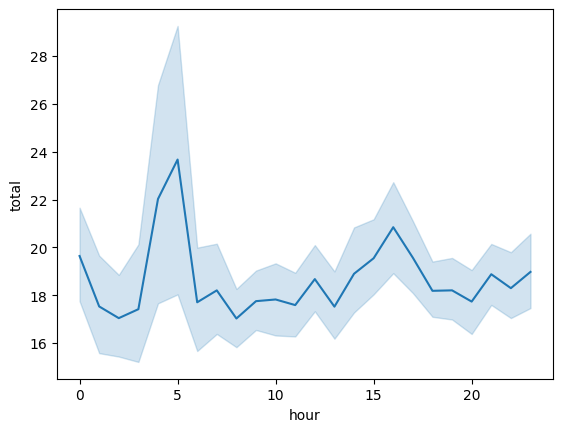

In [ ]:
# 185. The relplot() Method
import seaborn as sns
sns.lineplot(data=trips, x="hour", y="total")

In [ ]:
tips = sns.load_dataset("tips")
tips

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


<Axes: xlabel='total_bill', ylabel='tip'>

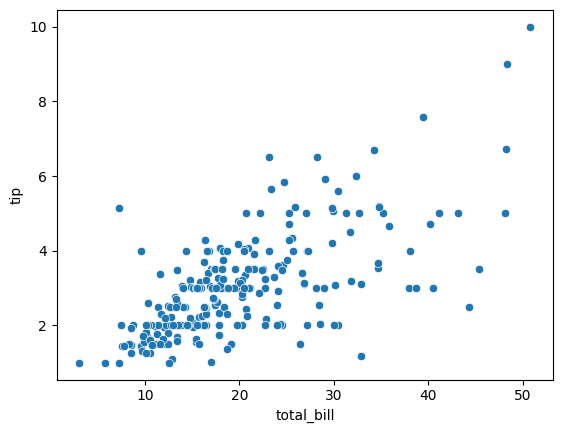

In [ ]:
sns.scatterplot(data=tips, x="total_bill", y="tip")

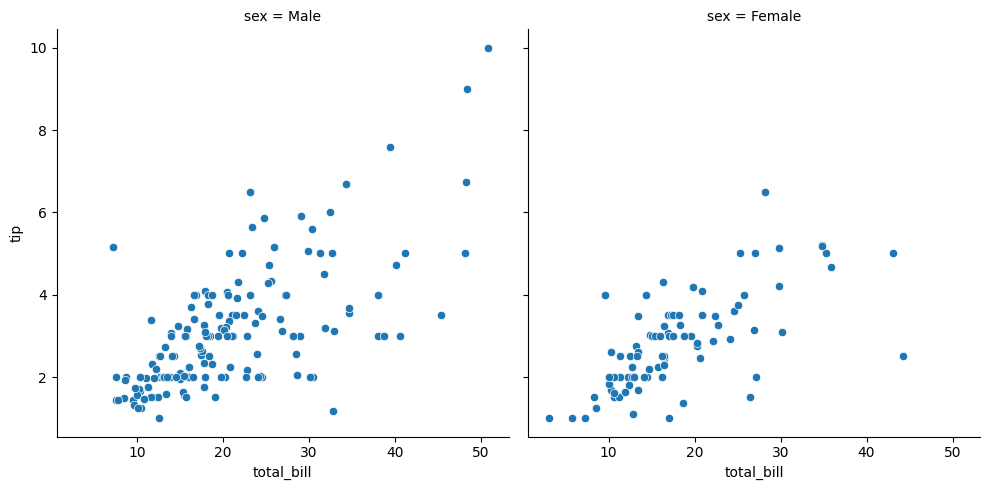

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
tips
sns.relplot(data=tips, x="total_bill", y="tip", kind="scatter", col="sex")

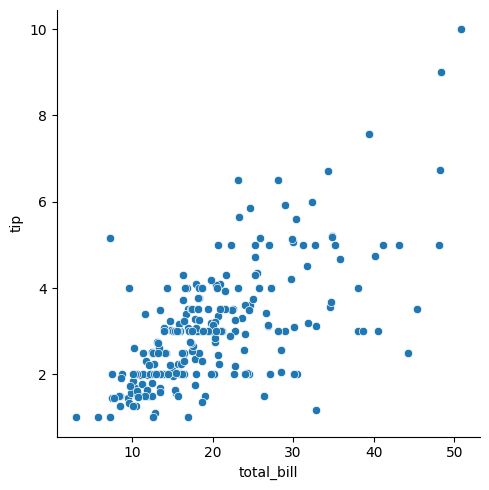

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
tips
sns.relplot(data=tips, x="total_bill", y="tip")

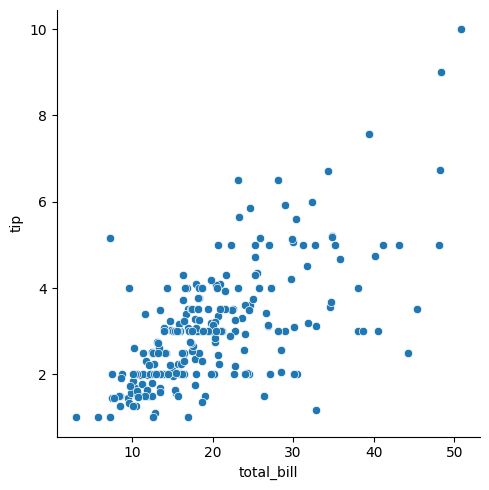

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
tips
sns.relplot(data=tips, x="total_bill", y="tip", kind="scatter")

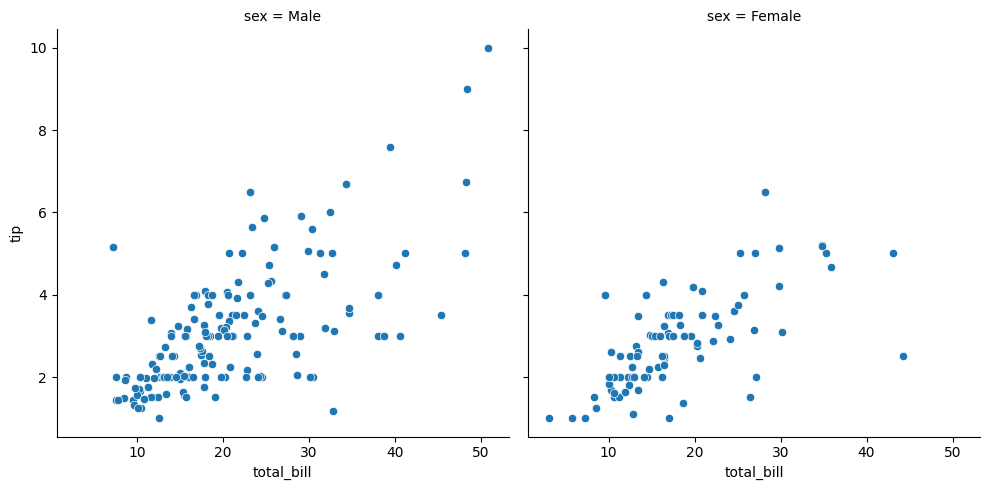

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
tips
sns.relplot(data=tips, x="total_bill", y="tip", col="sex")

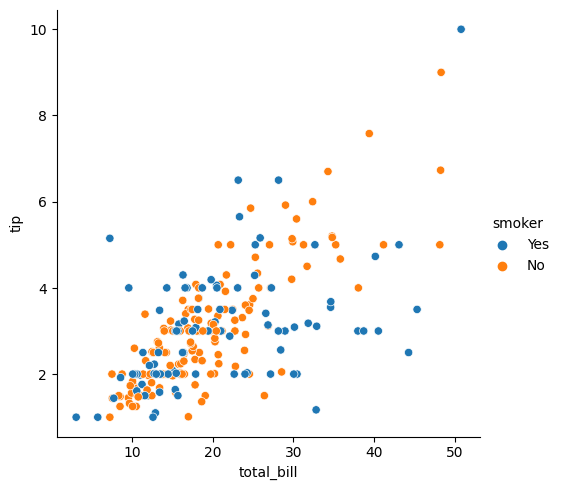

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
tips
sns.relplot(data=tips, x="total_bill", y="tip", hue="smoker")

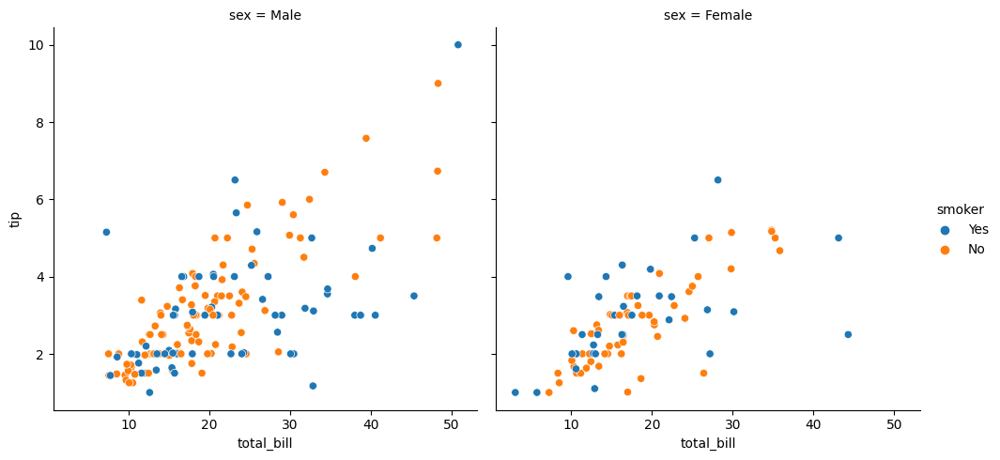

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
tips
sns.relplot(data=tips, x="total_bill", y="tip", hue="smoker", col="sex")

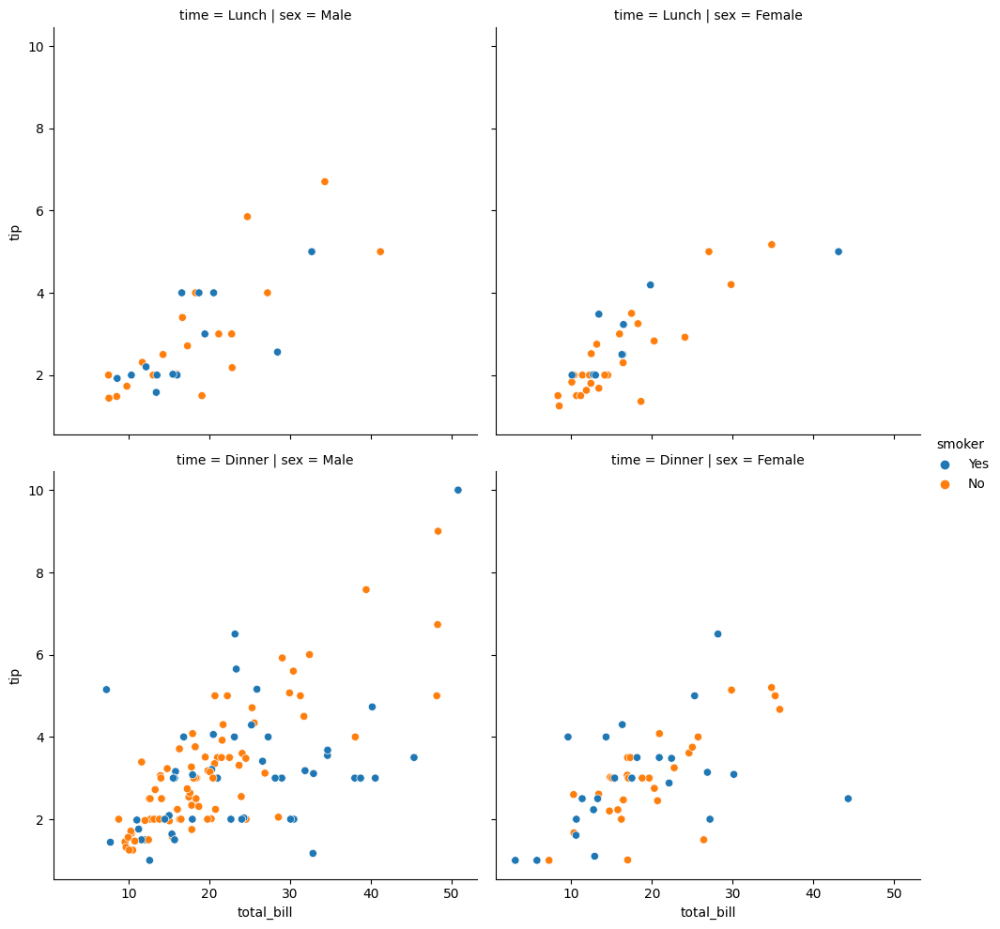

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
tips
sns.relplot(data=tips, x="total_bill", y="tip", hue="smoker", col="sex", row="time")

In [ ]:
import seaborn as sns
trips = sns.load_dataset("taxis", parse_dates=["pickup", "dropoff"])
trips
trips["hour"] = trips["pickup"].dt.hour
trips

,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,pickup_zone,dropoff_zone,pickup_borough,dropoff_borough,hour
0,2019-03-23 20:21:09,2019-03-23 20:27:24,1,1.60,7.0,2.15,0.0,12.95,yellow,credit card,Lenox Hill West,UN/Turtle Bay South,Manhattan,Manhattan,20
1,2019-03-04 16:11:55,2019-03-04 16:19:00,1,0.79,5.0,0.00,0.0,9.30,yellow,cash,Upper West Side South,Upper West Side South,Manhattan,Manhattan,16
2,2019-03-27 17:53:01,2019-03-27 18:00:25,1,1.37,7.5,2.36,0.0,14.16,yellow,credit card,Alphabet City,West Village,Manhattan,Manhattan,17
3,2019-03-10 01:23:59,2019-03-10 01:49:51,1,7.70,27.0,6.15,0.0,36.95,yellow,credit card,Hudson Sq,Yorkville West,Manhattan,Manhattan,1
4,2019-03-30 13:27:42,2019-03-30 13:37:14,3,2.16,9.0,1.10,0.0,13.40,yellow,credit card,Midtown East,Yorkville West,Manhattan,Manhattan,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6428,2019-03-31 09:51:53,2019-03-31 09:55:27,1,0.75,4.5,1.06,0.0,6.36,green,credit card,East Harlem North,Central Harlem North,Manhattan,Manhattan,9
6429,2019-03-31 17:38:00,2019-03-31 18:34:23,1,18.74,58.0,0.00,0.0,58.80,green,credit card,Jamaica,East Concourse/Concourse Village,Queens,Bronx,17
6430,2019-03-23 22:55:18,2019-03-23 23:14:25,1,4.14,16.0,0.00,0.0,17.30,green,cash,Crown Heights North,Bushwick North,Brooklyn,Brooklyn,22
6431,2019-03-04 10:09:25,2019-03-04 10:14:29,1,1.12,6.0,0.00,0.0,6.80,green,credit card,East New York,East Flatbush/Remsen Village,Brooklyn,Brooklyn,10


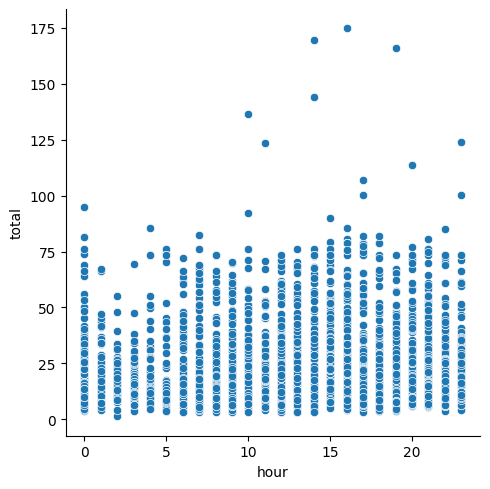

In [ ]:
sns.relplot(data=trips, x="hour", y="total")

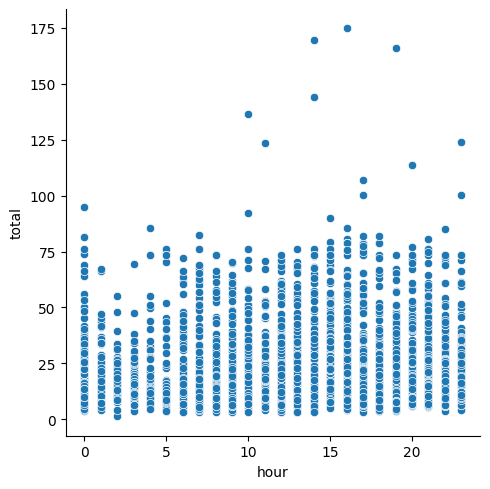

In [ ]:
sns.relplot(data=trips, x="hour", y="total", kind="scatter")

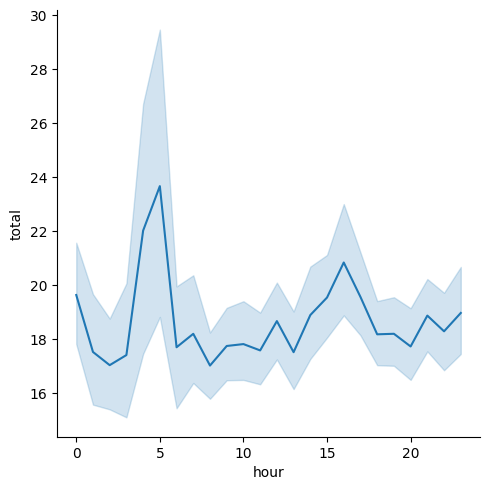

In [ ]:
sns.relplot(data=trips, x="hour", y="total", kind="line")

([<matplotlib.axis.YTick at 0x785ac67e0220>,
 [Text(0, 0, '0'),
  Text(0, 5, '5'),
  Text(0, 10, '10'),
  Text(0, 15, '15'),
  Text(0, 20, '20'),
  Text(0, 25, '25'),
  Text(0, 30, '30'),
  Text(0, 35, '35'),
  Text(0, 40, '40'),
  Text(0, 45, '45'),
  Text(0, 50, '50'),
  Text(0, 55, '55'),
  Text(0, 60, '60'),
  Text(0, 65, '65'),
  Text(0, 70, '70'),
  Text(0, 75, '75'),
  Text(0, 80, '80'),
  Text(0, 85, '85'),
  Text(0, 90, '90'),
  Text(0, 95, '95'),
  Text(0, 100, '100'),
  Text(0, 105, '105'),
  Text(0, 110, '110'),
  Text(0, 115, '115'),
  Text(0, 120, '120')])

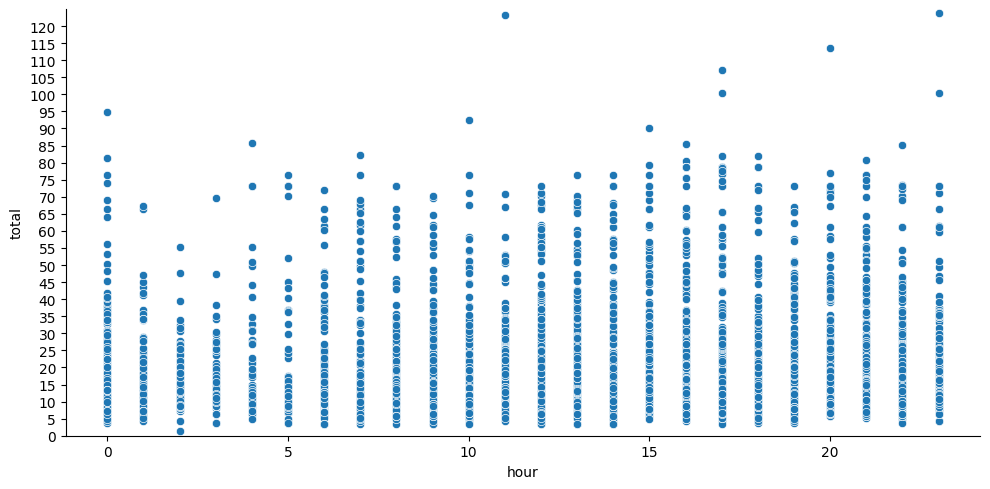

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
sns.relplot(data=trips, x="hour", y="total", kind="scatter", height=20, aspect=2)
# Set the y-axis limits to expand the scale (change 0 and 125 to other values if necessary)
plt.ylim(0, 125)

# Set the y-axis ticks to have more granularity (change the third parameter to control the number of ticks)
plt.yticks(np.arange(0, 125, 4))

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# ... Load your dataset ...

# Create the scatter plot
sns.relplot(data=trips, x="hour", y="total", kind="scatter", height=6, aspect=2)

# Set the y-axis limits to a wider range to "stretch" the y-axis
# (Here, I've set it from -50 to 200, but you should choose values that suit your data)
plt.ylim(trips['total'].min() - 10, trips['total'].max() + 10)

# Display the plot
plt.show()


(1.3, 174.82)

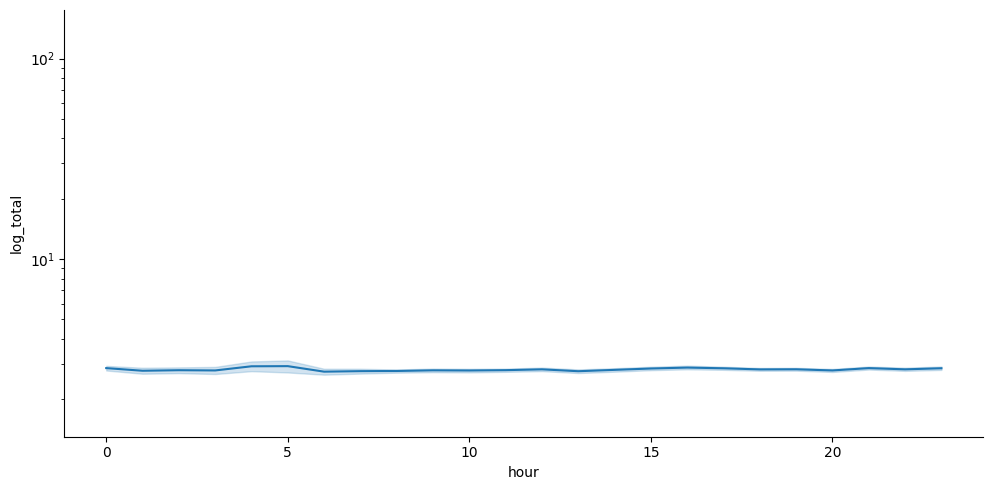

In [ ]:
# Create a new column with the log-transformed values of the 'total' column
trips['log_total'] = np.log1p(trips['total'])

# Create the relplot using the log-transformed 'total' values
sns.relplot(data=trips, x="hour", y="log_total", kind="line", height=5, aspect=2)

# Set y-axis labels to represent the original 'total' values
plt.yscale("log")
plt.ylim(trips['total'].min(), trips['total'].max())

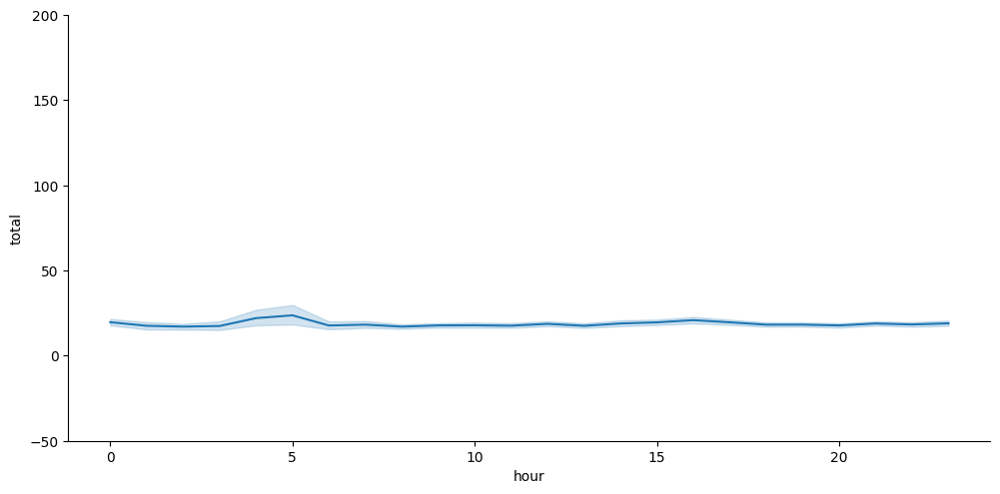

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# ... Load your dataset ...

# Create the relplot
sns.relplot(data=trips, x="hour", y="total", kind="line", height=5, aspect=2)

# Set the y-axis limits to a wider range to "stretch" the y-axis
# (Here, I've set it from -50 to 200, but you should choose values that suit your data)
plt.ylim(-50, 200)

# Display the plot
plt.show()


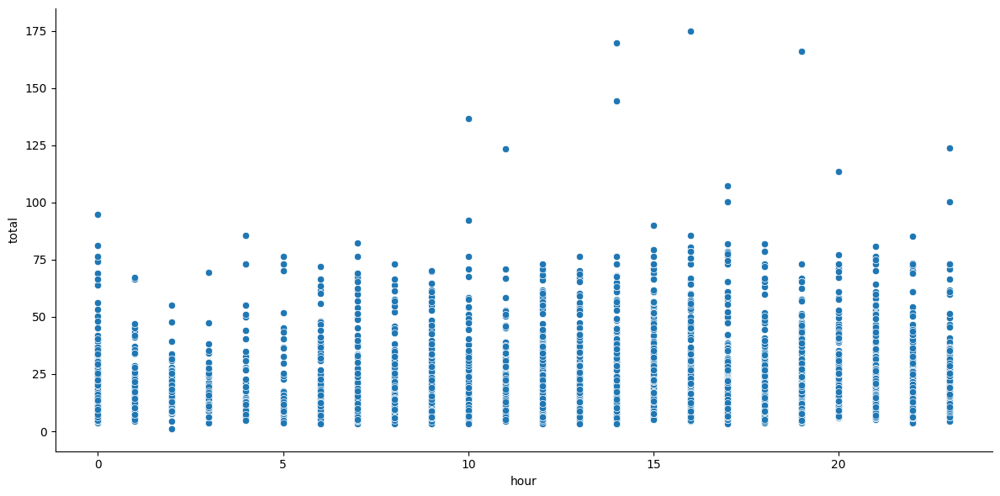

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# ... Load your dataset ...

# Create the scatter plot
sns.relplot(data=trips, x="hour", y="total", kind="scatter", height=6, aspect=2)

# Set the y-axis limits to a wider range to "stretch" the y-axis
# (Here, I've set it from -50 to 200, but you should choose values that suit your data)
plt.ylim(trips['total'].min() - 10, trips['total'].max() + 10)

# Display the plot
plt.show()


In [ ]:
sns.relplot(data=trips, x="hour", y="total", kind="scatter", height=6, aspect=2)

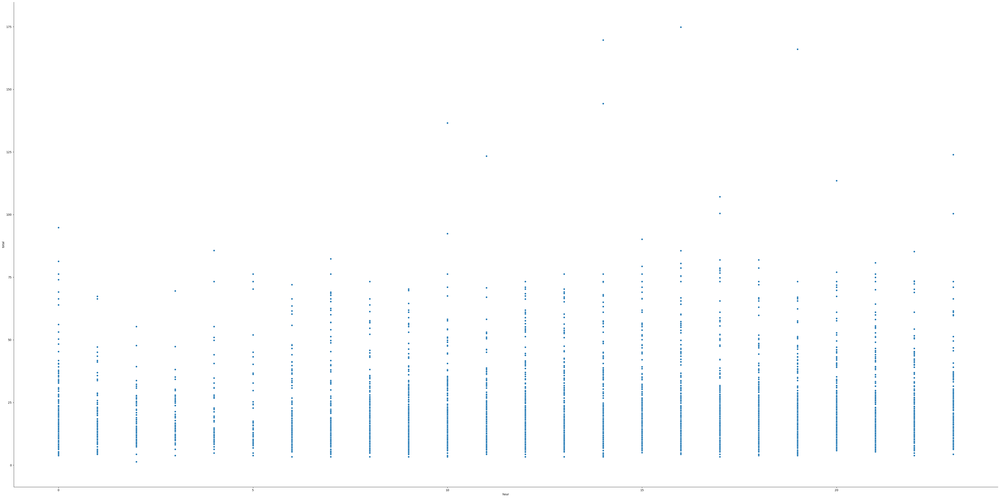

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# ... Load your dataset ...

# Create the scatter plot
sns.relplot(data=trips, x="hour", y="total", kind="scatter", height=24, aspect=2)

# Set the y-axis limits to a wider range to "stretch" the y-axis
# (Here, I've set it from -50 to 200, but you should choose values that suit your data)
plt.ylim(trips['total'].min() - 10, trips['total'].max() + 10)

# Display the plot
plt.show()


<ipython-input-18-bcaec10cb666>:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=trips, x="hour", y="total", color="red", ci=None)


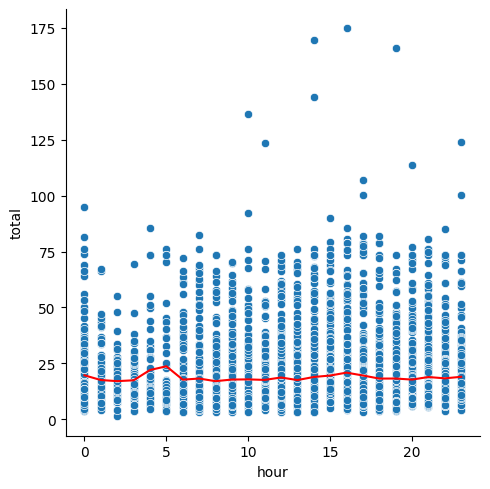

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Your data loading here
# ...

sns.relplot(data=trips, x="hour", y="total", kind="scatter")
sns.lineplot(data=trips, x="hour", y="total", color="red", ci=None)

plt.show()


In [ ]:
import seaborn as sns
trips = sns.load_dataset('taxis')
trips

,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,pickup_zone,dropoff_zone,pickup_borough,dropoff_borough
0,2019-03-23 20:21:09,2019-03-23 20:27:24,1,1.60,7.0,2.15,0.0,12.95,yellow,credit card,Lenox Hill West,UN/Turtle Bay South,Manhattan,Manhattan
1,2019-03-04 16:11:55,2019-03-04 16:19:00,1,0.79,5.0,0.00,0.0,9.30,yellow,cash,Upper West Side South,Upper West Side South,Manhattan,Manhattan
2,2019-03-27 17:53:01,2019-03-27 18:00:25,1,1.37,7.5,2.36,0.0,14.16,yellow,credit card,Alphabet City,West Village,Manhattan,Manhattan
3,2019-03-10 01:23:59,2019-03-10 01:49:51,1,7.70,27.0,6.15,0.0,36.95,yellow,credit card,Hudson Sq,Yorkville West,Manhattan,Manhattan
4,2019-03-30 13:27:42,2019-03-30 13:37:14,3,2.16,9.0,1.10,0.0,13.40,yellow,credit card,Midtown East,Yorkville West,Manhattan,Manhattan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6428,2019-03-31 09:51:53,2019-03-31 09:55:27,1,0.75,4.5,1.06,0.0,6.36,green,credit card,East Harlem North,Central Harlem North,Manhattan,Manhattan
6429,2019-03-31 17:38:00,2019-03-31 18:34:23,1,18.74,58.0,0.00,0.0,58.80,green,credit card,Jamaica,East Concourse/Concourse Village,Queens,Bronx
6430,2019-03-23 22:55:18,2019-03-23 23:14:25,1,4.14,16.0,0.00,0.0,17.30,green,cash,Crown Heights North,Bushwick North,Brooklyn,Brooklyn
6431,2019-03-04 10:09:25,2019-03-04 10:14:29,1,1.12,6.0,0.00,0.0,6.80,green,credit card,East New York,East Flatbush/Remsen Village,Brooklyn,Brooklyn


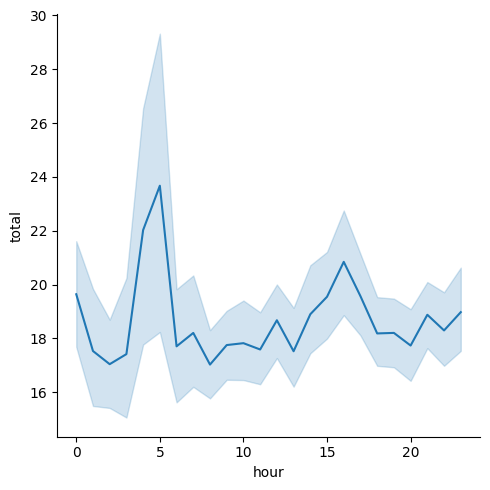

In [ ]:
trips["hour"] = trips["pickup"].dt.hour
sns.relplot(data=trips, x="hour", y="total", kind="line")

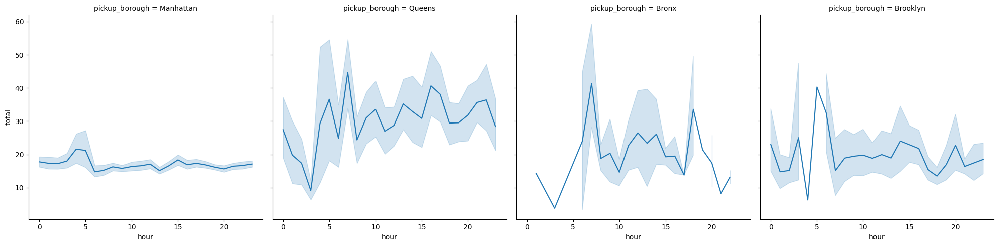

In [ ]:
sns.relplot(data=trips, x="hour", y="total", kind="line", col="pickup_borough")

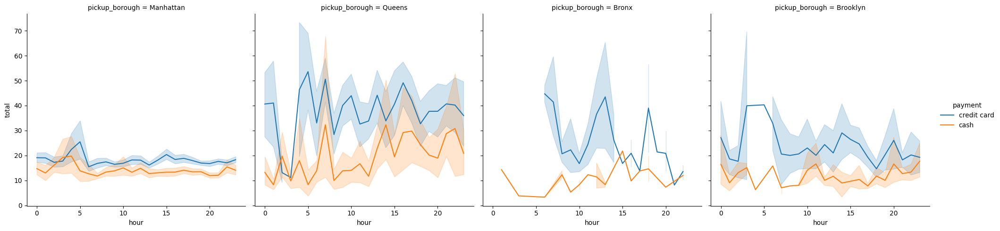

In [ ]:
sns.relplot(data=trips, x="hour", y="total", kind="line", col="pickup_borough", hue="payment")

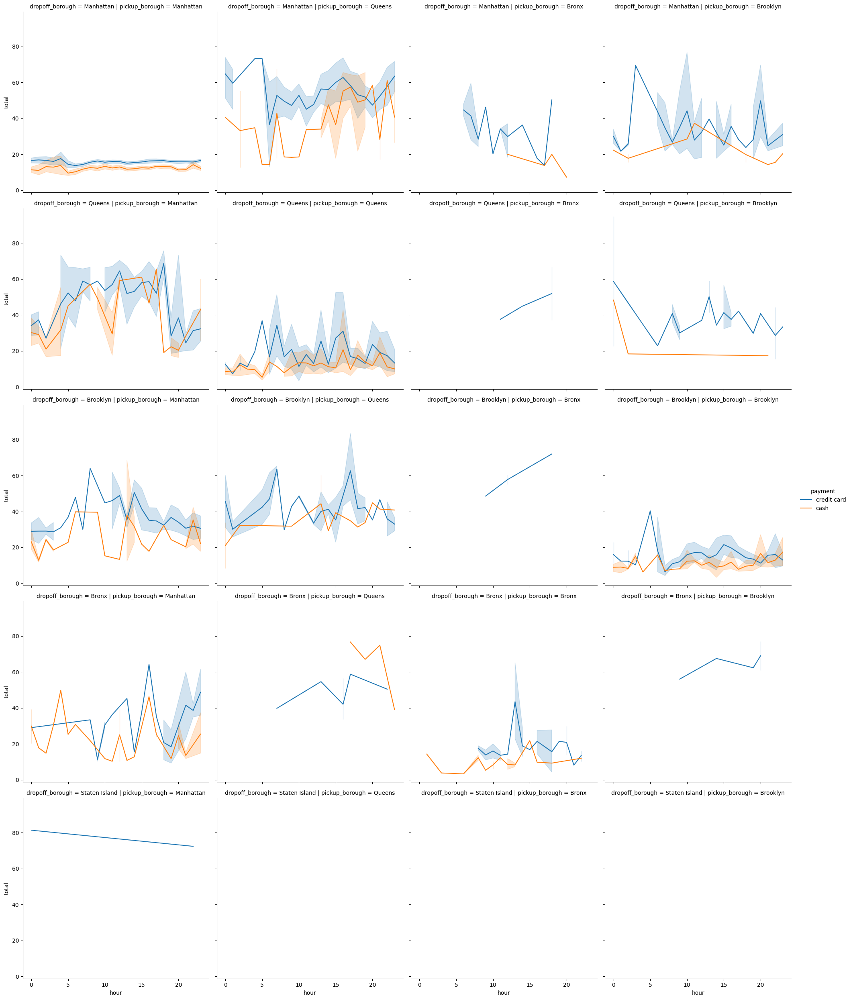

In [ ]:
sns.relplot(
    data=trips,
    x="hour",
    y="total",
    kind="line",
    col="pickup_borough",
    hue="payment",
    row="dropoff_borough"
)

In [ ]:
# 186. Resizing Seaborn Plots: Aspect & Height
flights = sns.load_dataset("flights")
flights


,year,month,passengers
0,1949,Jan,112
1,1949,Feb,118
2,1949,Mar,132
3,1949,Apr,129
4,1949,May,121
...,...,...,...
139,1960,Aug,606
140,1960,Sep,508
141,1960,Oct,461
142,1960,Nov,390


<Axes: xlabel='year', ylabel='passengers'>

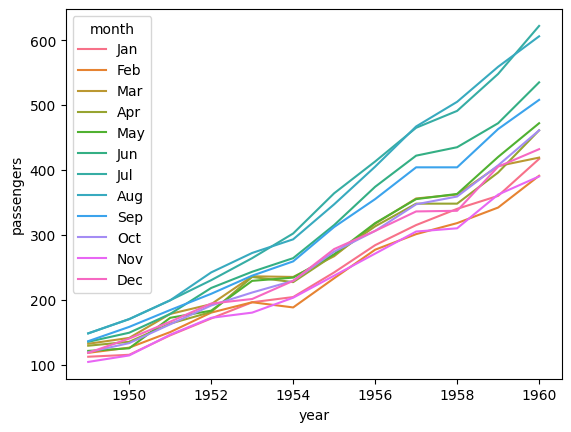

In [ ]:
sns.lineplot(data=flights, x="year", y="passengers", hue="month")

<Axes: xlabel='year', ylabel='passengers'>

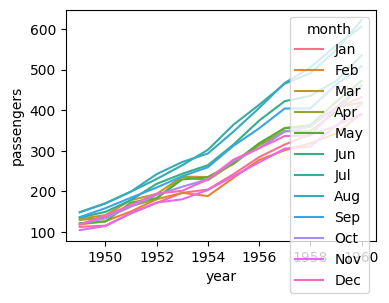

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(4, 3))
sns.lineplot(data=flights, x="year", y="passengers", hue="month")


<Axes: xlabel='year', ylabel='passengers'>

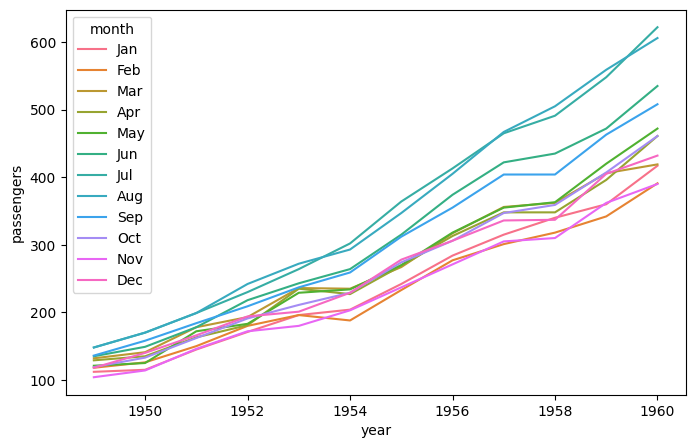

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(8, 5))
sns.lineplot(data=flights, x="year", y="passengers", hue="month")

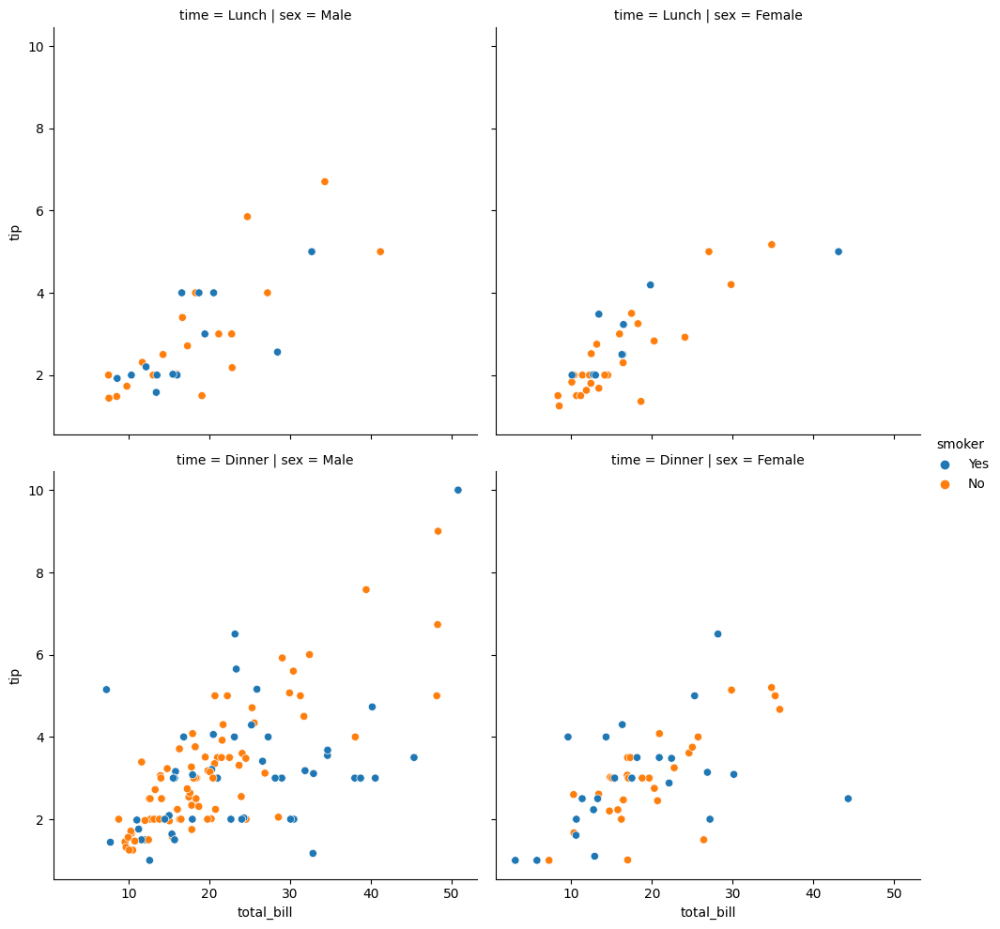

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
tips
sns.relplot(data=tips, x="total_bill", y="tip", hue="smoker", col="sex", row="time")

<Figure size 100x100 with 0 Axes>

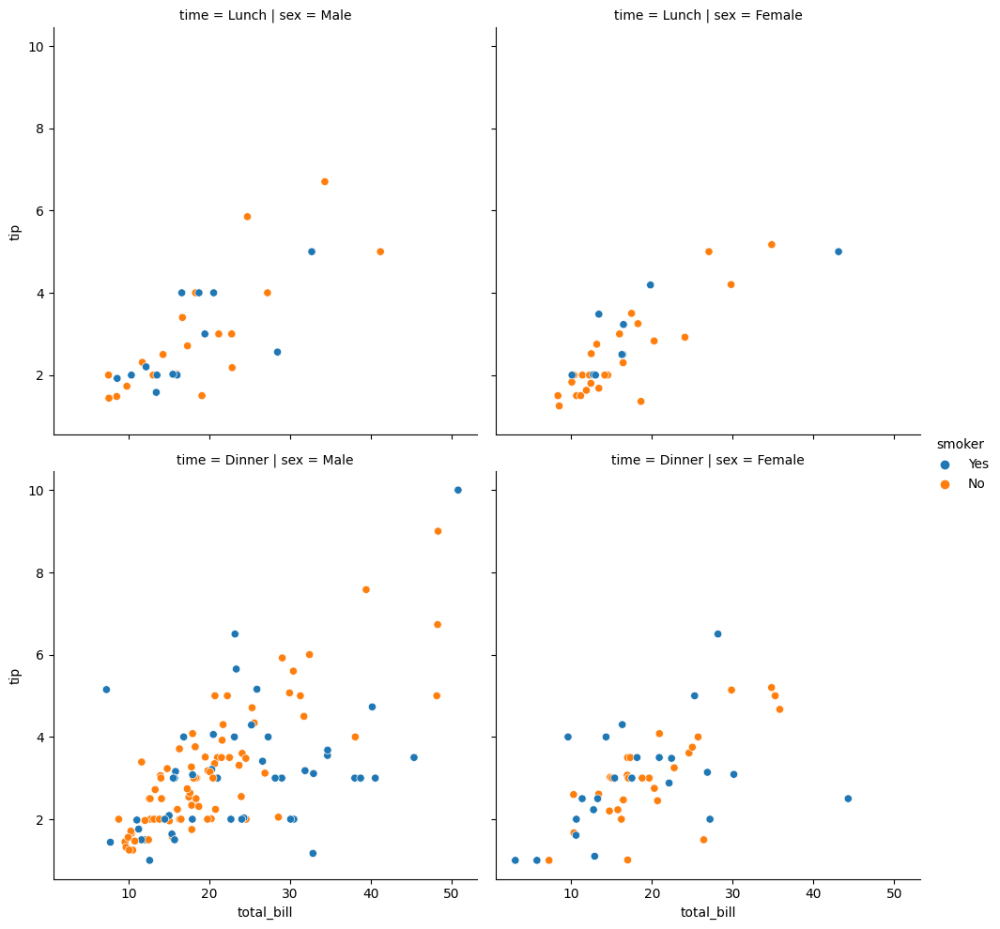

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
tips
plt.figure(figsize=(1, 1))
sns.relplot(data=tips,
            x="total_bill",
            y="tip",
            hue="smoker",
            col="sex",
            row="time"
            )

<Figure size 100x100 with 0 Axes>

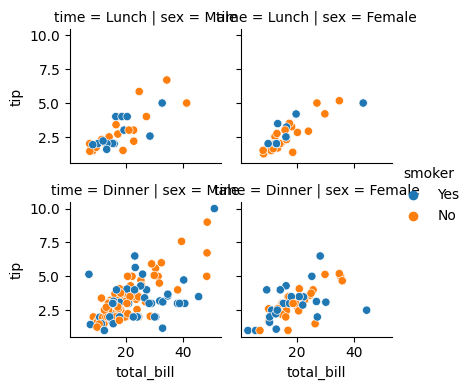

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
tips
plt.figure(figsize=(1, 1))
sns.relplot(data=tips,
            x="total_bill",
            y="tip",
            hue="smoker",
            col="sex",
            row="time"
            ,height=2
            )

<Figure size 100x100 with 0 Axes>

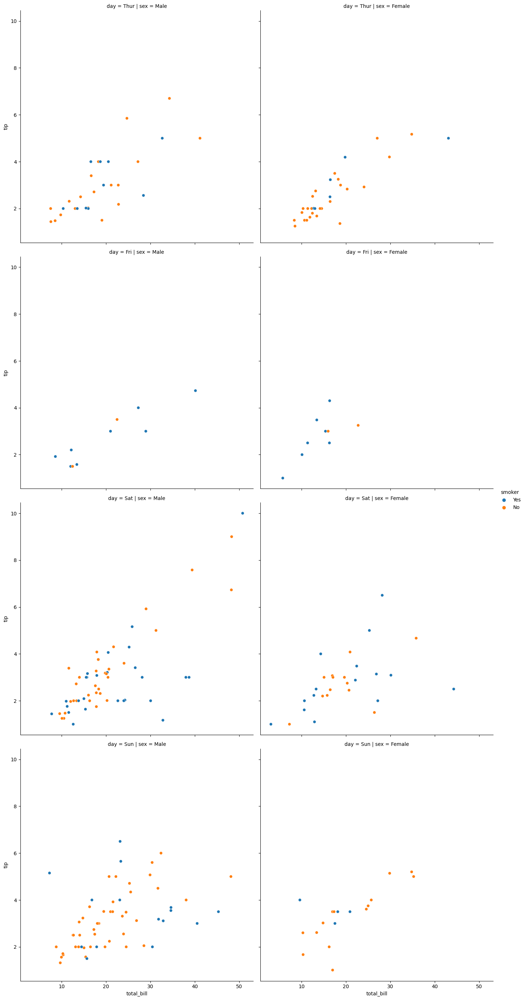

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

tips = sns.load_dataset("tips")
tips
plt.figure(figsize=(1, 1))
sns.relplot(data=tips,
            x="total_bill",
            y="tip",
            hue="smoker",
            col="sex",
            row="day"
            ,height=7
            )

<Figure size 100x100 with 0 Axes>

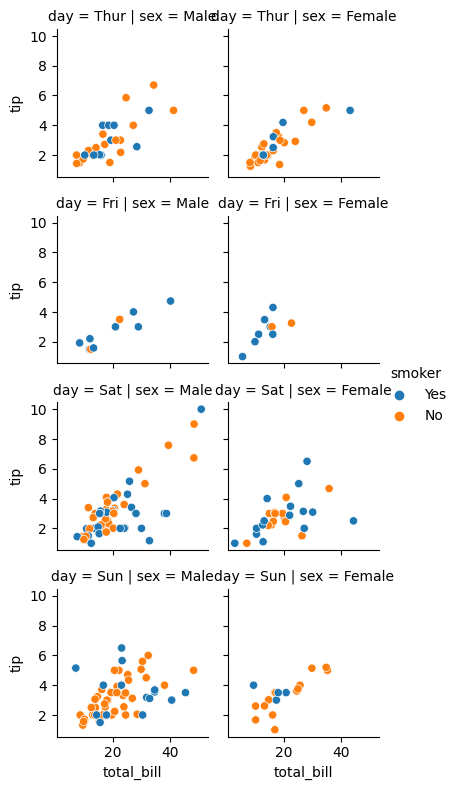

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

tips = sns.load_dataset("tips")
tips
plt.figure(figsize=(1, 1))
sns.relplot(data=tips,
            x="total_bill",
            y="tip",
            hue="smoker",
            col="sex",
            row="day"
            ,height=2,
            aspect=1
            )

<Figure size 100x100 with 0 Axes>

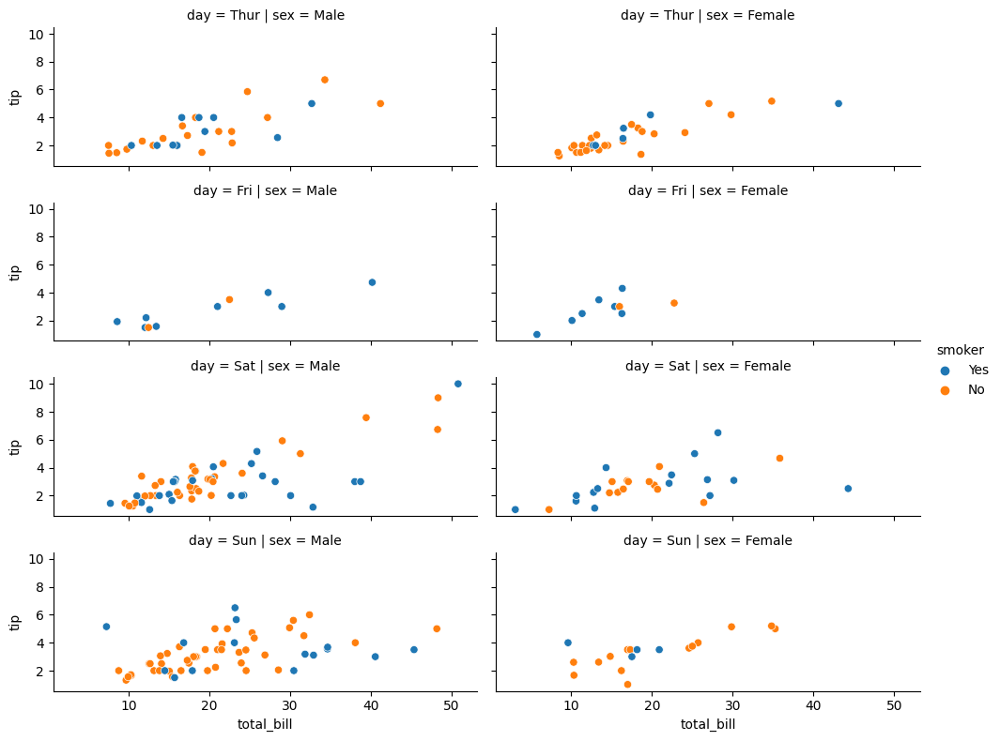

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

tips = sns.load_dataset("tips")
tips
plt.figure(figsize=(1, 1))
sns.relplot(data=tips,
            x="total_bill",
            y="tip",
            hue="smoker",
            col="sex",
            row="day"
            ,height=2,
            aspect=2.5
            )

<Figure size 100x100 with 0 Axes>

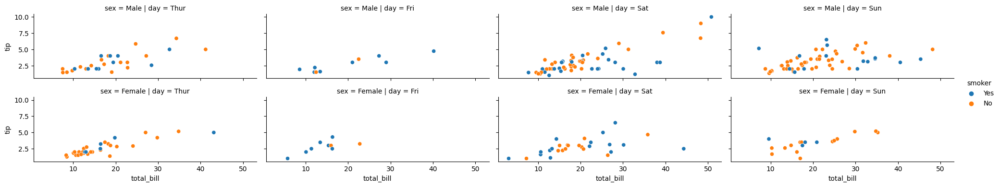

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

tips = sns.load_dataset("tips")
tips
plt.figure(figsize=(1, 1))
sns.relplot(data=tips,
            x="total_bill",
            y="tip",
            hue="smoker",
            col="day",
            row="sex"
            ,height=2,
            aspect=2.5
            )

<Axes: xlabel='tip', ylabel='Count'>

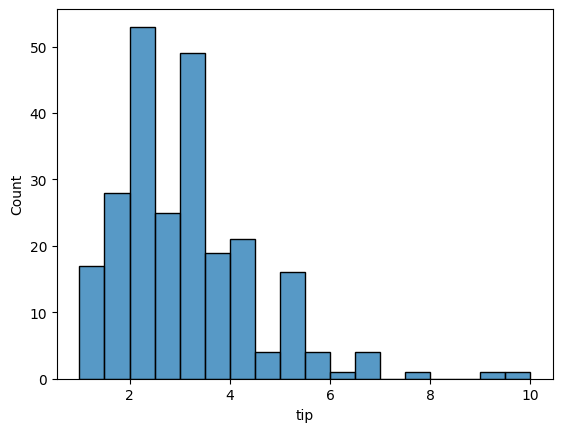

In [ ]:
# 187. Seaborn Histograms

import seaborn as sns
import matplotlib.pyplot as plt

tips = sns.load_dataset("tips")
tips
# plt.figure(figsize=(1, 1))
sns.histplot(data=tips,
            x="tip"
            )

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

tips = sns.load_dataset("tips")
tips


,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


<Axes: xlabel='tip', ylabel='Count'>

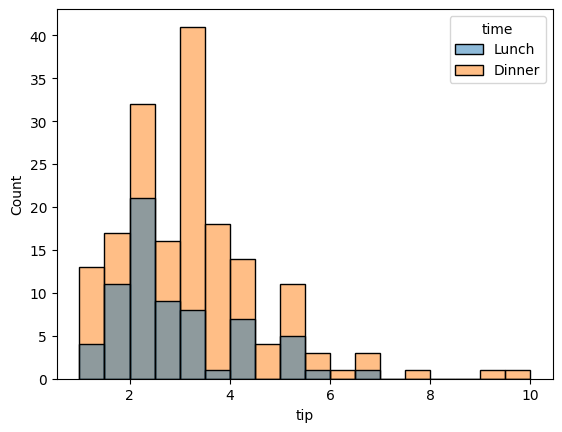

In [ ]:
# plt.figure(figsize=(1, 1))
sns.histplot(data=tips,
            x="tip",
             hue ="time"
            )

<Axes: xlabel='tip', ylabel='Count'>

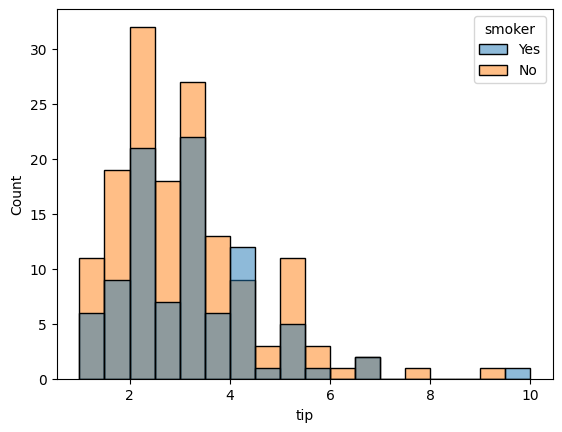

In [ ]:
sns.histplot(data=tips,
            x="tip",
             hue ="smoker"
            )

<Axes: xlabel='tip', ylabel='Count'>

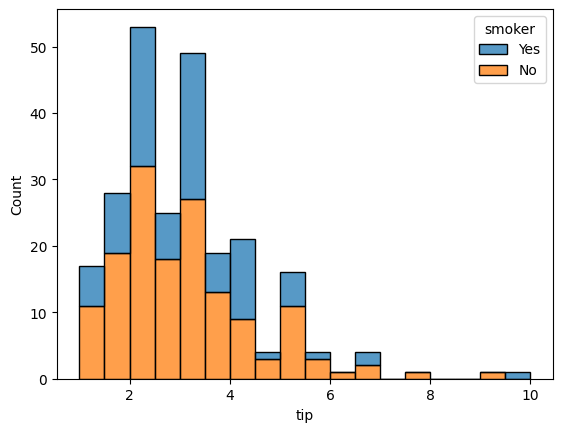

In [ ]:
sns.histplot(data=tips,
            x="tip",
             hue ="smoker",
             multiple="stack"
            )

<Axes: xlabel='tip', ylabel='Count'>

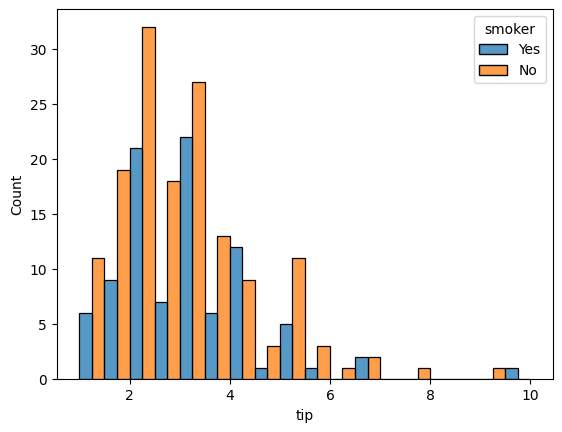

In [ ]:
sns.histplot(data=tips,
            x="tip",
             hue ="smoker",
             multiple="dodge"
            )

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

tips = sns.load_dataset("tips")
tips

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


<Axes: xlabel='tip', ylabel='Count'>

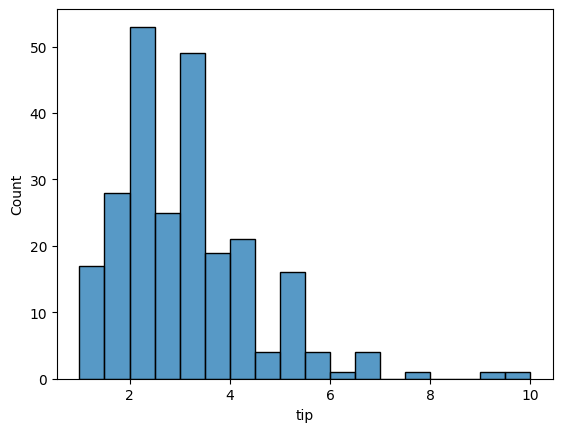

In [ ]:
sns.histplot(data=tips, x="tip")

<Axes: xlabel='tip', ylabel='Count'>

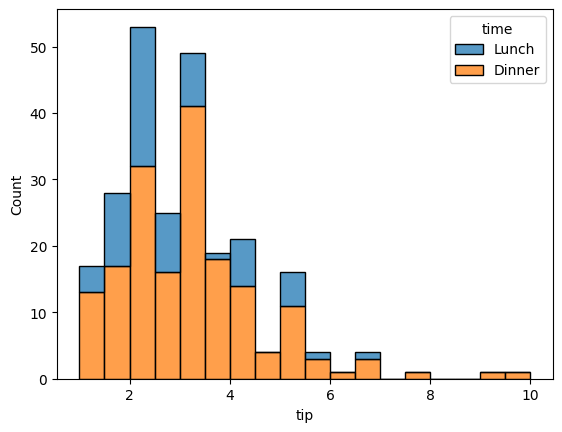

In [ ]:
sns.histplot(data=tips, x="tip", hue="time", multiple="stack")

<Axes: xlabel='tip', ylabel='Count'>

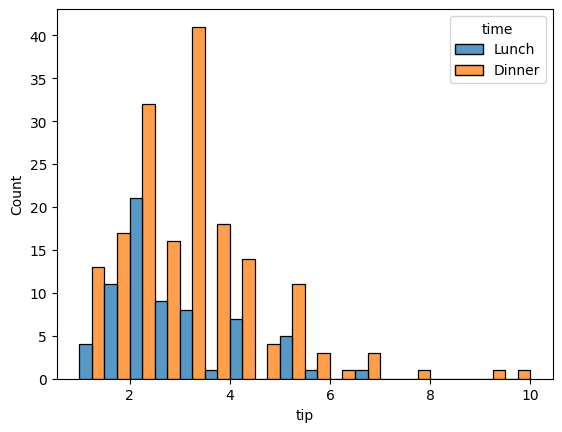

In [ ]:
sns.histplot(data=tips, x="tip", hue="time", multiple="dodge")

In [ ]:
sns.histplot(data=tips, x="tip", hue="time", )

In [ ]:
penguins = sns.load_dataset('penguins')

In [ ]:
penguins

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,Female
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,Male
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,Female


In [ ]:
penguins

<Axes: xlabel='body_mass_g', ylabel='Count'>

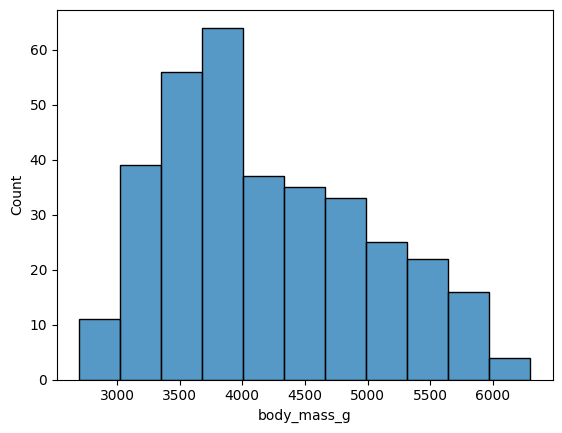

In [ ]:
sns.histplot(data=penguins, x="body_mass_g")

<Axes: xlabel='body_mass_g', ylabel='Count'>

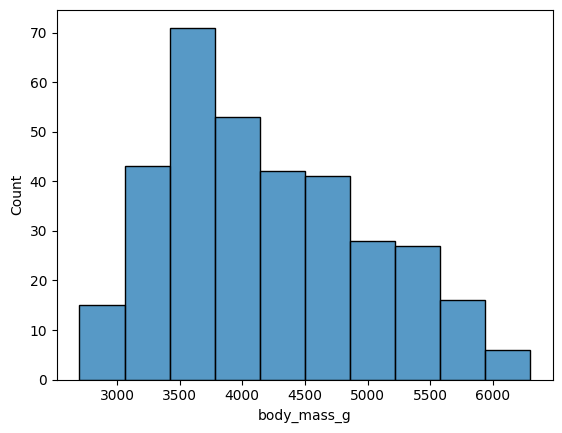

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=10)

<Axes: xlabel='body_mass_g', ylabel='Count'>

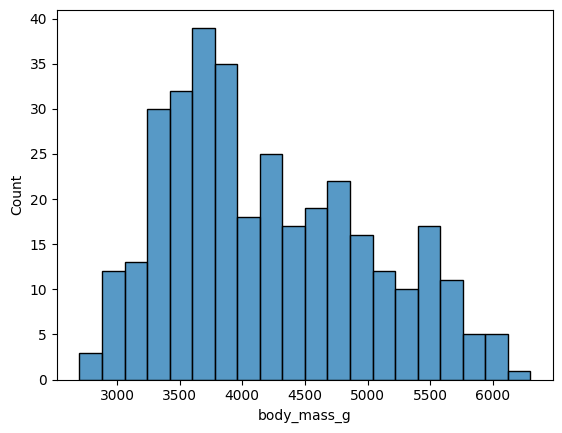

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20)

<Axes: xlabel='body_mass_g', ylabel='Count'>

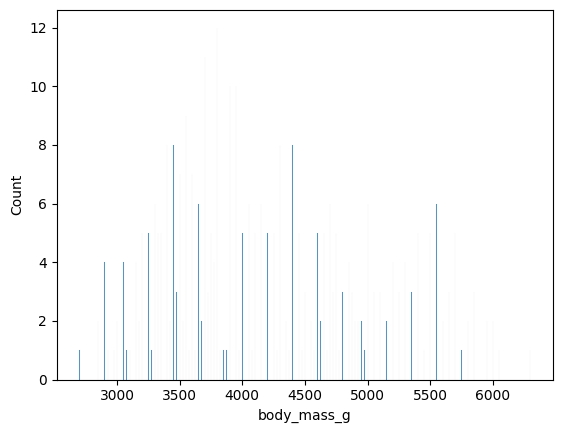

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", binwidth=2)

<Axes: xlabel='body_mass_g', ylabel='Count'>

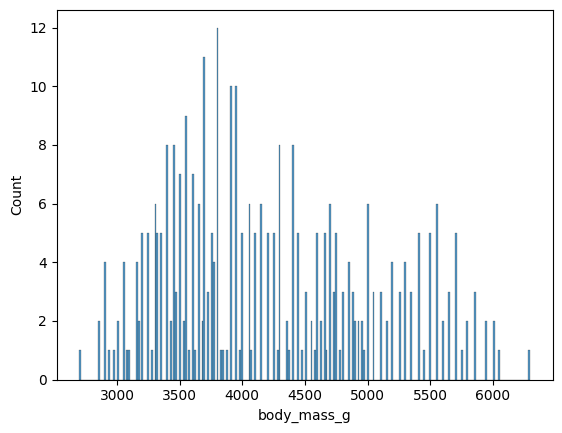

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", binwidth=15)

<Axes: xlabel='body_mass_g', ylabel='Count'>

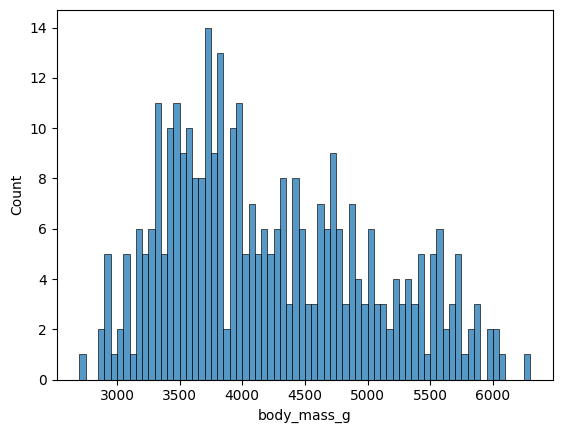

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", binwidth=50)

<Axes: xlabel='body_mass_g', ylabel='Count'>

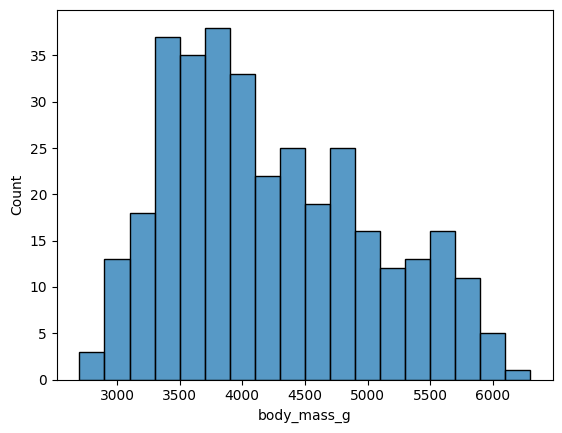

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", binwidth=200)

<Axes: xlabel='body_mass_g', ylabel='Count'>

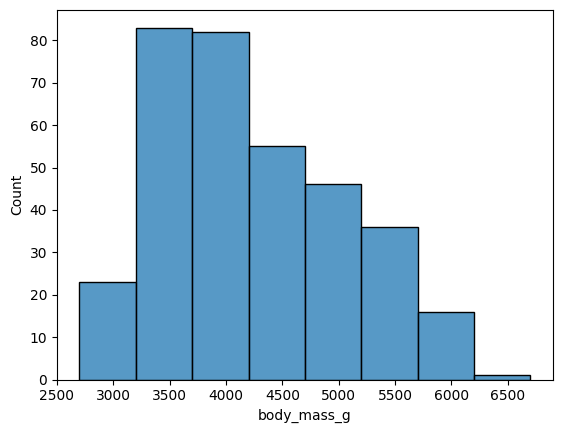

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", binwidth=500)

<Axes: xlabel='body_mass_g', ylabel='Count'>

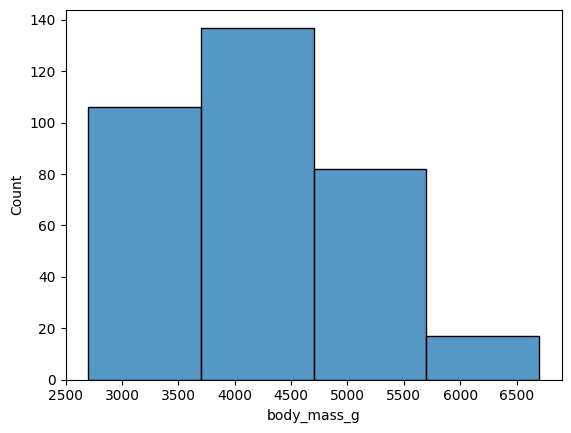

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", binwidth=1000)

<Axes: xlabel='body_mass_g', ylabel='Count'>

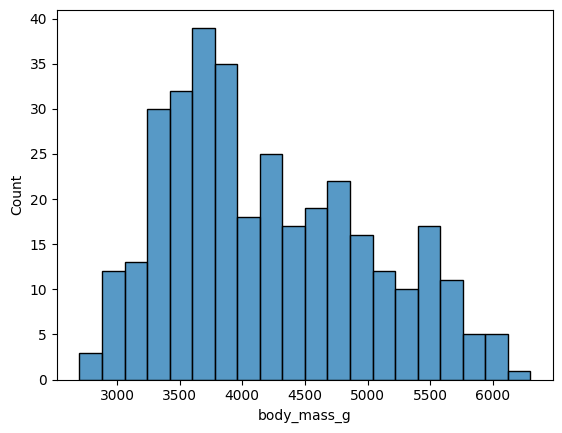

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20)

<Axes: xlabel='body_mass_g', ylabel='Count'>

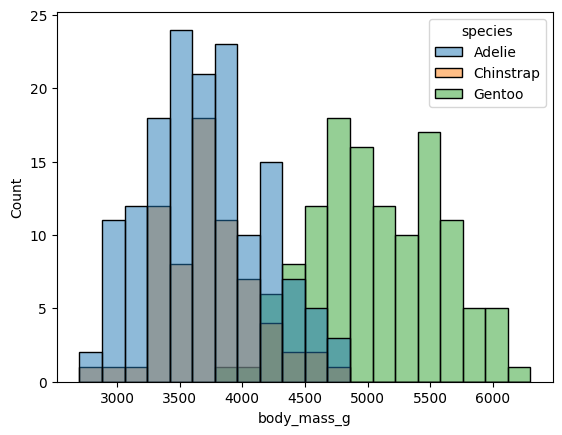

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20, hue="species")

<Axes: xlabel='body_mass_g', ylabel='Count'>

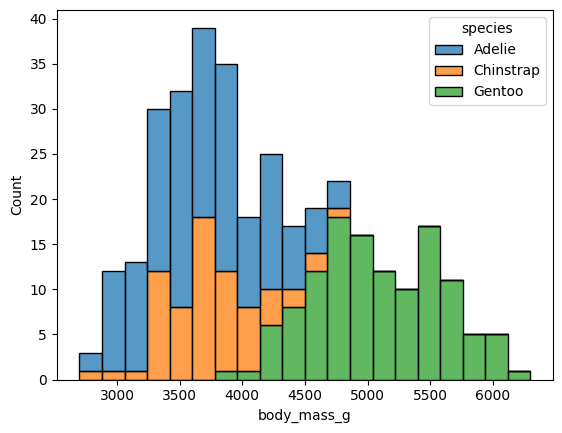

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20, hue="species", multiple="stack")

In [ ]:
import seaborn as sns
penguins = sns.load_dataset("penguins")
penguins

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,Female
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,Male
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,Female


<Axes: xlabel='body_mass_g', ylabel='Count'>

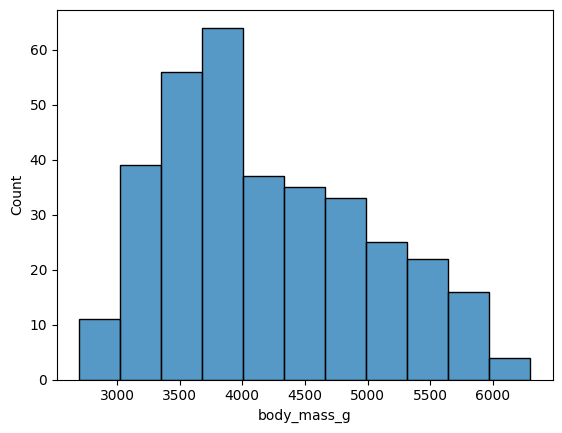

In [ ]:
sns.histplot(data=penguins, x="body_mass_g")

<Axes: xlabel='body_mass_g', ylabel='Count'>

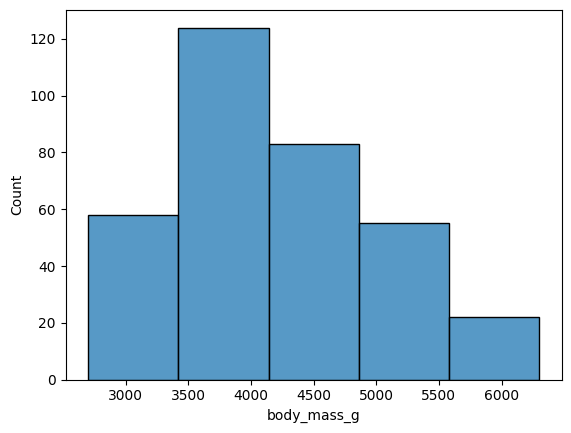

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=5)

<Axes: xlabel='body_mass_g', ylabel='Count'>

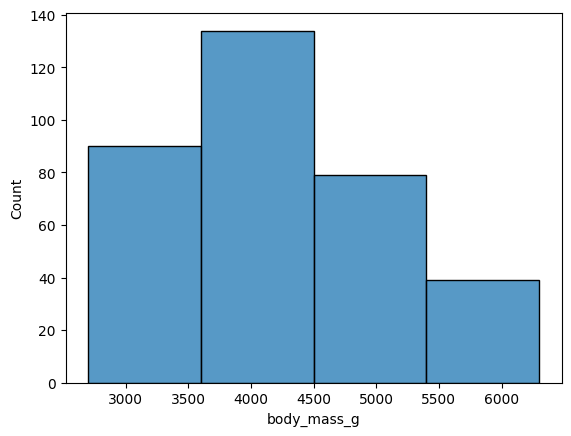

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", binwidth=900)

In [ ]:
penguins

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,Female
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,Male
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,Female


<Axes: xlabel='body_mass_g', ylabel='Count'>

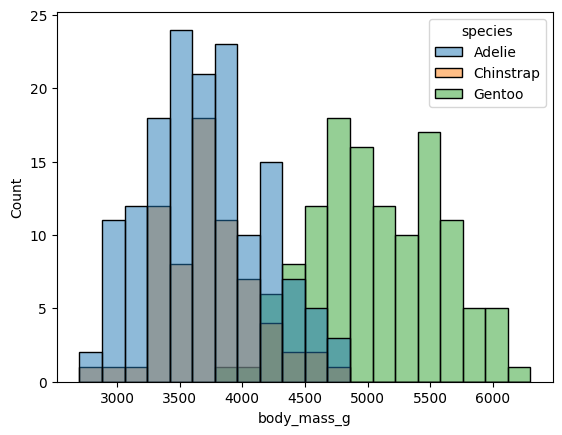

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20, hue="species")

<Axes: xlabel='body_mass_g', ylabel='Count'>

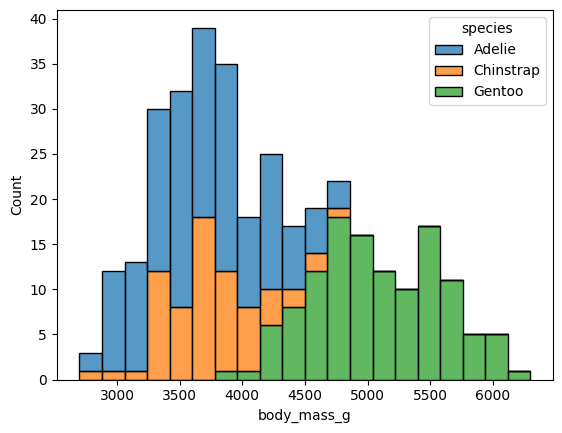

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20, hue="species", multiple="stack")

<Axes: xlabel='body_mass_g', ylabel='Count'>

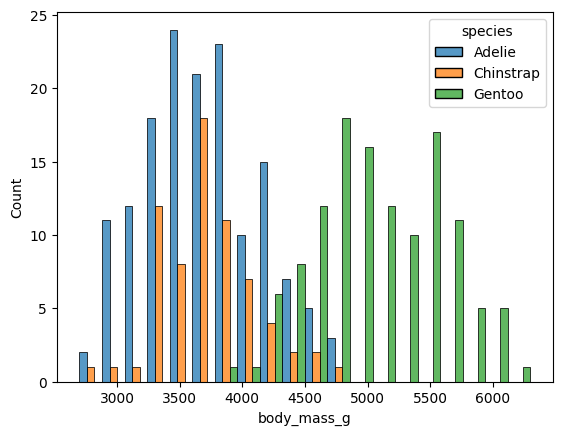

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20, hue="species", multiple="dodge")

<Axes: xlabel='body_mass_g', ylabel='Count'>

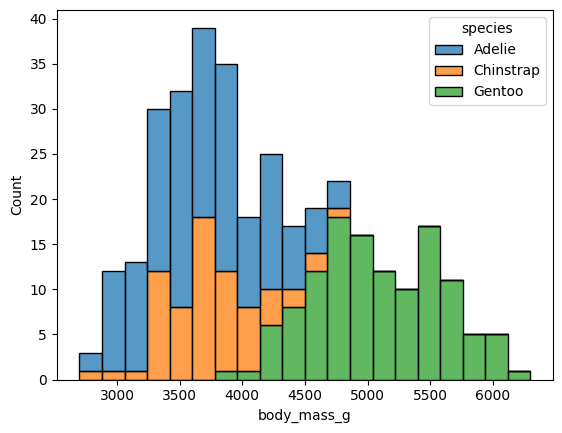

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20, hue="species", multiple="stack")

<Axes: xlabel='body_mass_g', ylabel='Count'>

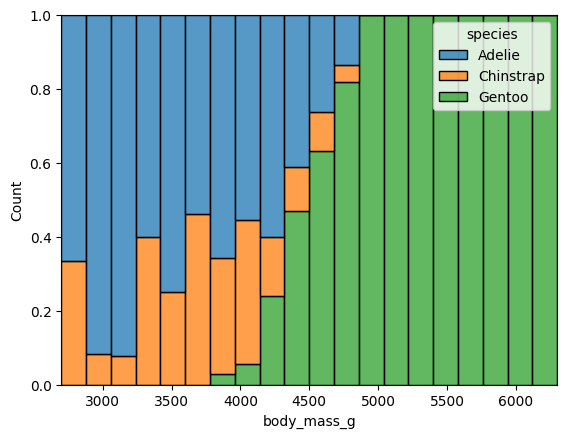

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20, hue="species", multiple="fill")

<Axes: xlabel='body_mass_g', ylabel='Count'>

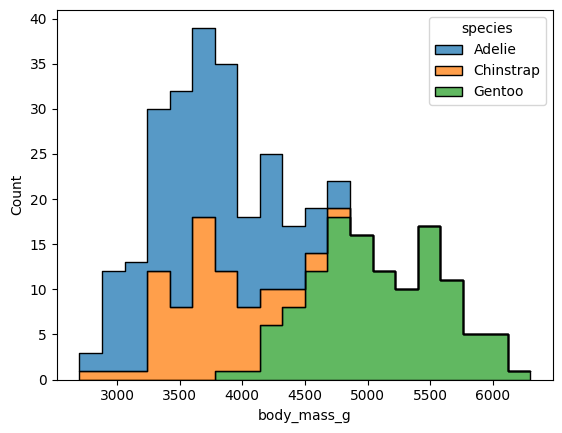

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20, hue="species", multiple="stack", element="step")

<Axes: xlabel='body_mass_g', ylabel='Count'>

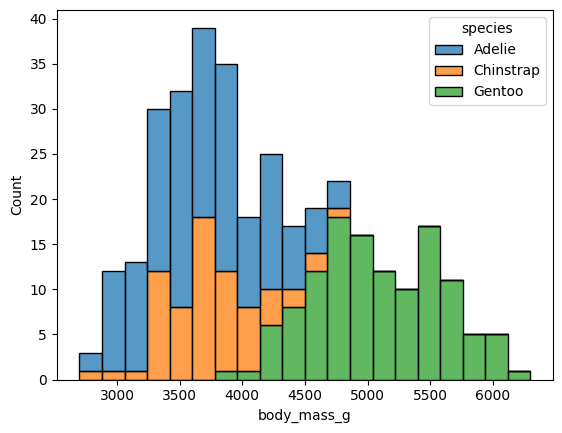

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20, hue="species", multiple="stack", element="bars")

<Axes: xlabel='body_mass_g', ylabel='Count'>

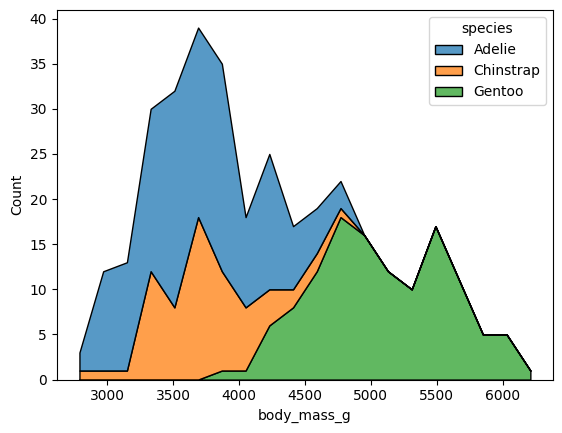

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20, hue="species", multiple="stack", element="poly")

In [ ]:
import seaborn as sns
penguins = sns.load_dataset("penguins")
penguins

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,Female
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,Male
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,Female


<Axes: xlabel='body_mass_g', ylabel='Count'>

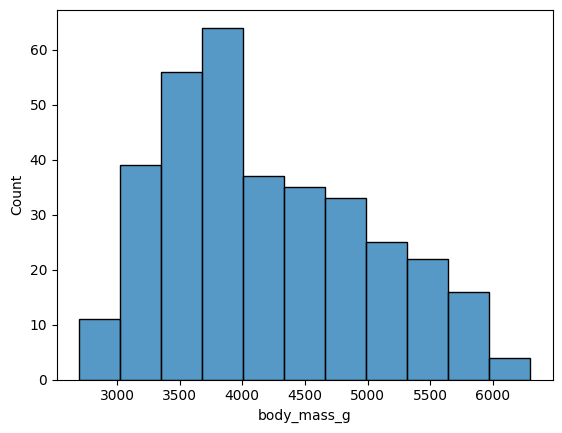

In [ ]:
sns.histplot(data=penguins, x="body_mass_g")

<Axes: xlabel='body_mass_g', ylabel='Count'>

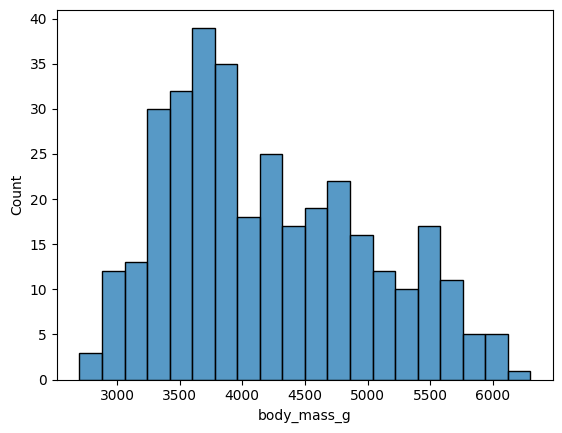

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20)

<Axes: xlabel='body_mass_g', ylabel='Count'>

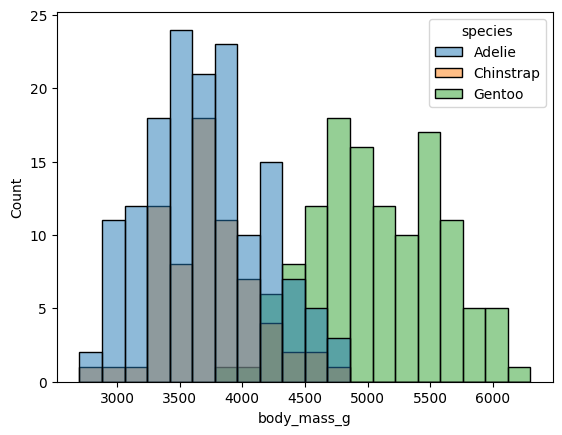

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20, hue="species")

<Axes: xlabel='body_mass_g', ylabel='Count'>

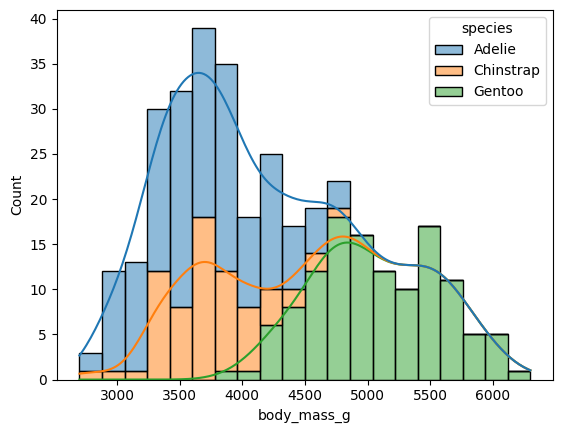

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20, hue="species", multiple="stack", kde=True)

<Axes: xlabel='body_mass_g', ylabel='Count'>

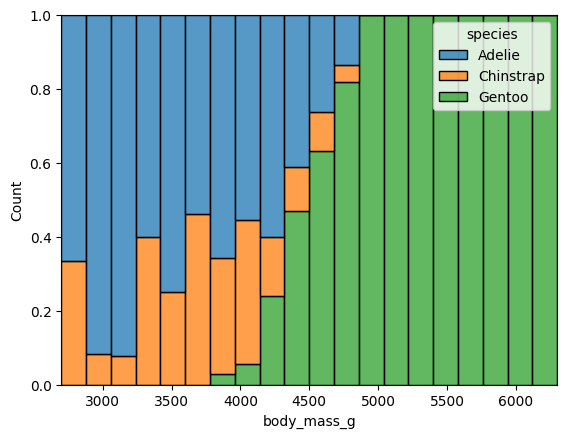

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20, hue="species", multiple="fill")

<Axes: xlabel='body_mass_g', ylabel='Count'>

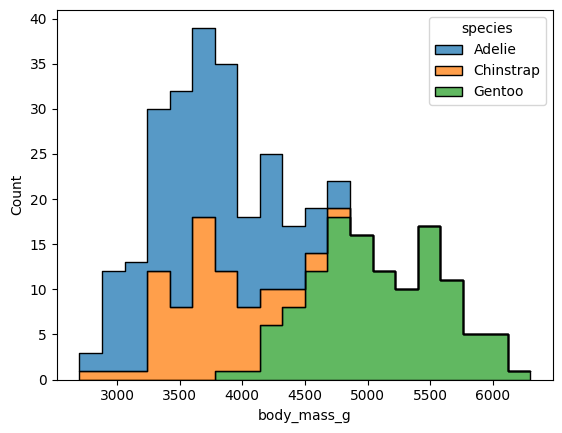

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20, hue="species", multiple="stack", element="step")

<Axes: xlabel='body_mass_g', ylabel='Count'>

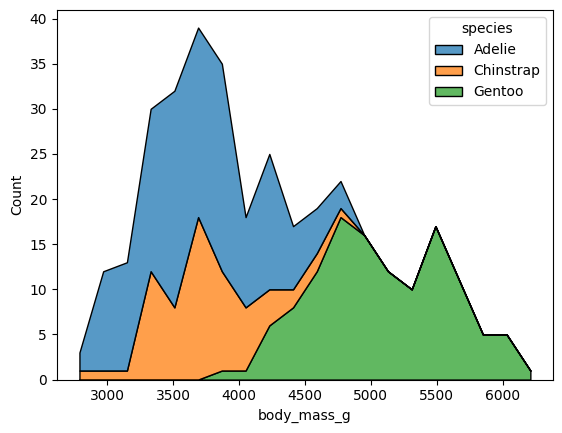

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", bins=20, hue="species", multiple="stack", element="poly")

In [ ]:
tips = sns.load_dataset("tips")

In [ ]:
tips

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


<Axes: xlabel='tip', ylabel='Count'>

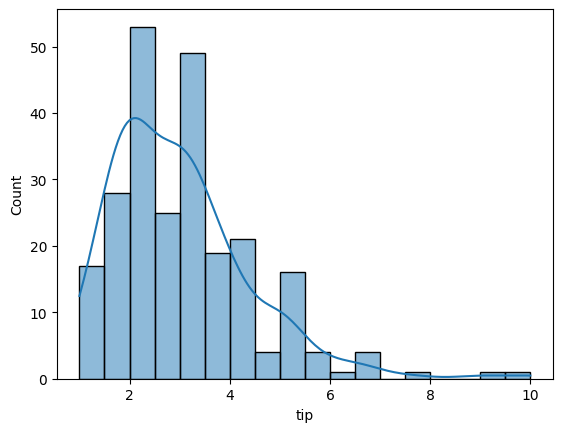

In [ ]:
sns.histplot(data=tips, x="tip", kde=True)

<Axes: xlabel='body_mass_g', ylabel='Density'>

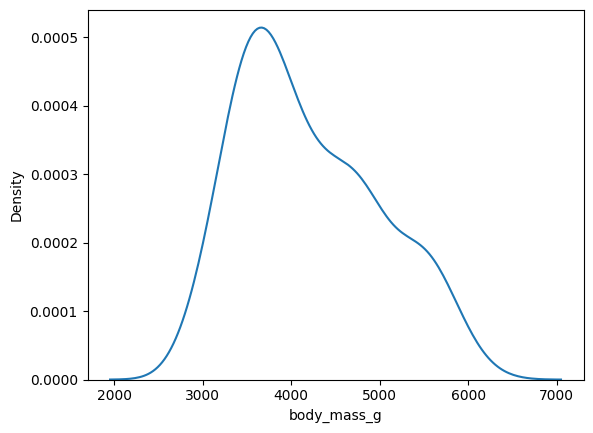

In [ ]:
# 188. KDE Plots
sns.kdeplot(data=penguins, x="body_mass_g")

<Axes: xlabel='body_mass_g', ylabel='Density'>

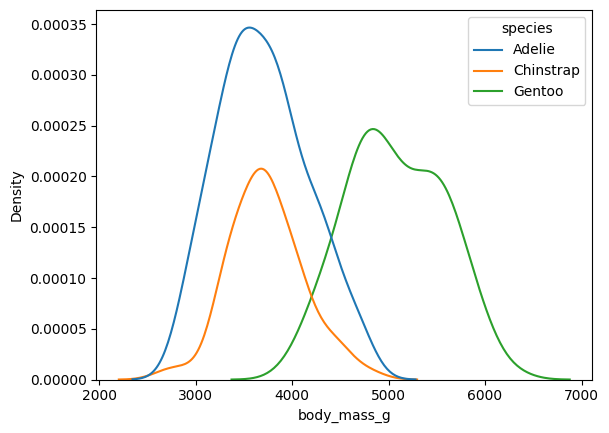

In [ ]:
# 188. KDE Plots
sns.kdeplot(data=penguins, x="body_mass_g", hue="species")

<Axes: xlabel='body_mass_g', ylabel='Density'>

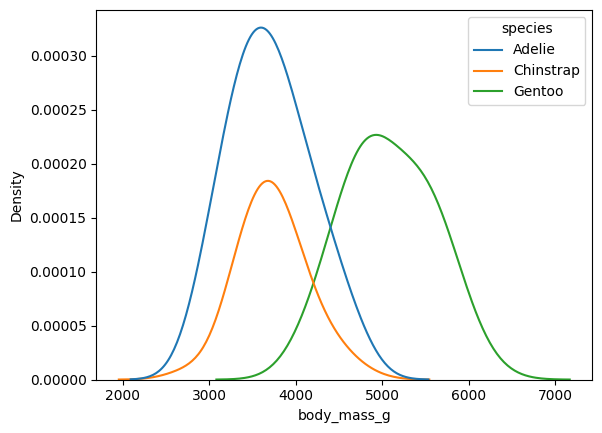

In [ ]:
sns.kdeplot(data=penguins, x="body_mass_g", hue="species", bw_adjust=1.5)

<Axes: xlabel='body_mass_g', ylabel='Density'>

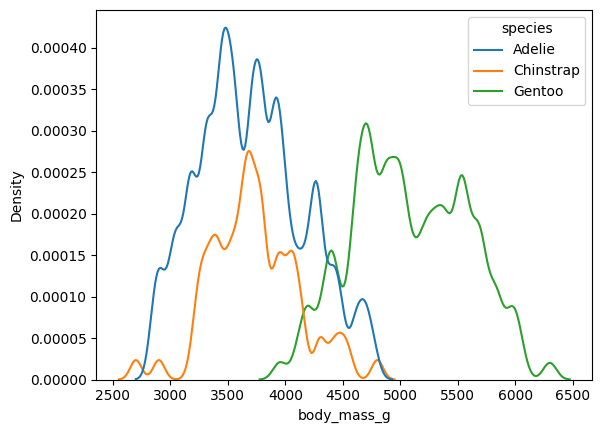

In [ ]:
sns.kdeplot(data=penguins, x="body_mass_g", hue="species", bw_adjust=0.3)

<Axes: xlabel='body_mass_g', ylabel='Density'>

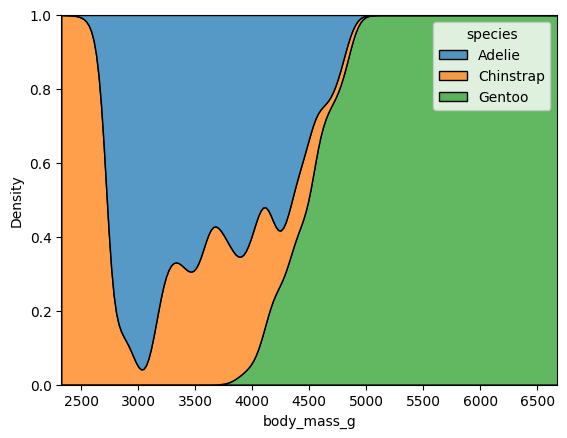

In [ ]:
sns.kdeplot(data=penguins, x="body_mass_g", hue="species", bw_adjust=0.5, multiple="fill")

<Axes: xlabel='body_mass_g', ylabel='Density'>

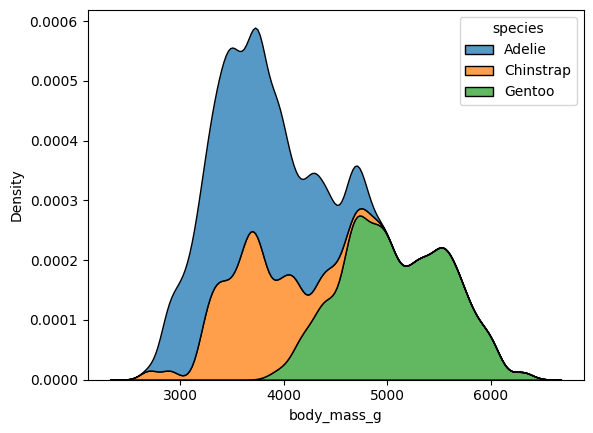

In [ ]:
sns.kdeplot(data=penguins, x="body_mass_g", hue="species", bw_adjust=0.5, multiple="stack")

In [ ]:
# 189. Bivariate Distribution Plots
penguins

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,Female
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,Male
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,Female


<Axes: xlabel='flipper_length_mm', ylabel='Count'>

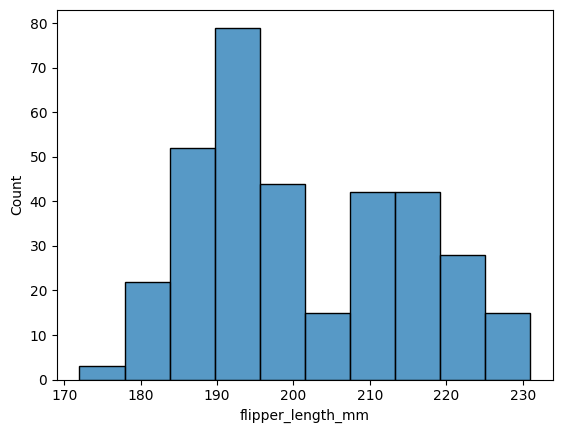

In [ ]:
sns.histplot(data=penguins, x="flipper_length_mm")

<Axes: xlabel='body_mass_g', ylabel='Count'>

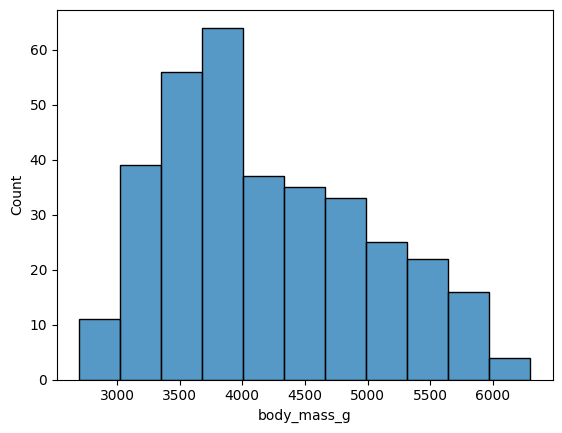

In [ ]:
sns.histplot(data=penguins, x="body_mass_g")

<Axes: xlabel='body_mass_g', ylabel='flipper_length_mm'>

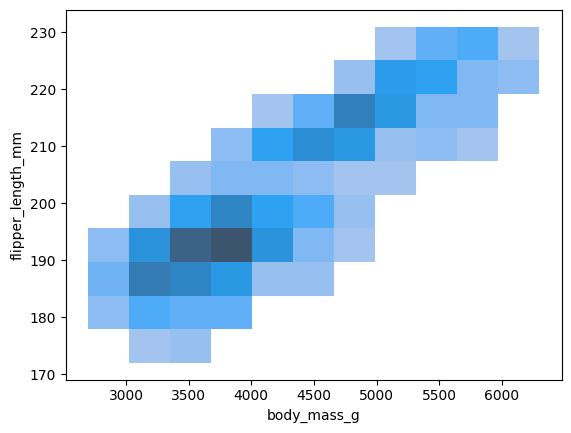

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", y = "flipper_length_mm")

<Axes: xlabel='body_mass_g', ylabel='flipper_length_mm'>

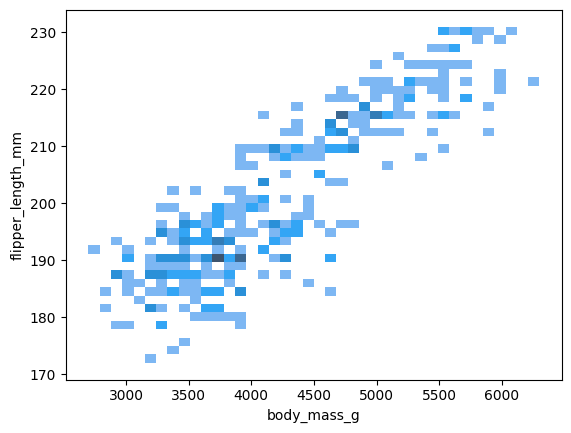

In [ ]:
sns.histplot(data=penguins, x="body_mass_g", y = "flipper_length_mm", bins=40)

<Axes: xlabel='body_mass_g', ylabel='flipper_length_mm'>

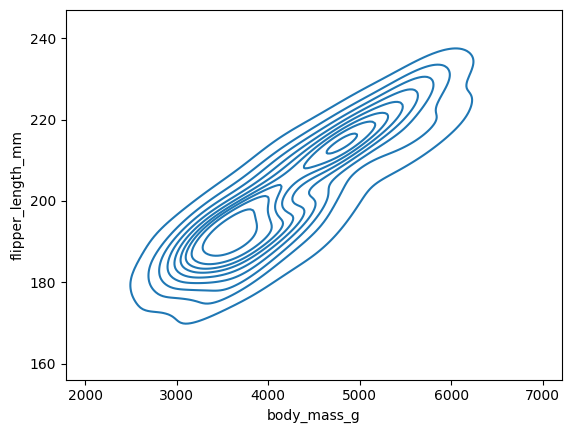

In [ ]:
sns.kdeplot(data=penguins, x="body_mass_g", y = "flipper_length_mm")

In [ ]:
import seaborn as sns
penguins = sns.load_dataset('penguins')
penguins

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,Female
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,Male
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,Female


<Axes: xlabel='bill_length_mm', ylabel='flipper_length_mm'>

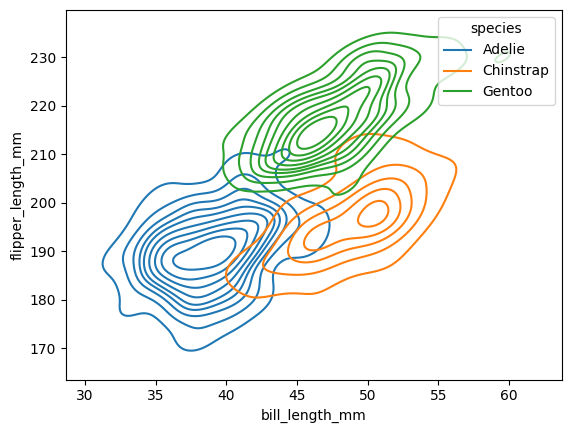

In [ ]:
sns.kdeplot(data=penguins, x="bill_length_mm", y = "flipper_length_mm", hue="species")

<Axes: xlabel='bill_length_mm', ylabel='flipper_length_mm'>

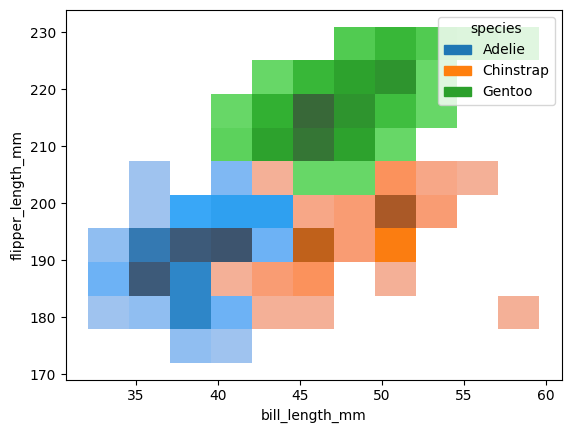

In [ ]:
sns.kdeplot(data=penguins, x="bill_length_mm", y = "flipper_length_mm", hue="species")

<Axes: xlabel='bill_length_mm', ylabel='flipper_length_mm'>

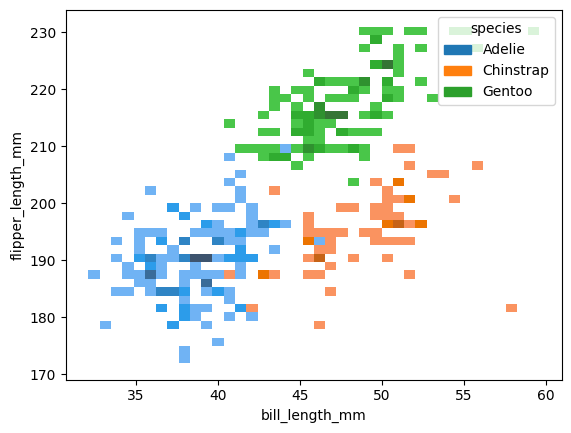

In [ ]:
sns.histplot(data=penguins, x="bill_length_mm", y = "flipper_length_mm", hue="species", bins=40)

<Axes: xlabel='tip'>

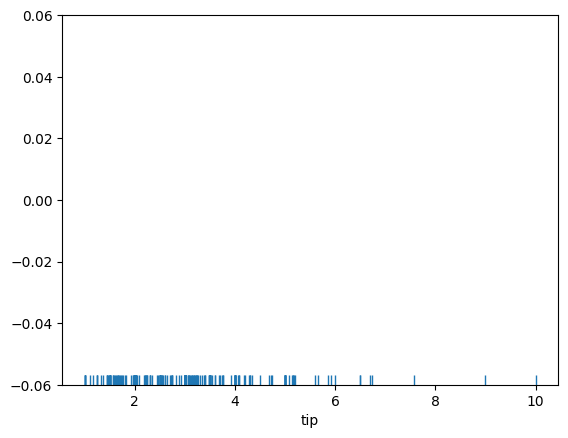

In [ ]:
# 190. Rugplots

tips = sns.load_dataset("tips")
sns.rugplot(data=tips, x="tip")

<Axes: xlabel='tip'>

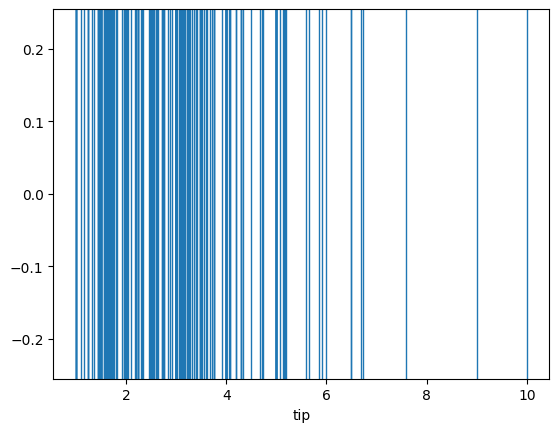

In [ ]:
sns.rugplot(data=tips, x="tip", height=1)

<Axes: xlabel='tip'>

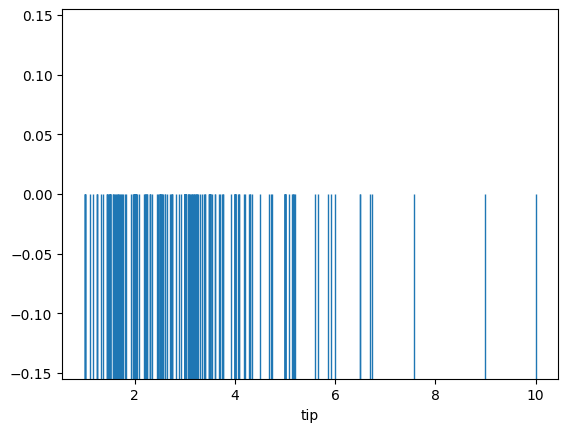

In [ ]:
sns.rugplot(data=tips, x="tip", height=0.5)

<Axes: ylabel='tip'>

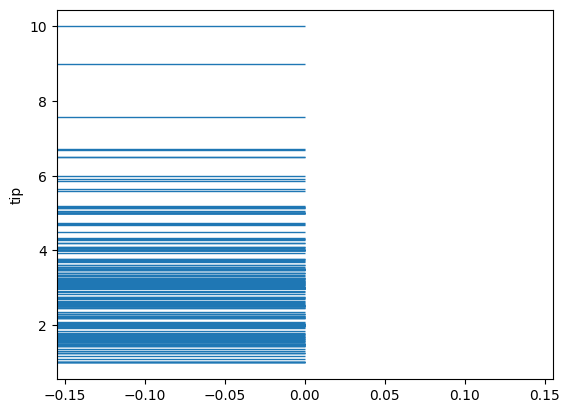

In [ ]:
sns.rugplot(data=tips, y="tip", height=0.5)

<Axes: xlabel='total_bill'>

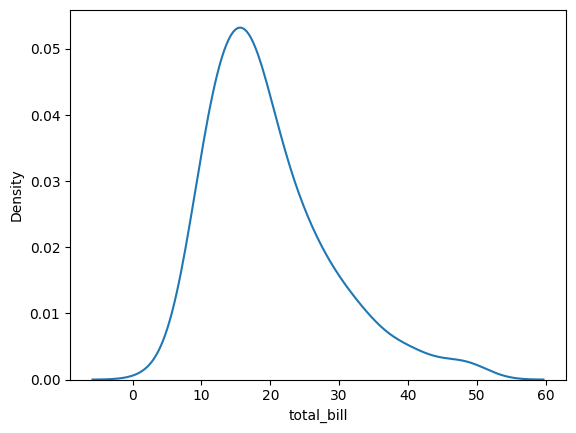

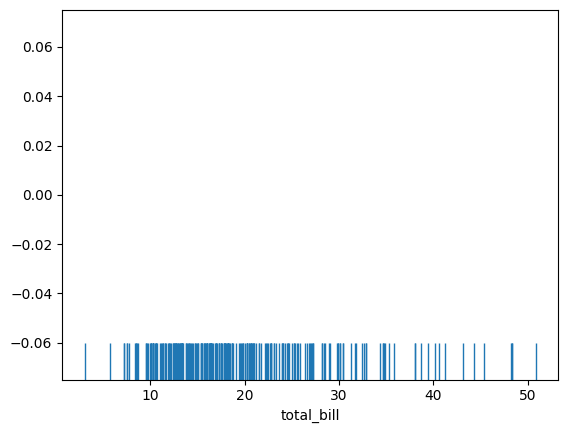

In [ ]:
import matplotlib.pyplot as plt
sns.kdeplot(data=tips, x="total_bill")
plt.figure()
sns.rugplot(data=tips, x="total_bill", height=0.1)

<Axes: xlabel='total_bill', ylabel='Density'>

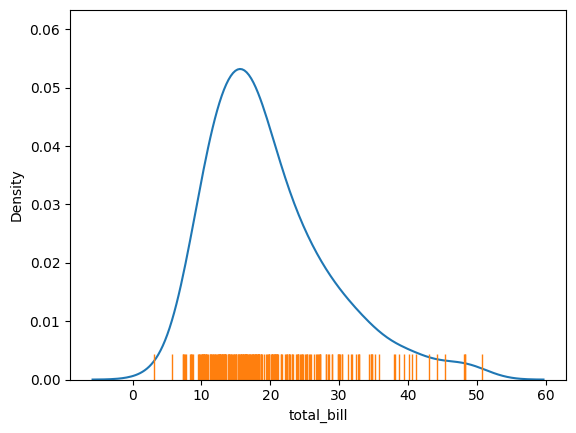

In [ ]:
import matplotlib.pyplot as plt
sns.kdeplot(data=tips, x="total_bill")
# plt.figure()
sns.rugplot(data=tips, x="total_bill", height=0.07)

<Axes: xlabel='total_bill', ylabel='tip'>

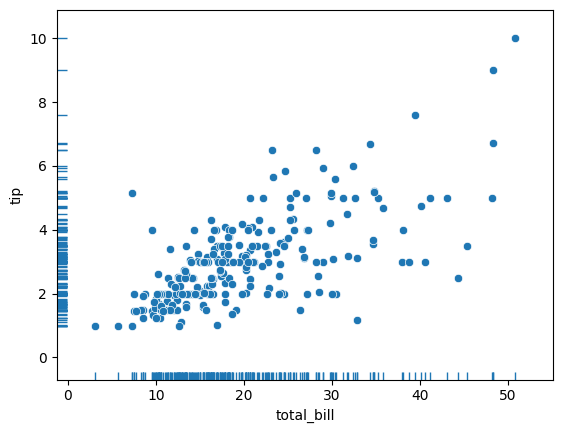

In [ ]:
import matplotlib.pyplot as plt
sns.scatterplot(data=tips, x="total_bill", y="tip")
# plt.figure()
sns.rugplot(data=tips, x="total_bill",  y="tip", height=0.02)

In [ ]:
import seaborn as sns
diamonds = sns.load_dataset("diamonds")
diamonds

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53935,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53936,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53937,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53938,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74


<Axes: xlabel='carat', ylabel='price'>

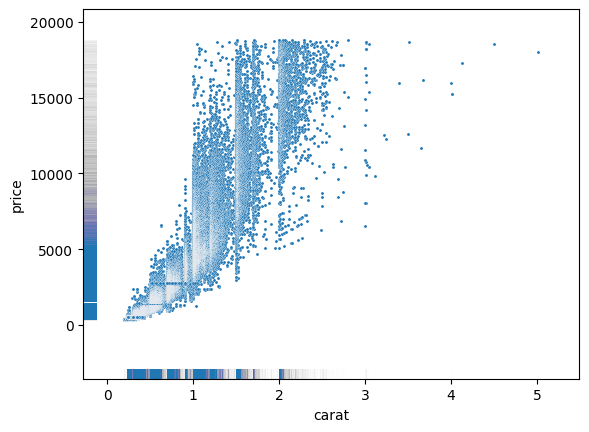

In [ ]:
sns.scatterplot(data=diamonds, x="carat", y="price", s=5)
sns.rugplot(data=diamonds, x="carat", y="price", lw=1, alpha=.005)

In [ ]:
# 191. The Amazing displot() Method
penguins = sns.load_dataset("penguins")
penguins


,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,Female
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,Male
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,Female


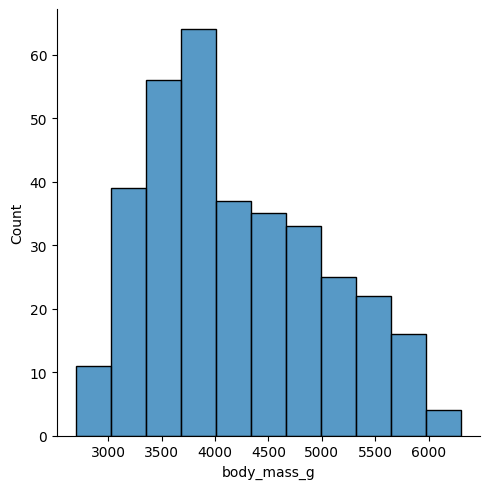

In [ ]:
sns.displot(kind="hist", data=penguins, x="body_mass_g")

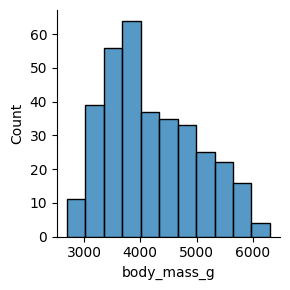

In [ ]:
sns.displot(kind="hist", data=penguins, x="body_mass_g", height=3)

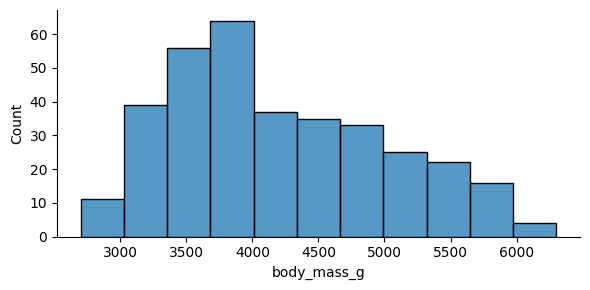

In [ ]:
sns.displot(kind="hist", data=penguins, x="body_mass_g", height=3, aspect=2)

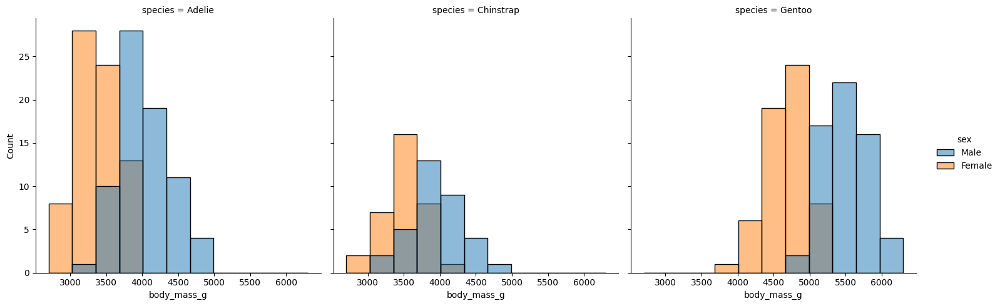

In [ ]:
sns.displot(
    kind="hist",
    data=penguins,
    x="body_mass_g",
    hue="sex",
    col="species",
    alpha=0.5
)

In [ ]:
penguins


,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,Female
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,Male
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,Female


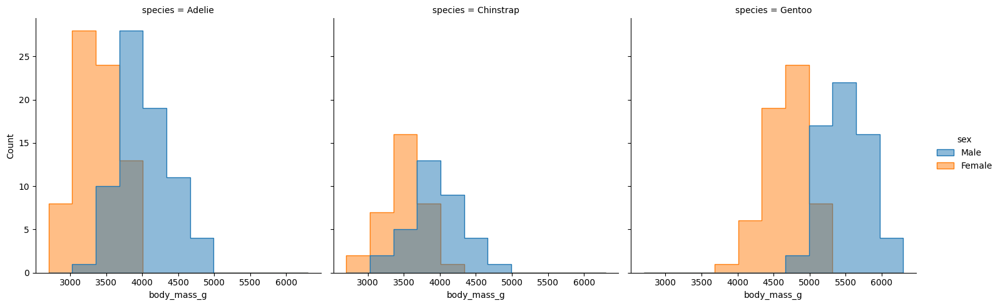

In [ ]:
sns.displot(
    kind="hist",
    data=penguins,
    x="body_mass_g",
    hue="sex",
    col="species",
    alpha=0.5,
    element="step"
)

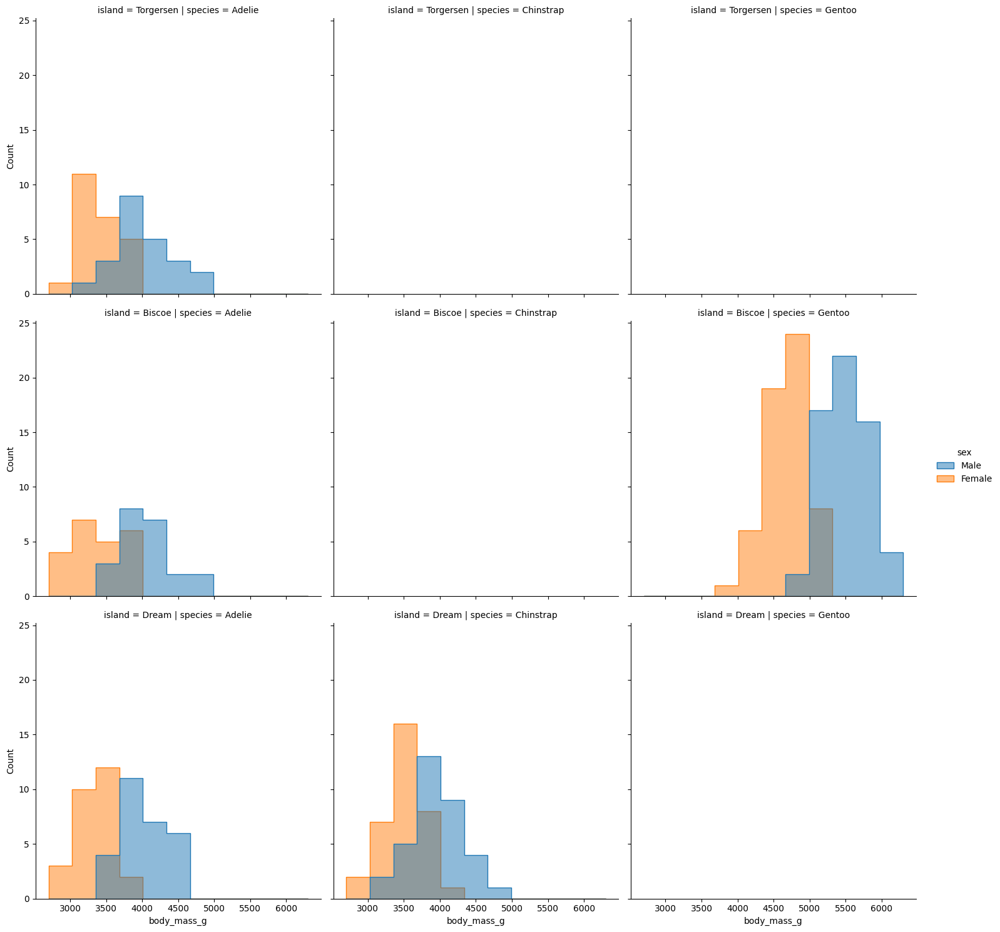

In [ ]:
sns.displot(
    kind="hist",
    data=penguins,
    x="body_mass_g",
    hue="sex",
    col="species",
    alpha=0.5,
    element="step",
    row="islandb"
)

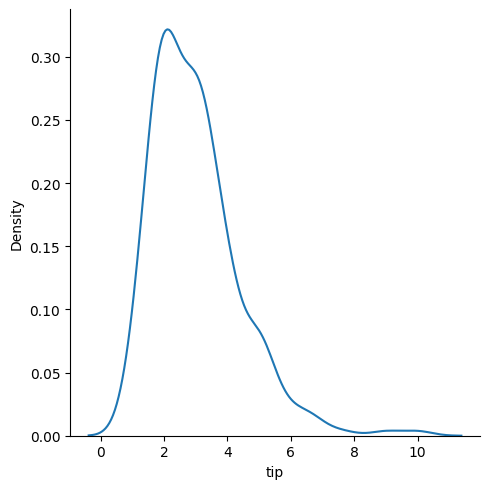

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")
mbsns.displot(data=tips, kind="kde", x="tip")

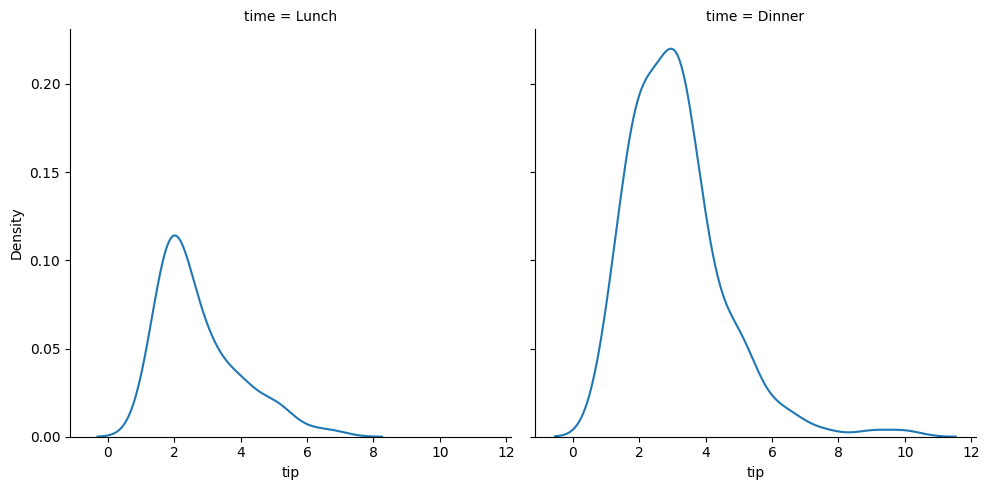

In [ ]:
sns.displot(data=tips, kind="kde", x="tip", col="time")

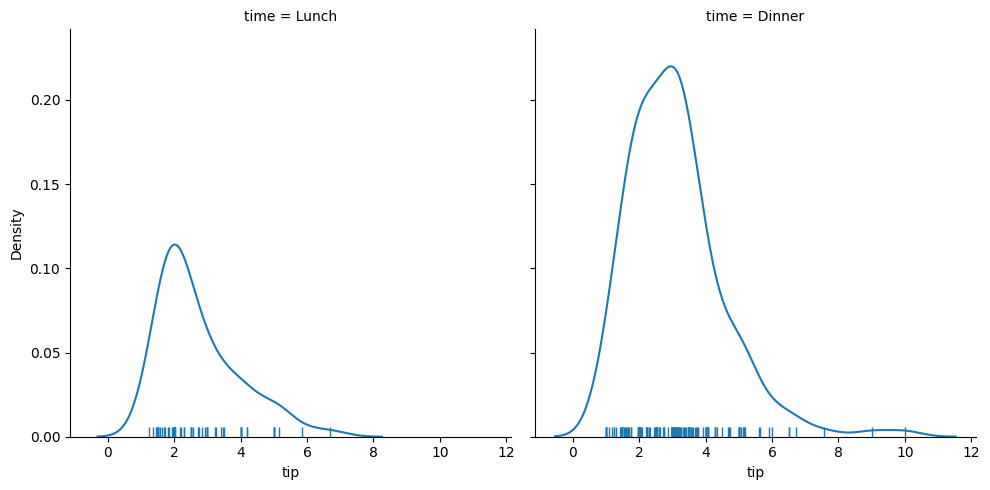

In [ ]:
sns.displot(data=tips, kind="kde", x="tip", col="time", rug=True)

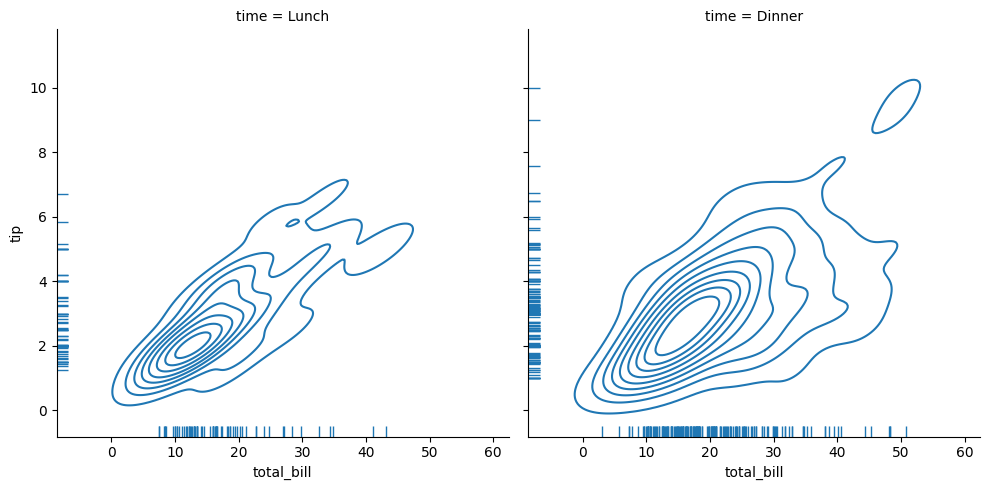

In [ ]:
sns.displot(data=tips, kind="kde", x="total_bill", y="tip", col="time", rug=True)

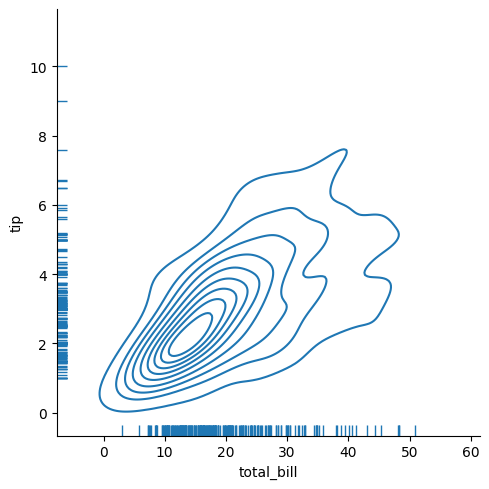

In [ ]:
sns.displot(data=tips, kind="kde", x="total_bill", y="tip", rug=True)

<Axes: xlabel='species', ylabel='count'>

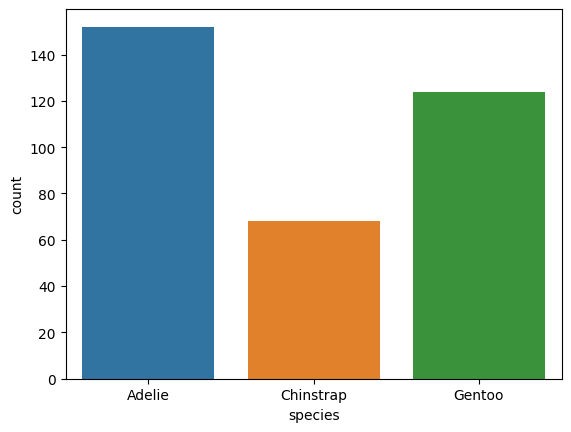

In [ ]:
#192. Countplot
sns.countplot(data=penguins, x="species")

In [ ]:
import seaborn as sns
penguins = sns.load_dataset("penguins")
penguins

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,Female
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,Male
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,Female


<Axes: xlabel='species', ylabel='count'>

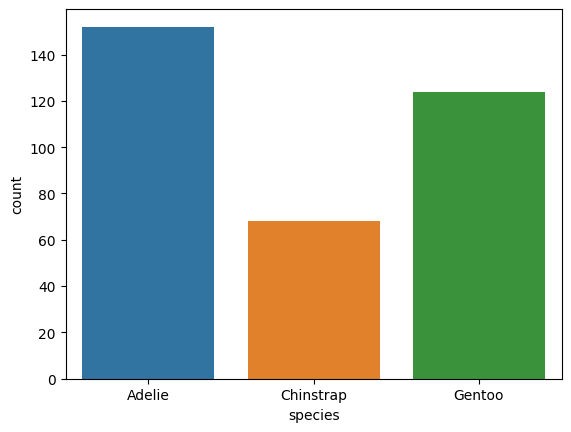

In [ ]:
sns.countplot(data=penguins, x="species")

In [ ]:
penguins["species"].value_counts()

Adelie       152
Gentoo       124
Chinstrap     68
Name: species, dtype: int64

<Axes: >

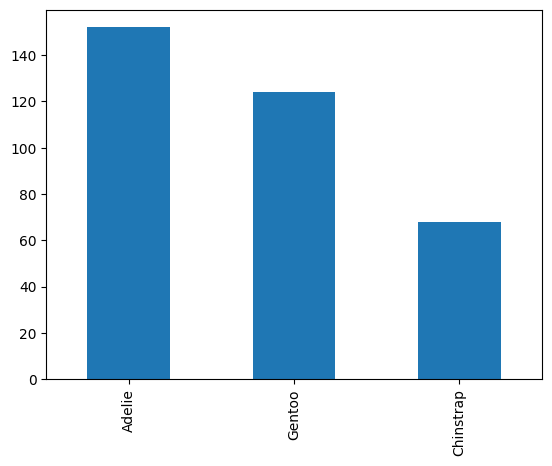

In [ ]:
penguins["species"].value_counts().plot(kind="bar")

<Axes: >

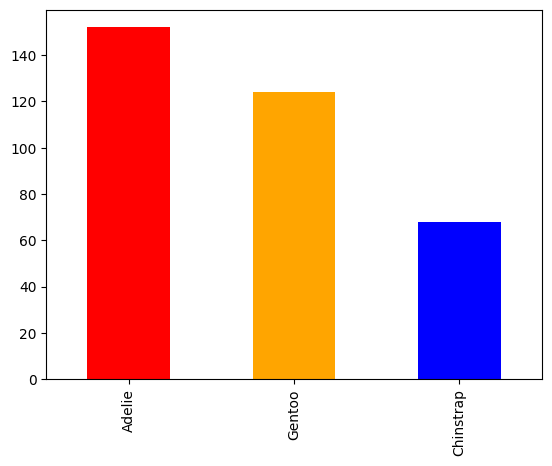

In [ ]:
penguins["species"].value_counts().plot(kind="bar", color=["red", "orange", "blue"])

<Axes: xlabel='species', ylabel='count'>

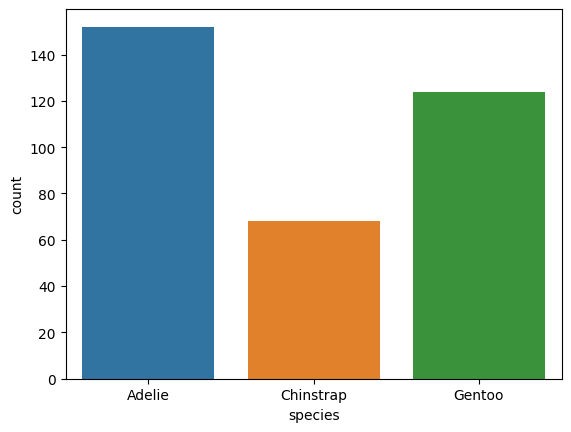

In [ ]:
sns.countplot(data=penguins, x="species")

<Axes: xlabel='species', ylabel='count'>

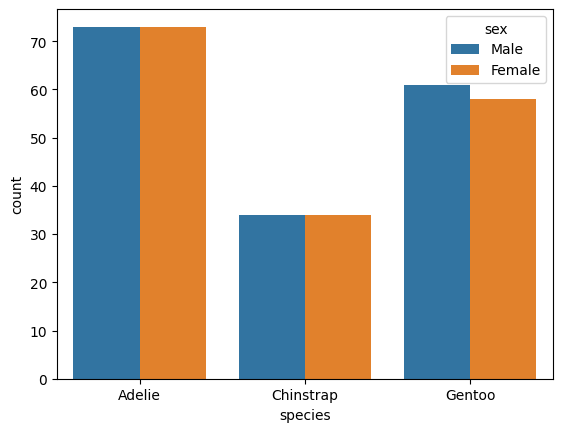

In [ ]:
sns.countplot(data=penguins, x="species", hue="sex")

In [ ]:
import pandas as pd
titanic = pd.read_csv('/content/drive/MyDrive/DataAnalysis/data/titanic.csv')
titanic

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest
0,1,1,"Allen, Miss. Elisabeth Walton",female,29,0,0,24160,211.3375,B5,S,2,?,"St Louis, MO"
1,1,1,"Allison, Master. Hudson Trevor",male,0.9167,1,2,113781,151.55,C22 C26,S,11,?,"Montreal, PQ / Chesterville, ON"
2,1,0,"Allison, Miss. Helen Loraine",female,2,1,2,113781,151.55,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON"
3,1,0,"Allison, Mr. Hudson Joshua Creighton",male,30,1,2,113781,151.55,C22 C26,S,?,135,"Montreal, PQ / Chesterville, ON"
4,1,0,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25,1,2,113781,151.55,C22 C26,S,?,?,"Montreal, PQ / Chesterville, ON"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1304,3,0,"Zabour, Miss. Hileni",female,14.5,1,0,2665,14.4542,?,C,?,328,?
1305,3,0,"Zabour, Miss. Thamine",female,?,1,0,2665,14.4542,?,C,?,?,?
1306,3,0,"Zakarian, Mr. Mapriededer",male,26.5,0,0,2656,7.225,?,C,?,304,?
1307,3,0,"Zakarian, Mr. Ortin",male,27,0,0,2670,7.225,?,C,?,?,?


<Axes: xlabel='pclass', ylabel='count'>

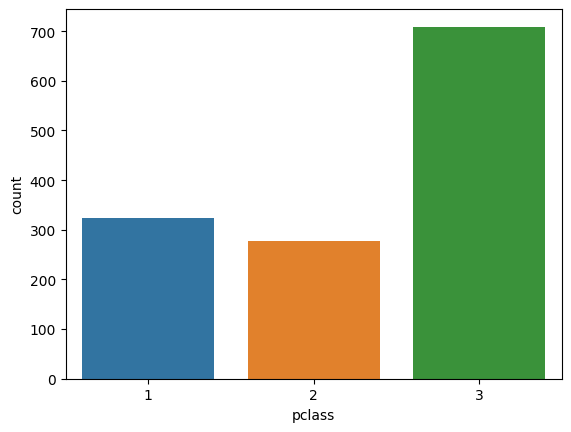

In [ ]:
import seaborn as sns
sns.countplot(titanic, x="pclass")

<Axes: xlabel='pclass', ylabel='count'>

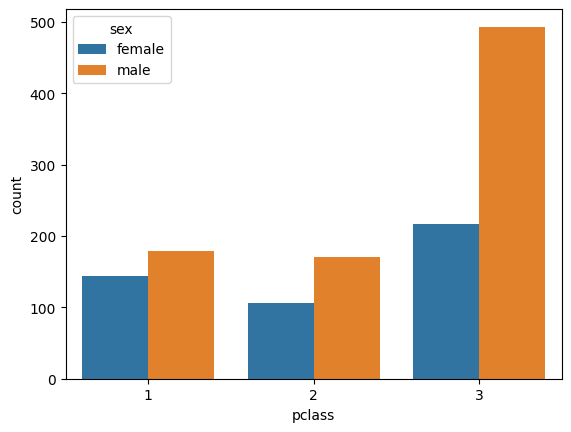

In [ ]:
sns.countplot(titanic, x="pclass", hue="sex")

<Axes: xlabel='count', ylabel='pclass'>

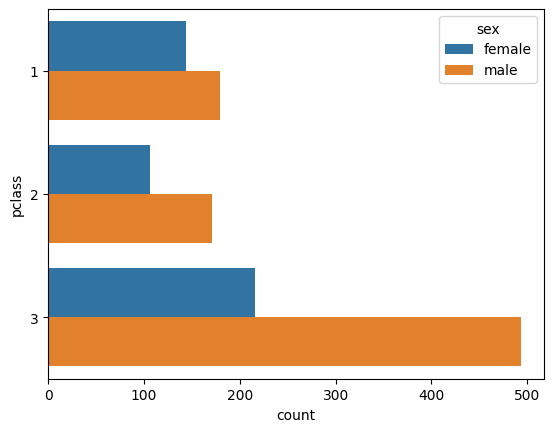

In [ ]:
sns.countplot(titanic, y="pclass", hue="sex")

In [ ]:
# 193. Strip & Swarm Plots
import seaborn as sns
trips = sns.load_dataset("taxis", parse_dates=["pickup", "dropoff"]).dropna()
trips
trips["hour"] = trips["pickup"].dt.hour
trips

,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,pickup_zone,dropoff_zone,pickup_borough,dropoff_borough,hour
0,2019-03-23 20:21:09,2019-03-23 20:27:24,1,1.60,7.0,2.15,0.0,12.95,yellow,credit card,Lenox Hill West,UN/Turtle Bay South,Manhattan,Manhattan,20
1,2019-03-04 16:11:55,2019-03-04 16:19:00,1,0.79,5.0,0.00,0.0,9.30,yellow,cash,Upper West Side South,Upper West Side South,Manhattan,Manhattan,16
2,2019-03-27 17:53:01,2019-03-27 18:00:25,1,1.37,7.5,2.36,0.0,14.16,yellow,credit card,Alphabet City,West Village,Manhattan,Manhattan,17
3,2019-03-10 01:23:59,2019-03-10 01:49:51,1,7.70,27.0,6.15,0.0,36.95,yellow,credit card,Hudson Sq,Yorkville West,Manhattan,Manhattan,1
4,2019-03-30 13:27:42,2019-03-30 13:37:14,3,2.16,9.0,1.10,0.0,13.40,yellow,credit card,Midtown East,Yorkville West,Manhattan,Manhattan,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6428,2019-03-31 09:51:53,2019-03-31 09:55:27,1,0.75,4.5,1.06,0.0,6.36,green,credit card,East Harlem North,Central Harlem North,Manhattan,Manhattan,9
6429,2019-03-31 17:38:00,2019-03-31 18:34:23,1,18.74,58.0,0.00,0.0,58.80,green,credit card,Jamaica,East Concourse/Concourse Village,Queens,Bronx,17
6430,2019-03-23 22:55:18,2019-03-23 23:14:25,1,4.14,16.0,0.00,0.0,17.30,green,cash,Crown Heights North,Bushwick North,Brooklyn,Brooklyn,22
6431,2019-03-04 10:09:25,2019-03-04 10:14:29,1,1.12,6.0,0.00,0.0,6.80,green,credit card,East New York,East Flatbush/Remsen Village,Brooklyn,Brooklyn,10


<Axes: xlabel='pickup_borough', ylabel='distance'>

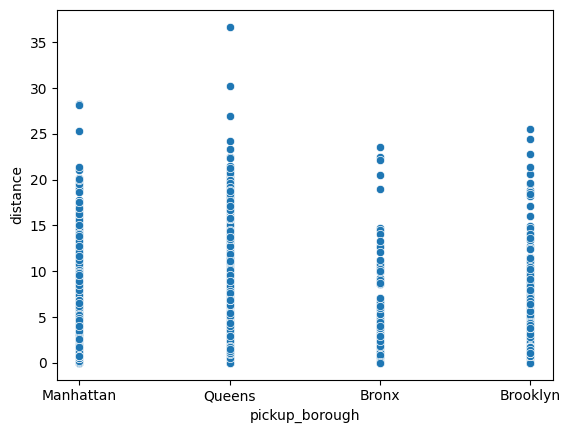

In [ ]:
sns.scatterplot(data=trips, x="pickup_borough", y="distance")

<Axes: xlabel='pickup_borough', ylabel='distance'>

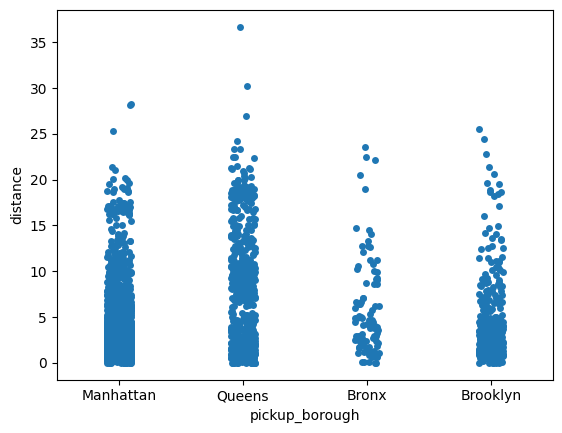

In [ ]:
sns.stripplot(data=trips, x="pickup_borough", y="distance")

<Axes: xlabel='pickup_borough', ylabel='distance'>

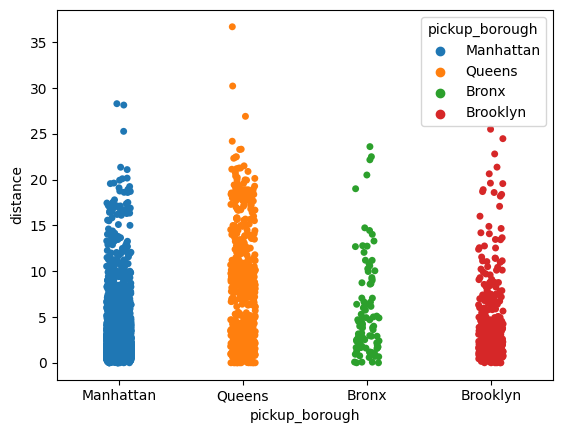

In [ ]:
sns.stripplot(data=trips, x="pickup_borough", y="distance", hue="pickup_borough")

In [ ]:
trips_sample = trips.nlargest(600, "total")
trips

,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,pickup_zone,dropoff_zone,pickup_borough,dropoff_borough,hour
0,2019-03-23 20:21:09,2019-03-23 20:27:24,1,1.60,7.0,2.15,0.0,12.95,yellow,credit card,Lenox Hill West,UN/Turtle Bay South,Manhattan,Manhattan,20
1,2019-03-04 16:11:55,2019-03-04 16:19:00,1,0.79,5.0,0.00,0.0,9.30,yellow,cash,Upper West Side South,Upper West Side South,Manhattan,Manhattan,16
2,2019-03-27 17:53:01,2019-03-27 18:00:25,1,1.37,7.5,2.36,0.0,14.16,yellow,credit card,Alphabet City,West Village,Manhattan,Manhattan,17
3,2019-03-10 01:23:59,2019-03-10 01:49:51,1,7.70,27.0,6.15,0.0,36.95,yellow,credit card,Hudson Sq,Yorkville West,Manhattan,Manhattan,1
4,2019-03-30 13:27:42,2019-03-30 13:37:14,3,2.16,9.0,1.10,0.0,13.40,yellow,credit card,Midtown East,Yorkville West,Manhattan,Manhattan,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6428,2019-03-31 09:51:53,2019-03-31 09:55:27,1,0.75,4.5,1.06,0.0,6.36,green,credit card,East Harlem North,Central Harlem North,Manhattan,Manhattan,9
6429,2019-03-31 17:38:00,2019-03-31 18:34:23,1,18.74,58.0,0.00,0.0,58.80,green,credit card,Jamaica,East Concourse/Concourse Village,Queens,Bronx,17
6430,2019-03-23 22:55:18,2019-03-23 23:14:25,1,4.14,16.0,0.00,0.0,17.30,green,cash,Crown Heights North,Bushwick North,Brooklyn,Brooklyn,22
6431,2019-03-04 10:09:25,2019-03-04 10:14:29,1,1.12,6.0,0.00,0.0,6.80,green,credit card,East New York,East Flatbush/Remsen Village,Brooklyn,Brooklyn,10


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 16.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 12.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


<Axes: xlabel='pickup_borough', ylabel='distance'>

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 22.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 22.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 22.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


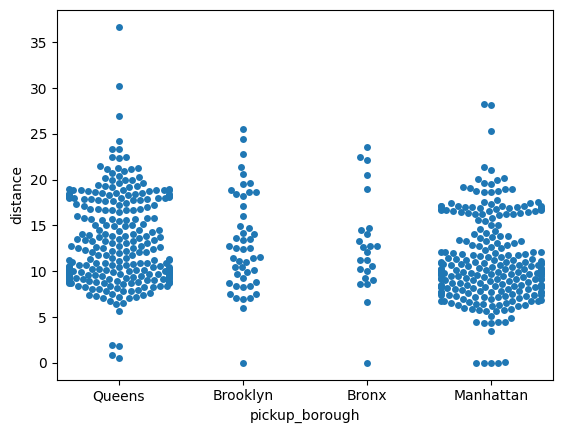

In [ ]:
sns.swarmplot(data=trips_sample, x="pickup_borough", y="distance")

In [ ]:
sns.swarmplot(data=trips_sample, x="pickup_borough", y="distance")

<Axes: xlabel='pickup_borough', ylabel='distance'>

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 7.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 5.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


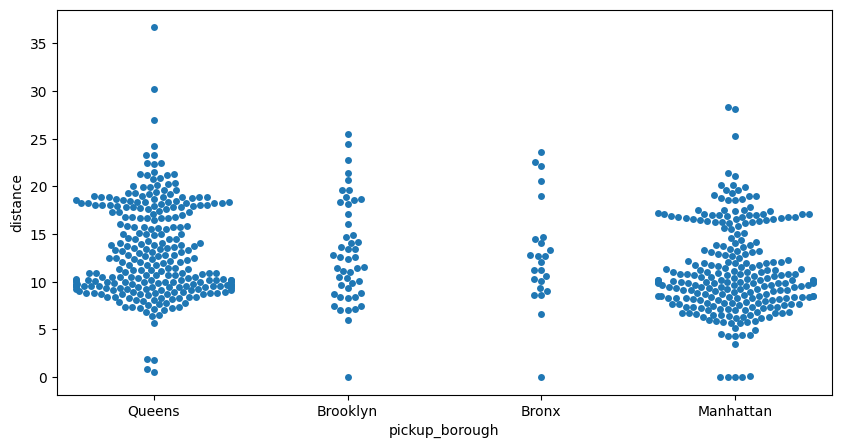

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
sns.swarmplot(data=trips_sample, x="pickup_borough", y="distance")

<Axes: xlabel='pickup_borough', ylabel='distance'>

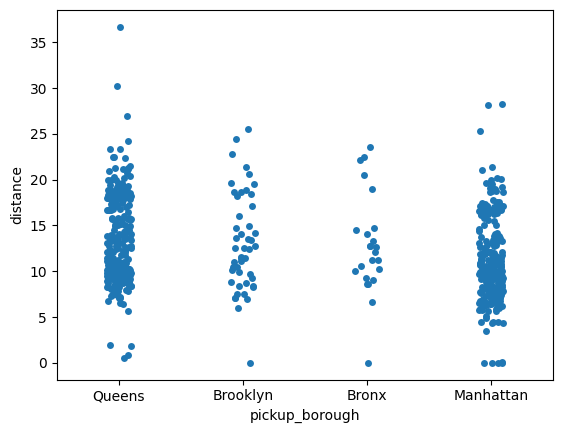

In [ ]:
sns.stripplot(data=trips_sample, x="pickup_borough", y="distance")

In [ ]:
# 194. Boxplots
import seaborn as sns
iris = sns.load_dataset("iris")
iris

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


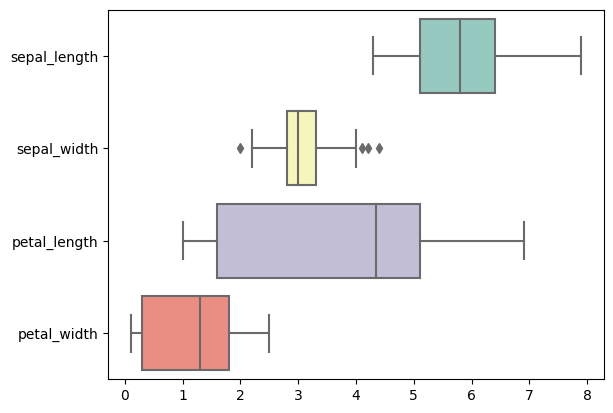

In [ ]:
ax = sns.boxplot(data=iris, orient="h", palette="Set3")

In [ ]:
iris

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [ ]:
iris["petal_length"]

0      1.4
1      1.4
2      1.3
3      1.5
4      1.4
      ... 
145    5.2
146    5.0
147    5.2
148    5.4
149    5.1
Name: petal_length, Length: 150, dtype: float64

In [ ]:
iris["petal_length"].median()

4.35

In [ ]:
import seaborn as sns
titanic = sns.load_dataset("titanic")
titanic

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,0,2,male,27.0,0,0,13.0000,S,Second,man,True,NaN,Southampton,no,True
887,1,1,female,19.0,0,0,30.0000,S,First,woman,False,B,Southampton,yes,True
888,0,3,female,NaN,1,2,23.4500,S,Third,woman,False,NaN,Southampton,no,False
889,1,1,male,26.0,0,0,30.0000,C,First,man,True,C,Cherbourg,yes,True


<Axes: xlabel='age'>

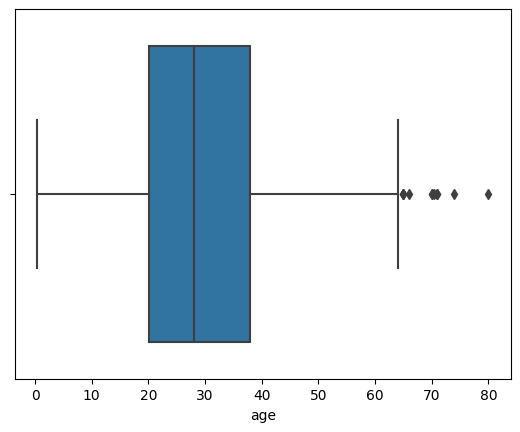

In [ ]:
sns.boxplot(data=titanic, x="age")

In [ ]:
trips = sns.load_dataset("taxis", parse_dates=["pickup", "dropoff"])
trips

,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,pickup_zone,dropoff_zone,pickup_borough,dropoff_borough
0,2019-03-23 20:21:09,2019-03-23 20:27:24,1,1.60,7.0,2.15,0.0,12.95,yellow,credit card,Lenox Hill West,UN/Turtle Bay South,Manhattan,Manhattan
1,2019-03-04 16:11:55,2019-03-04 16:19:00,1,0.79,5.0,0.00,0.0,9.30,yellow,cash,Upper West Side South,Upper West Side South,Manhattan,Manhattan
2,2019-03-27 17:53:01,2019-03-27 18:00:25,1,1.37,7.5,2.36,0.0,14.16,yellow,credit card,Alphabet City,West Village,Manhattan,Manhattan
3,2019-03-10 01:23:59,2019-03-10 01:49:51,1,7.70,27.0,6.15,0.0,36.95,yellow,credit card,Hudson Sq,Yorkville West,Manhattan,Manhattan
4,2019-03-30 13:27:42,2019-03-30 13:37:14,3,2.16,9.0,1.10,0.0,13.40,yellow,credit card,Midtown East,Yorkville West,Manhattan,Manhattan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6428,2019-03-31 09:51:53,2019-03-31 09:55:27,1,0.75,4.5,1.06,0.0,6.36,green,credit card,East Harlem North,Central Harlem North,Manhattan,Manhattan
6429,2019-03-31 17:38:00,2019-03-31 18:34:23,1,18.74,58.0,0.00,0.0,58.80,green,credit card,Jamaica,East Concourse/Concourse Village,Queens,Bronx
6430,2019-03-23 22:55:18,2019-03-23 23:14:25,1,4.14,16.0,0.00,0.0,17.30,green,cash,Crown Heights North,Bushwick North,Brooklyn,Brooklyn
6431,2019-03-04 10:09:25,2019-03-04 10:14:29,1,1.12,6.0,0.00,0.0,6.80,green,credit card,East New York,East Flatbush/Remsen Village,Brooklyn,Brooklyn


<Axes: xlabel='pickup_borough', ylabel='total'>

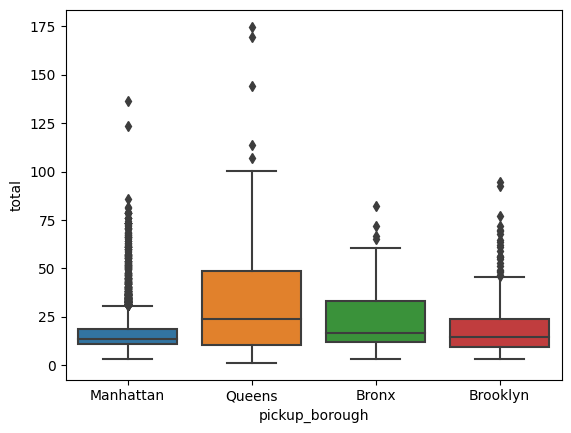

In [ ]:
sns.boxplot(trips, x="pickup_borough", y="total")

<Axes: xlabel='pickup_borough', ylabel='total'>

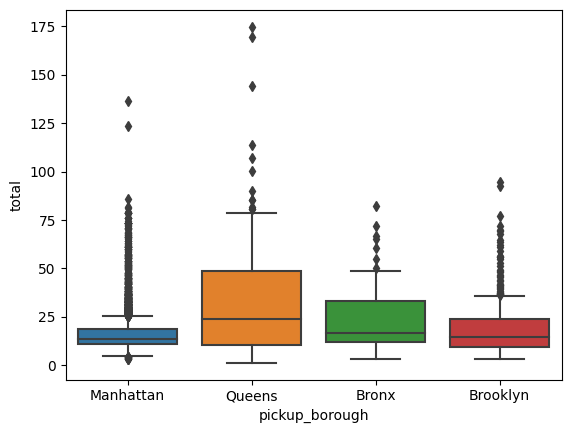

In [ ]:
sns.boxplot(trips, x="pickup_borough", y="total", whis=0.8)

In [ ]:
titanic

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,0,2,male,27.0,0,0,13.0000,S,Second,man,True,NaN,Southampton,no,True
887,1,1,female,19.0,0,0,30.0000,S,First,woman,False,B,Southampton,yes,True
888,0,3,female,NaN,1,2,23.4500,S,Third,woman,False,NaN,Southampton,no,False
889,1,1,male,26.0,0,0,30.0000,C,First,man,True,C,Cherbourg,yes,True


<Axes: xlabel='pclass', ylabel='age'>

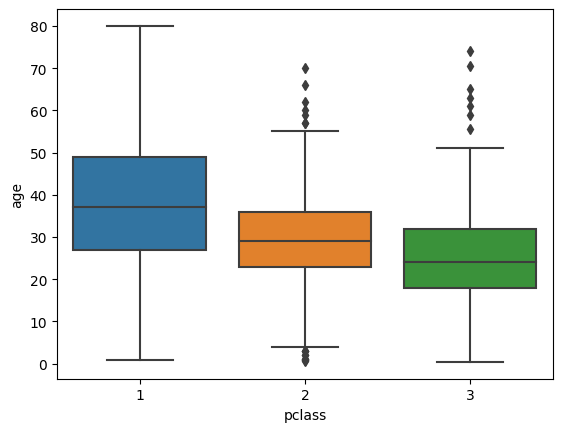

In [ ]:
sns.boxplot(titanic, x="pclass", y="age")

<Axes: xlabel='pclass', ylabel='age'>

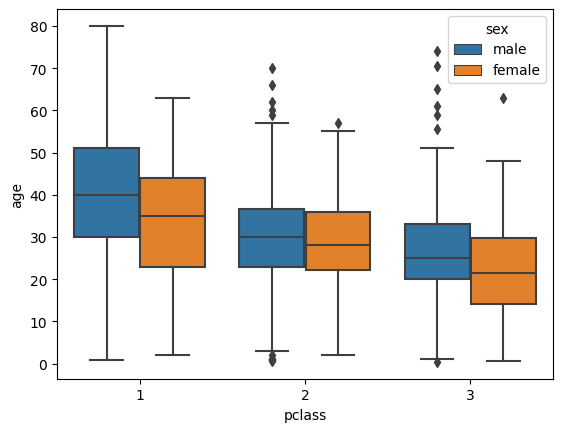

In [ ]:
sns.boxplot(titanic, x="pclass", y="age", hue="sex")

<Axes: xlabel='pclass', ylabel='age'>

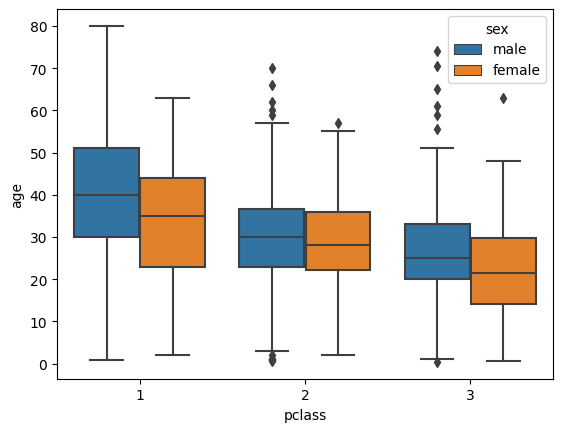

In [ ]:
sns.boxplot(titanic, x="pclass", y="age", hue="sex")

<Axes: xlabel='pclass', ylabel='age'>

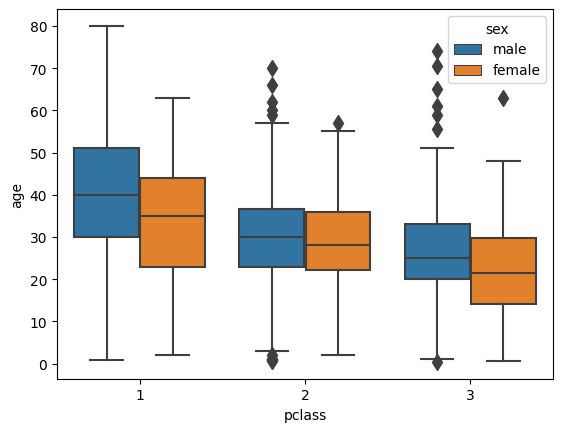

In [ ]:
sns.boxplot(titanic, x="pclass", y="age", hue="sex", fliersize=8)

In [ ]:
penguins = sns.load_dataset("penguins")
penguins

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,Female
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,Male
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,Female


<Axes: xlabel='species', ylabel='body_mass_g'>

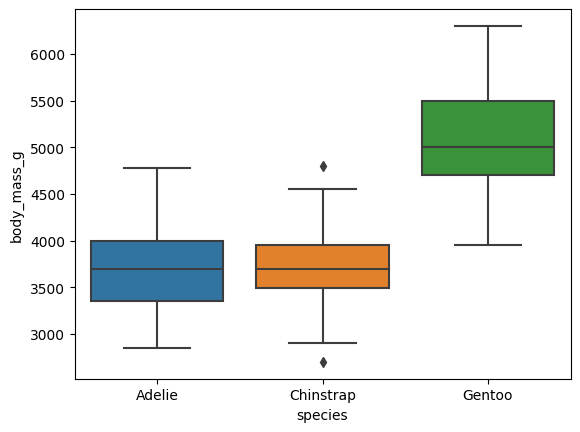

In [ ]:
sns.boxplot(penguins, x="species", y="body_mass_g")

<Axes: xlabel='species', ylabel='body_mass_g'>

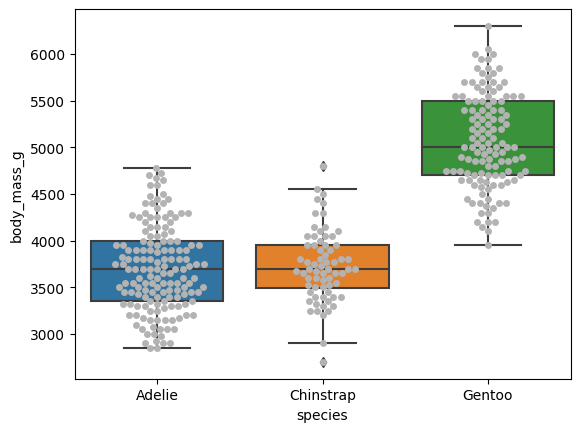

In [ ]:
sns.boxplot(penguins, x="species", y="body_mass_g")
sns.swarmplot(penguins, x="species", y="body_mass_g", color="0.7")

In [ ]:
sns.boxenplot(penguins, x="species", y="body_mass_g")
sns.swarmplot(penguins, x="species", y="body_mass_g", color="0.7")

In [ ]:
# 195. Boxenplots
import seaborn as sns
trips = sns.load_dataset("taxis")
trips

,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,pickup_zone,dropoff_zone,pickup_borough,dropoff_borough
0,2019-03-23 20:21:09,2019-03-23 20:27:24,1,1.60,7.0,2.15,0.0,12.95,yellow,credit card,Lenox Hill West,UN/Turtle Bay South,Manhattan,Manhattan
1,2019-03-04 16:11:55,2019-03-04 16:19:00,1,0.79,5.0,0.00,0.0,9.30,yellow,cash,Upper West Side South,Upper West Side South,Manhattan,Manhattan
2,2019-03-27 17:53:01,2019-03-27 18:00:25,1,1.37,7.5,2.36,0.0,14.16,yellow,credit card,Alphabet City,West Village,Manhattan,Manhattan
3,2019-03-10 01:23:59,2019-03-10 01:49:51,1,7.70,27.0,6.15,0.0,36.95,yellow,credit card,Hudson Sq,Yorkville West,Manhattan,Manhattan
4,2019-03-30 13:27:42,2019-03-30 13:37:14,3,2.16,9.0,1.10,0.0,13.40,yellow,credit card,Midtown East,Yorkville West,Manhattan,Manhattan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6428,2019-03-31 09:51:53,2019-03-31 09:55:27,1,0.75,4.5,1.06,0.0,6.36,green,credit card,East Harlem North,Central Harlem North,Manhattan,Manhattan
6429,2019-03-31 17:38:00,2019-03-31 18:34:23,1,18.74,58.0,0.00,0.0,58.80,green,credit card,Jamaica,East Concourse/Concourse Village,Queens,Bronx
6430,2019-03-23 22:55:18,2019-03-23 23:14:25,1,4.14,16.0,0.00,0.0,17.30,green,cash,Crown Heights North,Bushwick North,Brooklyn,Brooklyn
6431,2019-03-04 10:09:25,2019-03-04 10:14:29,1,1.12,6.0,0.00,0.0,6.80,green,credit card,East New York,East Flatbush/Remsen Village,Brooklyn,Brooklyn


<Axes: xlabel='pickup_borough', ylabel='total'>

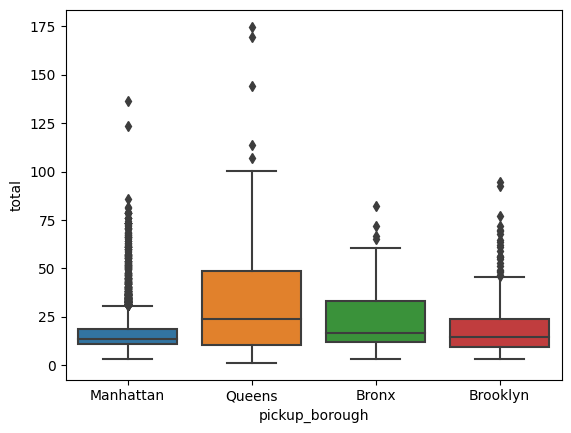

In [ ]:
sns.boxplot(trips, x="pickup_borough", y="total")

<Axes: xlabel='pickup_borough', ylabel='total'>

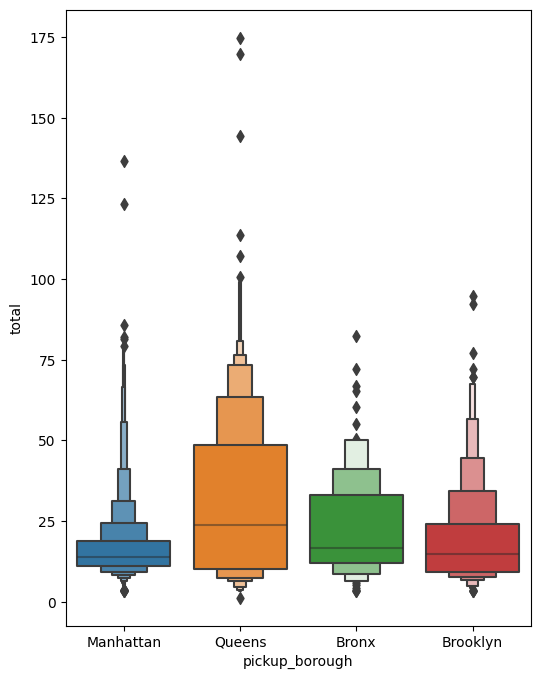

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(6, 8))
sns.boxenplot(trips, x="pickup_borough", y="total")

<Axes: xlabel='age'>

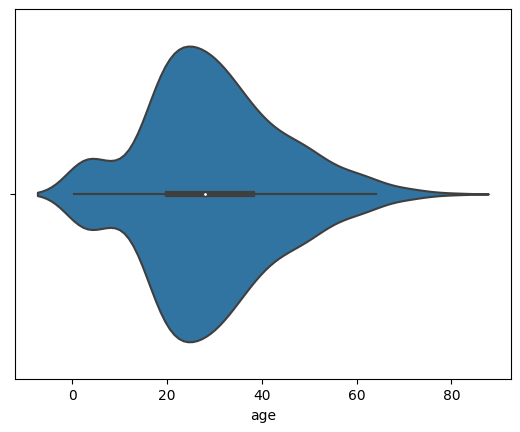

In [ ]:
# 196. Violinplots
titanic = sns.load_dataset("titanic")
sns.violinplot(titanic, x="age")

<Axes: xlabel='age'>

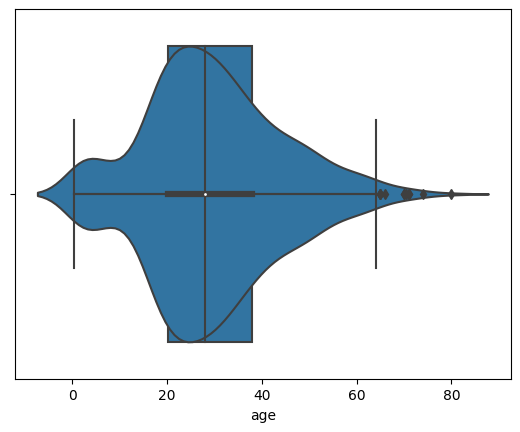

In [ ]:
titanic = sns.load_dataset("titanic")
sns.violinplot(titanic, x="age")
sns.boxplot(titanic, x="age")

<Axes: xlabel='pclass', ylabel='age'>

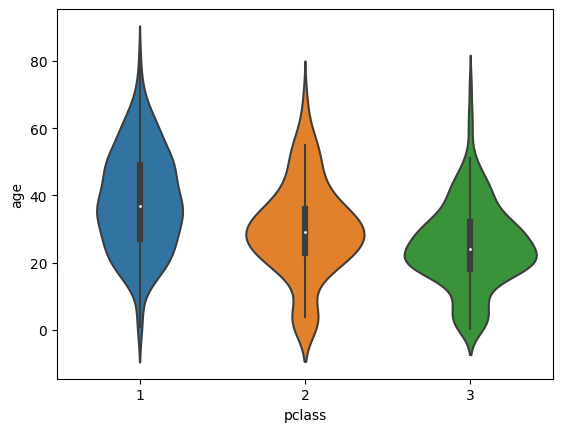

In [ ]:
sns.violinplot(titanic, x="pclass", y="age")

<Axes: xlabel='pclass', ylabel='age'>

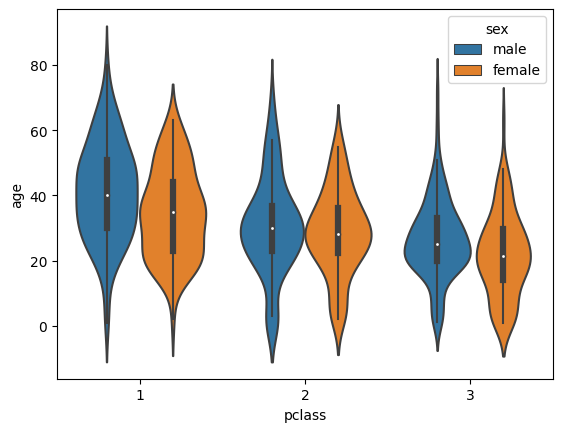

In [ ]:
sns.violinplot(titanic, x="pclass", y="age", hue="sex")

<Axes: xlabel='pclass', ylabel='age'>

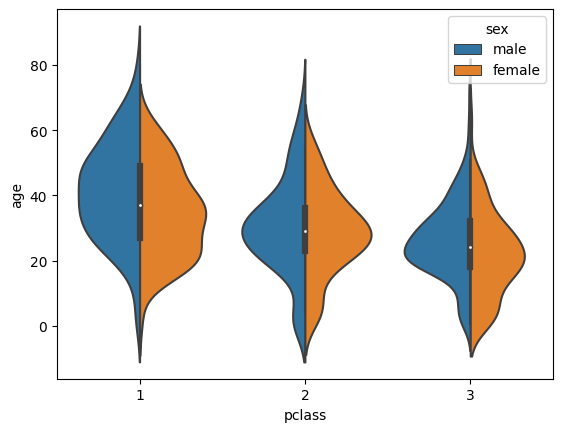

In [ ]:
sns.violinplot(titanic, x="pclass", y="age", hue="sex", split=True)

<Axes: xlabel='pickup_borough', ylabel='distance'>

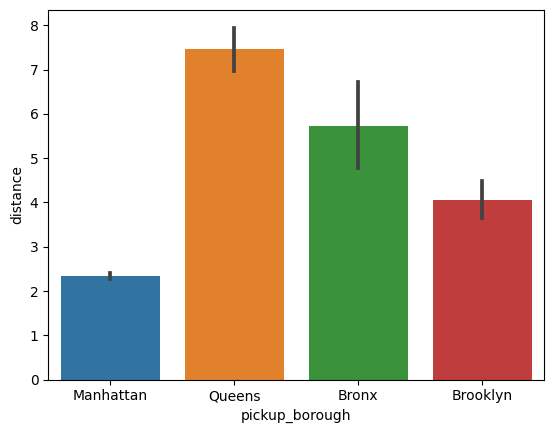

In [ ]:
# 197. Barplots
import seaborn as sns
trips = sns.load_dataset("taxis")
sns.barplot(trips, x="pickup_borough",y="distance")

In [ ]:
trips.groupby("pickup_borough")["distance"].mean()

pickup_borough
Bronx        5.725859
Brooklyn     4.058668
Manhattan    2.349723
Queens       7.465830
Name: distance, dtype: float64

In [ ]:
penguins = sns.load_dataset("penguins")
penguins

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,Female
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,Male
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,Female


<Axes: xlabel='species', ylabel='body_mass_g'>

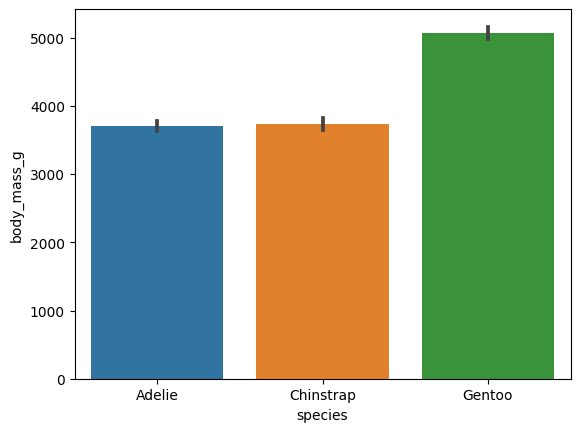

In [ ]:
sns.barplot(penguins, x="species", y="body_mass_g")

In [ ]:
penguins.groupby("species")["body_mass_g"].mean()

species
Adelie       3700.662252
Chinstrap    3733.088235
Gentoo       5076.016260
Name: body_mass_g, dtype: float64

In [ ]:
sns.barplot(penguins, y="species", x="body_mass_g")

NameError: ignored

In [ ]:
#  202. Changing Color Palettes

In [ ]:
import seaborn as sns
tips = sns.load_dataset("tips")

In [ ]:
tips

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


<Axes: xlabel='day', ylabel='total_bill'>

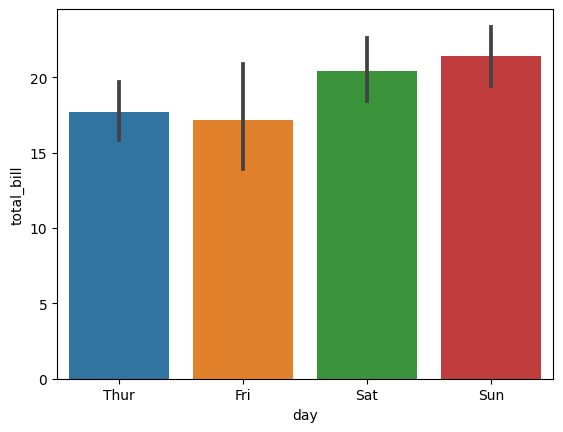

In [ ]:
sns.barplot(data=tips, x="day", y="total_bill")

<Axes: xlabel='day', ylabel='total_bill'>

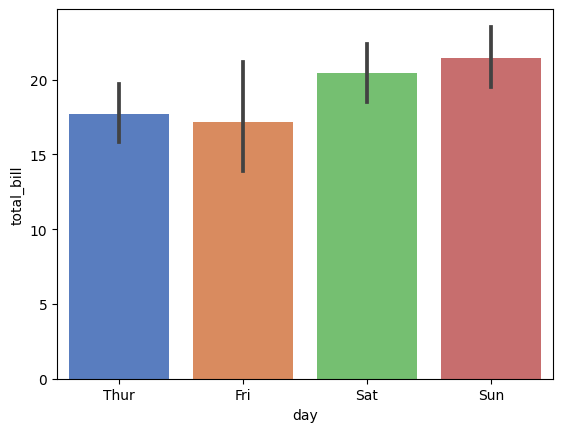

In [ ]:
sns.set_palette("muted")
sns.barplot(data=tips, x="day", y="total_bill")

<Axes: xlabel='day', ylabel='total_bill'>

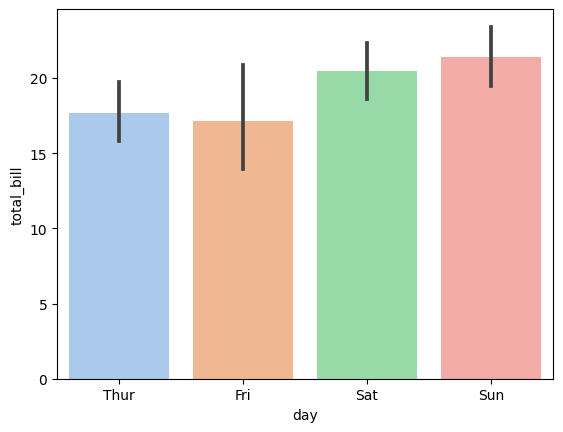

In [ ]:
sns.set_palette("pastel")
sns.barplot(data=tips, x="day", y="total_bill")


In [ ]:
sns.color_palette("Blues")

[(0.8584083044982699, 0.9134486735870818, 0.9645674740484429),
 (0.7309496347558632, 0.8394771241830065, 0.9213225682429834),
 (0.5356862745098039, 0.746082276047674, 0.8642522106881968),
 (0.32628988850442137, 0.6186236063052672, 0.802798923490965),
 (0.16696655132641292, 0.48069204152249134, 0.7291503267973857),
 (0.044059976931949255, 0.3338869665513264, 0.6244521337946944)]

In [ ]:
sns.color_palette("ocean")

[(0.0, 0.28823529411764703, 0.1411764705882353),
 (0.0, 0.07058823529411767, 0.28627450980392155),
 (0.0, 0.14117647058823524, 0.42745098039215684),
 (0.0, 0.35882352941176465, 0.5725490196078431),
 (0.14117647058823524, 0.5705882352941176, 0.7137254901960784),
 (0.5764705882352938, 0.7882352941176469, 0.8588235294117647)]

In [ ]:
sns.color_palette("gist_rainbow")

[(1.0, 0.6009538950715422, 0.0),
 (0.6147323794382618, 1.0, 0.0),
 (0.0, 1.0, 0.14758591608686492),
 (0.0, 1.0, 0.9276829011174367),
 (0.0, 0.3058397271952257, 1.0),
 (0.4827365728900258, 0.0, 1.0)]

In [ ]:
sns.color_palette("terrain")

[(0.011764705882352955, 0.5764705882352941, 0.9764705882352941),
 (0.1450980392156863, 0.8290196078431373, 0.42901960784313725),
 (0.7098039215686275, 0.9419607843137255, 0.5419607843137255),
 (0.8549019607843137, 0.8142745098039216, 0.5216470588235294),
 (0.5725490196078431, 0.45286274509803925, 0.36917647058823533),
 (0.7176470588235294, 0.6385882352941177, 0.6216470588235294)]

In [ ]:
sns.color_palette("terrain", 4)

[(0.0, 0.7, 0.7),
 (0.6, 0.92, 0.52),
 (0.8, 0.744, 0.492),
 (0.6, 0.488, 0.46399999999999997)]

In [ ]:
sns.color_palette("terrain", 10)

[(0.07973856209150328, 0.44052287581699345, 0.8405228758169935),
 (0.0, 0.6607843137254902, 0.8176470588235294),
 (0.08235294117647059, 0.8164705882352942, 0.41647058823529415),
 (0.4588235294117647, 0.891764705882353, 0.49176470588235294),
 (0.8196078431372549, 0.9639215686274509, 0.563921568627451),
 (0.9098039215686274, 0.8845490196078432, 0.5512941176470588),
 (0.7294117647058824, 0.6536470588235295, 0.4538823529411765),
 (0.5411764705882354, 0.41270588235294114, 0.3522352941176471),
 (0.6392156862745098, 0.5381960784313725, 0.5165490196078432),
 (0.8196078431372549, 0.7690980392156863, 0.7582745098039215)]

<Axes: xlabel='day', ylabel='total_bill'>

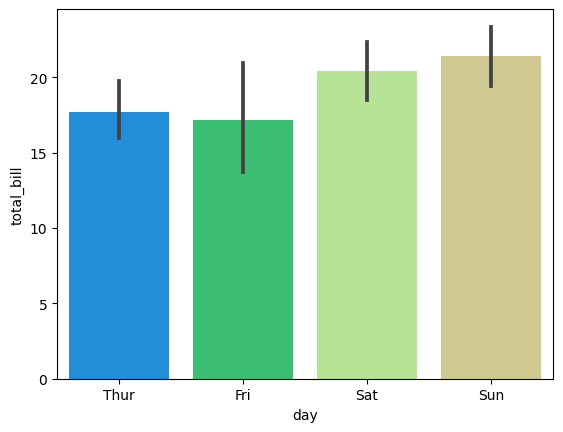

In [ ]:
sns.set_palette("terrain")
sns.barplot(tips, x="day", y="total_bill")


<Axes: xlabel='tip', ylabel='total_bill'>

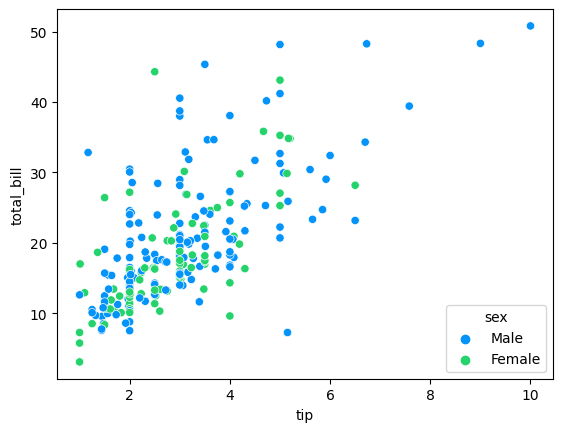

In [ ]:
sns.scatterplot(tips, x="tip", y="total_bill", hue="sex")

<Axes: xlabel='day', ylabel='total_bill'>

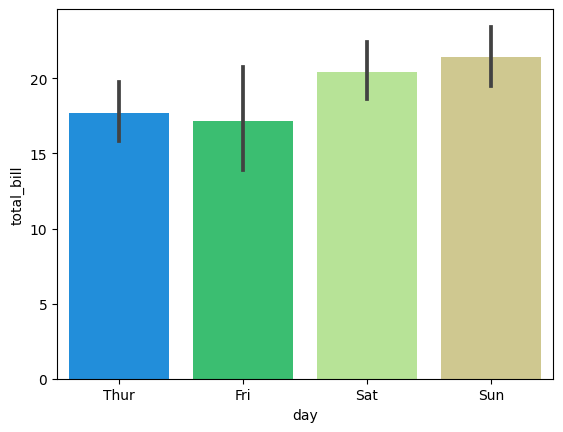

In [ ]:
sns.barplot(data=tips, x="day", y="total_bill")

<Axes: xlabel='day', ylabel='total_bill'>

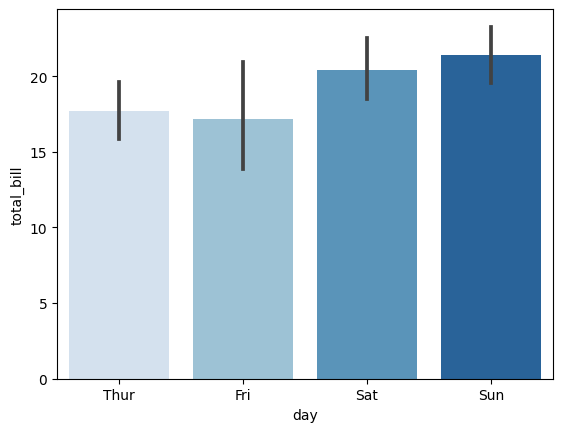

In [ ]:
sns.barplot(data=tips, x="day", y="total_bill", palette="Blues")

<Axes: xlabel='day', ylabel='total_bill'>

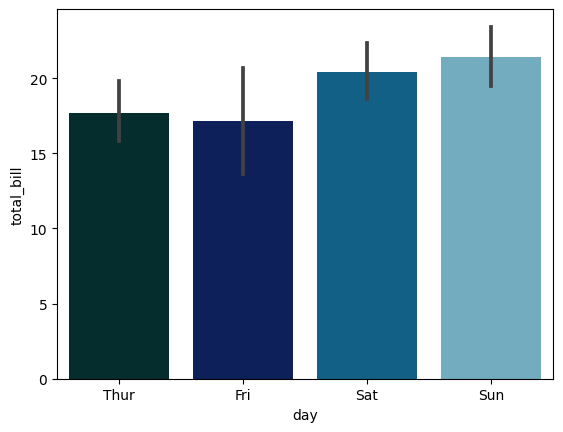

In [ ]:
sns.barplot(data=tips, x="day", y="total_bill", palette="ocean")

<Axes: xlabel='day', ylabel='total_bill'>

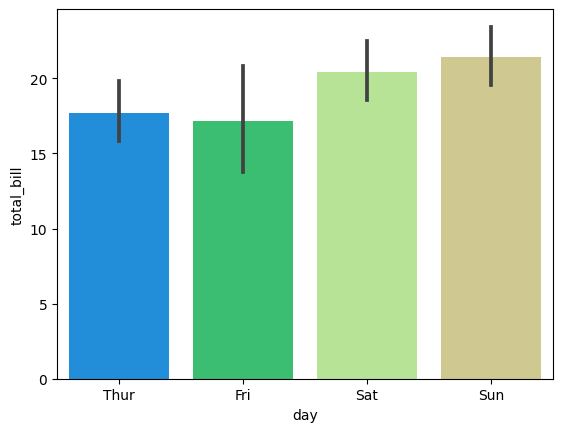

In [ ]:
sns.barplot(data=tips, x="day", y="total_bill")

<Axes: xlabel='day', ylabel='total_bill'>

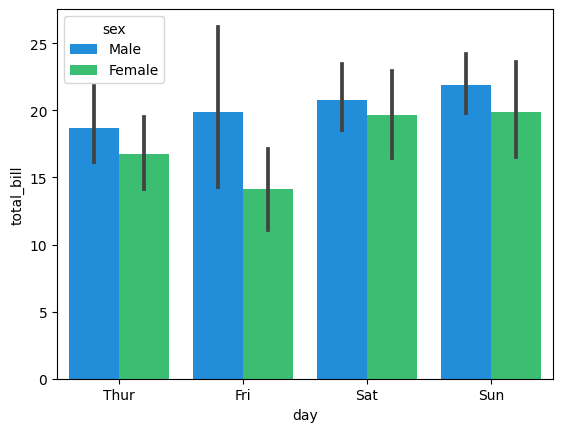

In [ ]:
sns.barplot(data=tips, x="day", y="total_bill", hue="sex")

<Axes: xlabel='tip', ylabel='Density'>

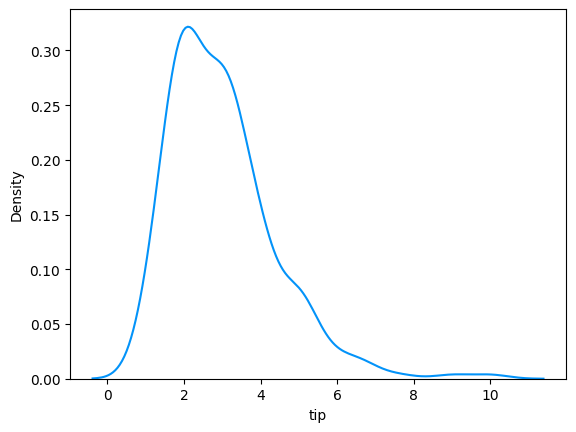

In [ ]:
mbsns.kdeplot(tips, x="tip")sns.kdeplot(tips, x="tip")

<Axes: xlabel='tip', ylabel='Density'>

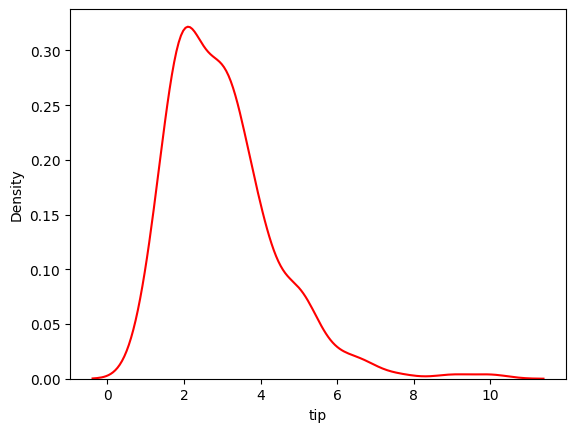

In [ ]:
sns.kdeplot(tips, x="tip", color="red")

In [ ]:
mb